# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    used += ['wml']
    D = ', '.join(used)
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
df = preprocessing(df,
                   used=['mvol_cum6', 'cum_loser_t_2_4', 'cum_loser_t_5_8', 'cum_loser_t_9_12', 'cum_winner'])

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_cum6, cum_loser_t_2_4, cum_loser_t_5_8, cum_loser_t_9_12, cum_winner, wml


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [13]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [16]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [19]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [20]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [21]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28       316
         1.0       0.65      0.77      0.71       590

    accuracy                           0.58       906
   macro avg       0.50      0.50      0.49       906
weighted avg       0.55      0.58      0.56       906


accuracy : 0.5816777041942605

precision : 0.6509298998569385

recall : 0.7711864406779662

F1-Score : 0.7059736229635376



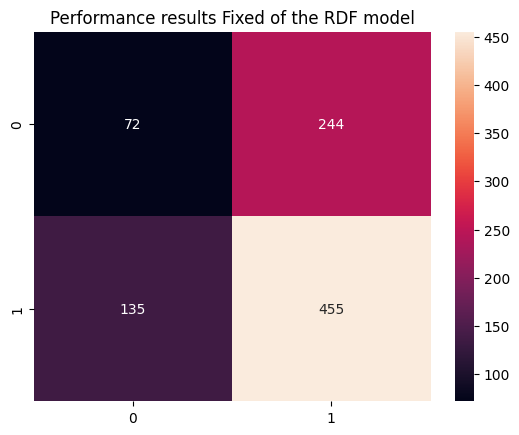


Feature Importance of the model



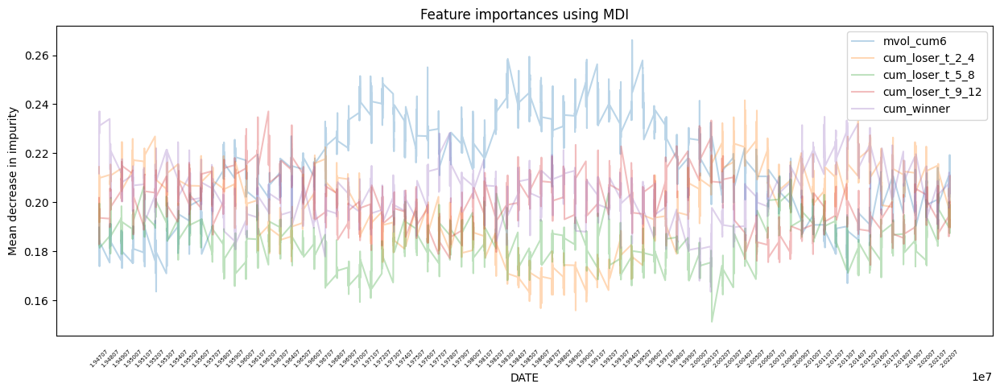

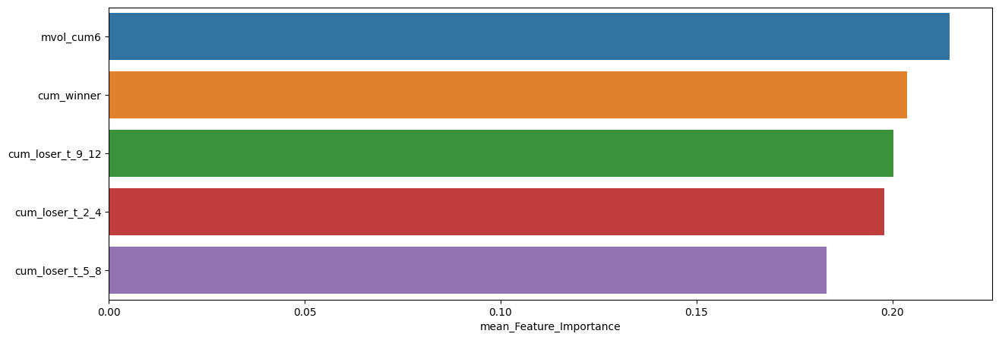

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.214716,0.266183,0.163522
cum_winner,0.203668,0.237078,0.163438
cum_loser_t_9_12,0.200362,0.237056,0.174415
cum_loser_t_2_4,0.197978,0.241598,0.155838
cum_loser_t_5_8,0.183276,0.210481,0.151211


In [22]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.25      0.29        75
         1.0       0.67      0.74      0.70       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.49       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5796460176991151

precision : 0.6666666666666666

recall : 0.7417218543046358

F1-Score : 0.702194357366771



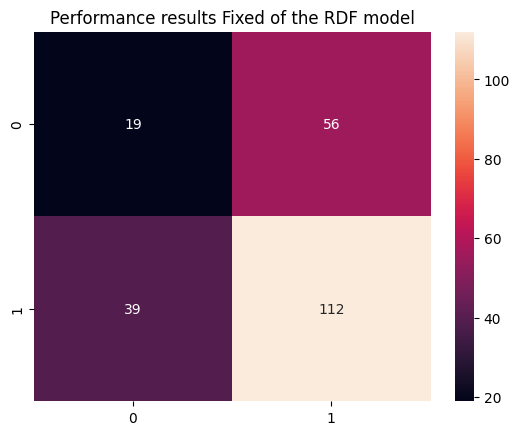


Feature Importance of the model



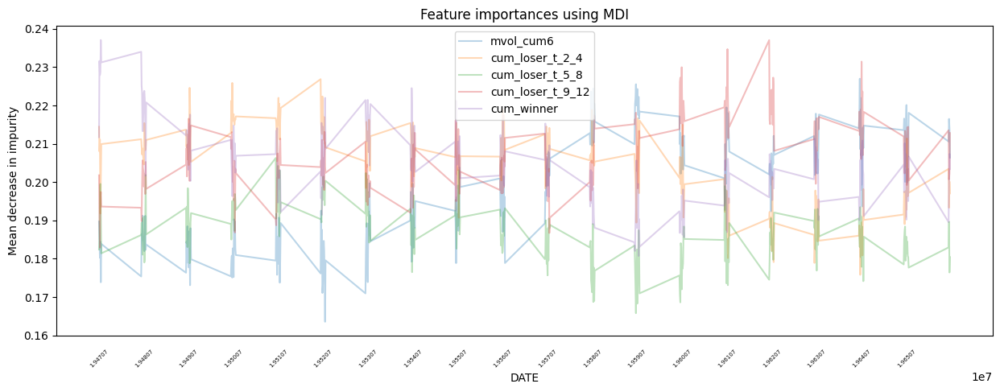

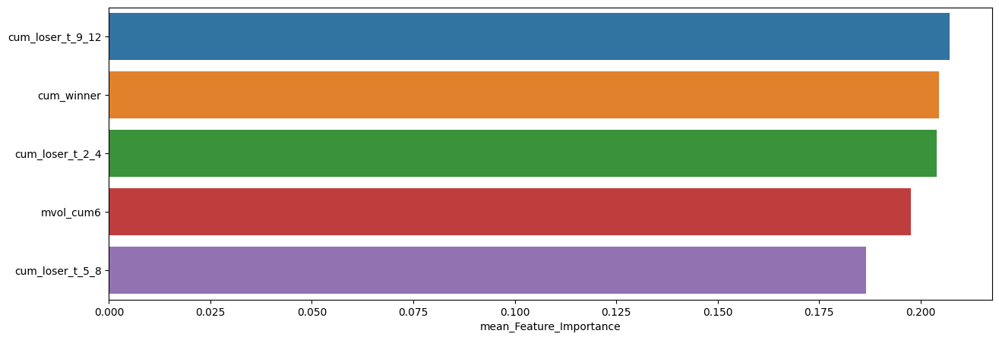

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.207264,0.237056,0.182884
cum_winner,0.204517,0.237078,0.180705
cum_loser_t_2_4,0.204049,0.226860,0.175782
mvol_cum6,0.197657,0.226982,0.163522
cum_loser_t_5_8,0.186513,0.206283,0.165760



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.21      0.26        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.60       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.60      0.57       226


accuracy : 0.6017699115044248

precision : 0.6703910614525139

recall : 0.7947019867549668

F1-Score : 0.7272727272727273



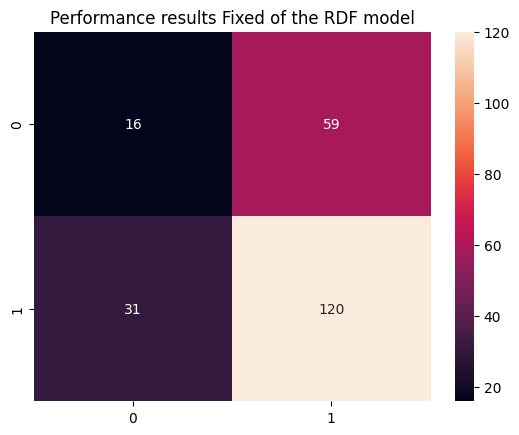


Feature Importance of the model



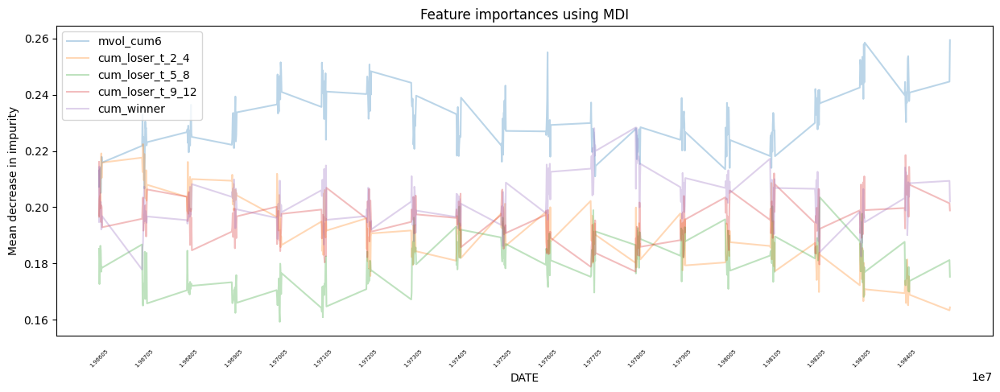

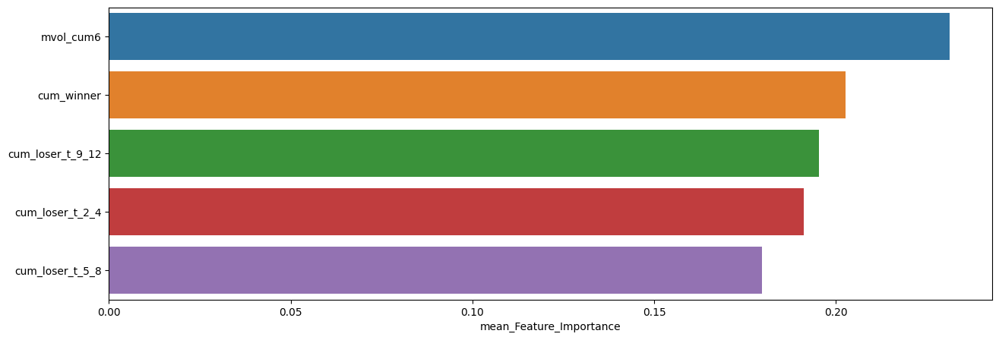

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.231355,0.259408,0.205081
cum_winner,0.202605,0.228320,0.177842
cum_loser_t_9_12,0.195253,0.218543,0.177122
cum_loser_t_2_4,0.191049,0.222441,0.163356
cum_loser_t_5_8,0.179737,0.203506,0.159266



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.23      0.29        70
         1.0       0.71      0.85      0.78       156

    accuracy                           0.66       226
   macro avg       0.56      0.54      0.53       226
weighted avg       0.62      0.66      0.63       226


accuracy : 0.6592920353982301

precision : 0.7112299465240641

recall : 0.8525641025641025

F1-Score : 0.7755102040816327



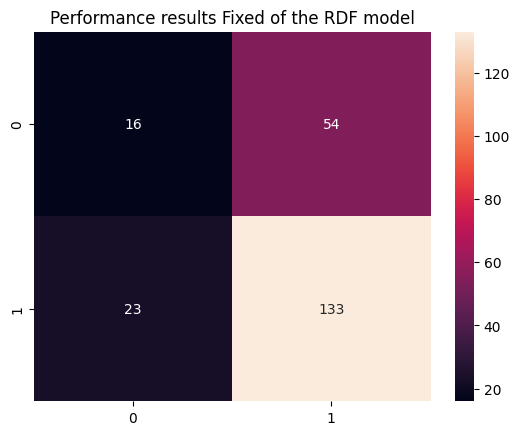


Feature Importance of the model



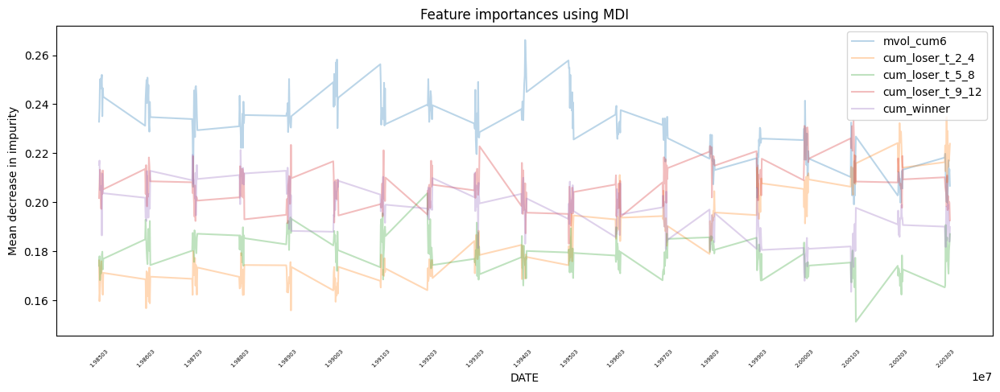

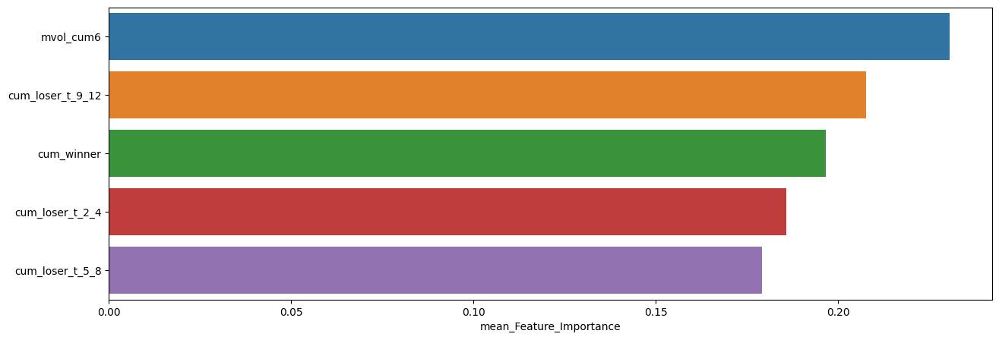

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.230675,0.266183,0.199094
cum_loser_t_9_12,0.207702,0.233380,0.183033
cum_winner,0.196611,0.221278,0.163438
cum_loser_t_2_4,0.185853,0.234684,0.155838
cum_loser_t_5_8,0.179159,0.203661,0.151211



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.22      0.26        96
         1.0       0.55      0.68      0.61       132

    accuracy                           0.49       228
   macro avg       0.44      0.45      0.44       228
weighted avg       0.46      0.49      0.46       228


accuracy : 0.4868421052631579

precision : 0.5454545454545454

recall : 0.6818181818181818

F1-Score : 0.6060606060606061



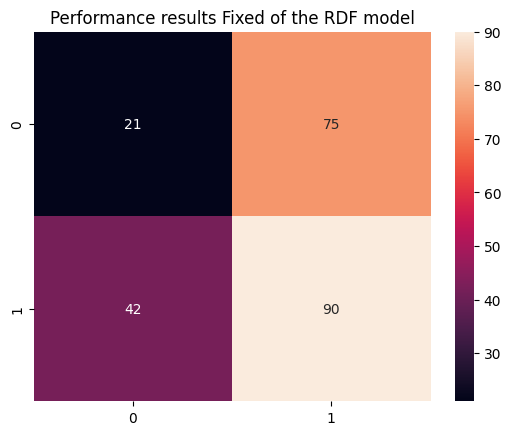


Feature Importance of the model



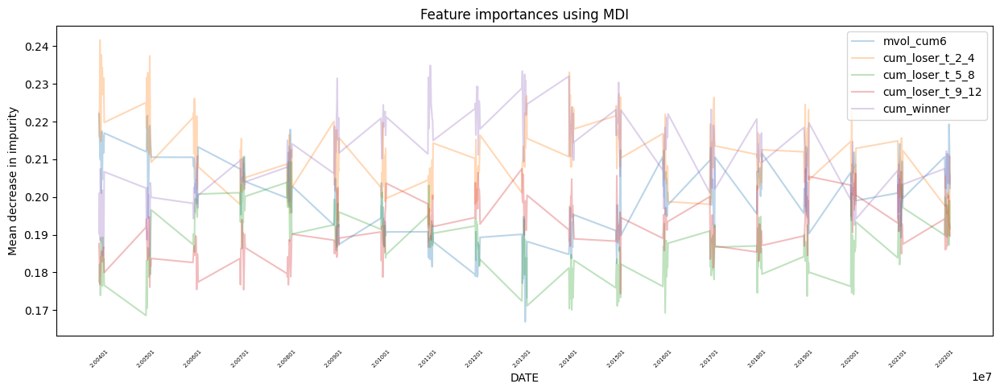

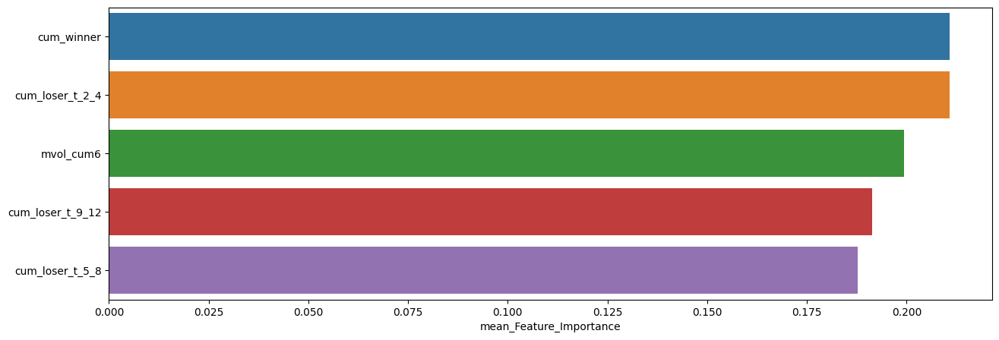

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.210877,0.234895,0.184264
cum_loser_t_2_4,0.210847,0.241598,0.189765
mvol_cum6,0.199312,0.222060,0.166911
cum_loser_t_9_12,0.191309,0.207500,0.174415
cum_loser_t_5_8,0.187655,0.210481,0.168598


In [23]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



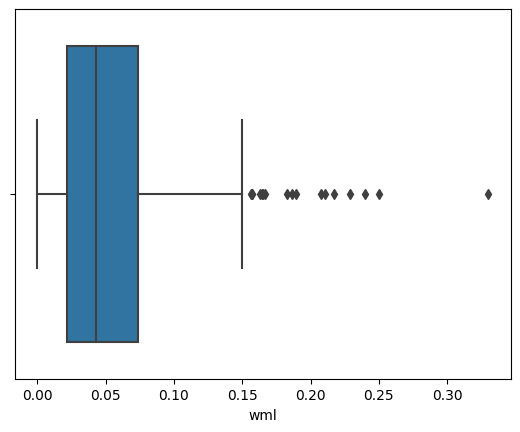

,count,mean,std,min,25%,50%,75%,max
wml,455.0,0.053468,0.044902,0.000007,0.021556,0.042778,0.073358,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



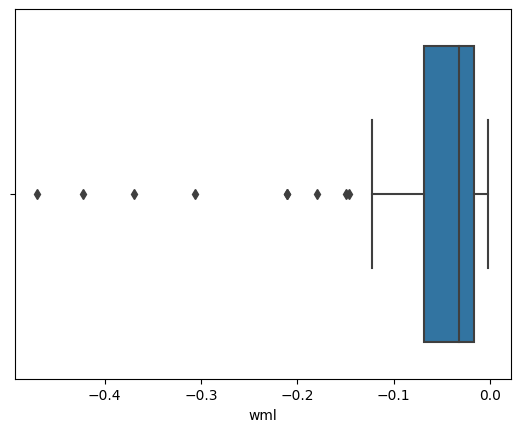

,count,mean,std,min,25%,50%,75%,max
wml,72.0,-0.065973,0.093701,-0.469903,-0.067973,-0.032352,-0.015992,-0.001641



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



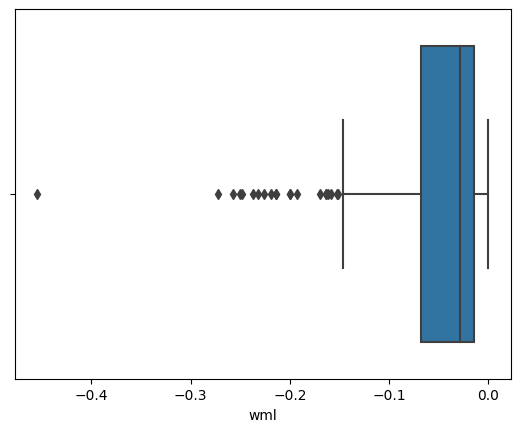

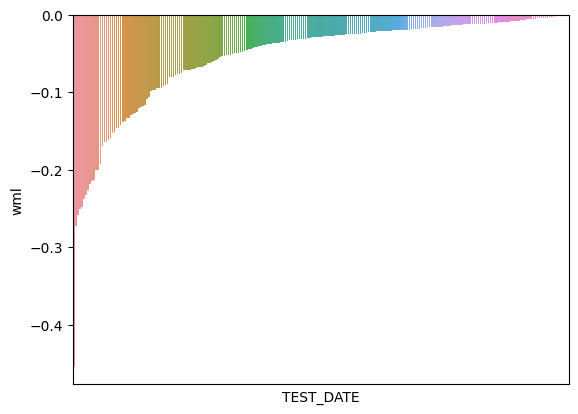

,count,mean,std,min,25%,50%,75%,max
wml,244.0,-0.05346,0.063062,-0.454349,-0.067966,-0.028293,-0.01461,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



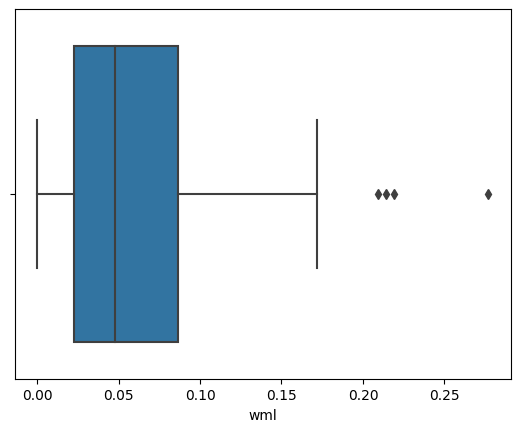

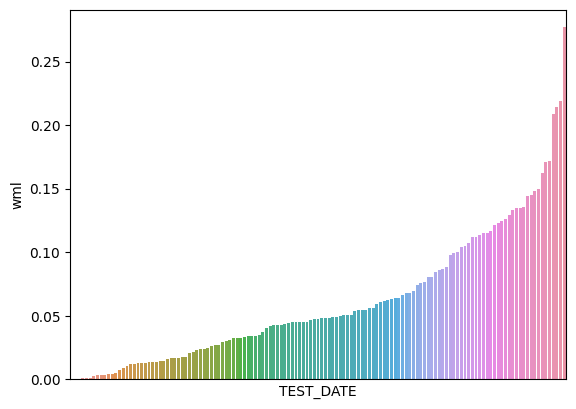

,count,mean,std,min,25%,50%,75%,max
wml,135.0,0.061256,0.052476,0.000221,0.022387,0.0479,0.086743,0.276912


In [24]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.69670

최근 누적 수익률

  2022년-12월 -> 10776.07
  2022년-11월 -> 9708.95
  2022년-10월 -> 9235.21
  2022년-09월 -> 9235.21
  2022년-08월 -> 9235.21

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 27578.28
  2등 : 2003년-03월 -> 26488.77
  3등 : 2003년-02월 -> 26488.77
  4등 : 2002년-12월 -> 25727.06
  5등 : 2003년-01월 -> 25163.90
  6등 : 2003년-11월 -> 24567.77
  7등 : 2002년-06월 -> 24014.72
  8등 : 2002년-07월 -> 24014.72
  9등 : 2003년-10월 -> 23791.91
  10등 : 2002년-08월 -> 23318.96



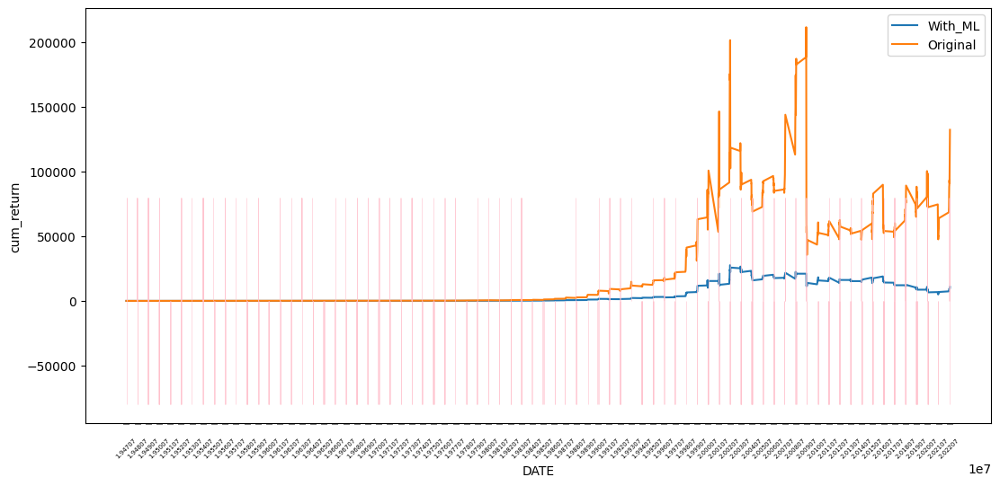

In [25]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.75152

최근 누적 수익률

  2022년-12월 -> 4863.64
  2022년-11월 -> 4439.11
  2022년-10월 -> 4280.98
  2022년-09월 -> 4020.92
  2022년-08월 -> 3851.52

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 6062.13
  2등 : 2009년-02월 -> 5922.38
  3등 : 2008년-11월 -> 5645.51
  4등 : 2009년-01월 -> 5618.16
  5등 : 2002년-07월 -> 5575.39
  6등 : 2008년-06월 -> 5575.21
  7등 : 2008년-12월 -> 5561.31
  8등 : 2002년-06월 -> 5485.35
  9등 : 2002년-08월 -> 5436.45
  10등 : 2008년-10월 -> 5292.69



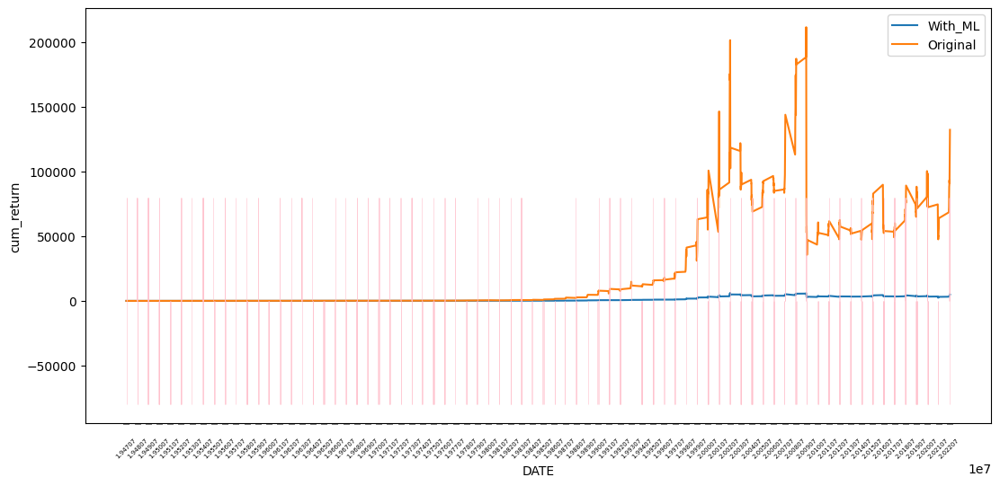

In [26]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [27]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.22      0.26       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.58       906
   macro avg       0.49      0.50      0.49       906
weighted avg       0.54      0.58      0.55       906


accuracy : 0.5805739514348786

precision : 0.6487252124645893

recall : 0.7762711864406779

F1-Score : 0.7067901234567902



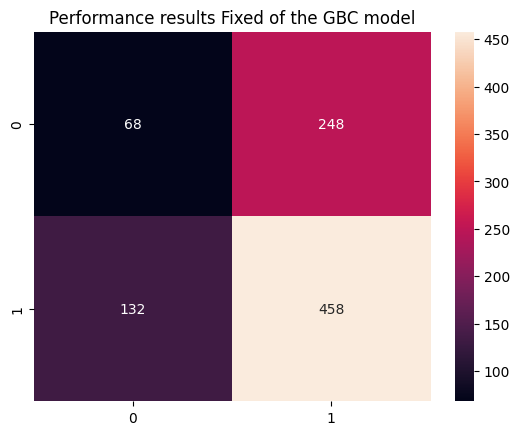


Feature Importance of the model



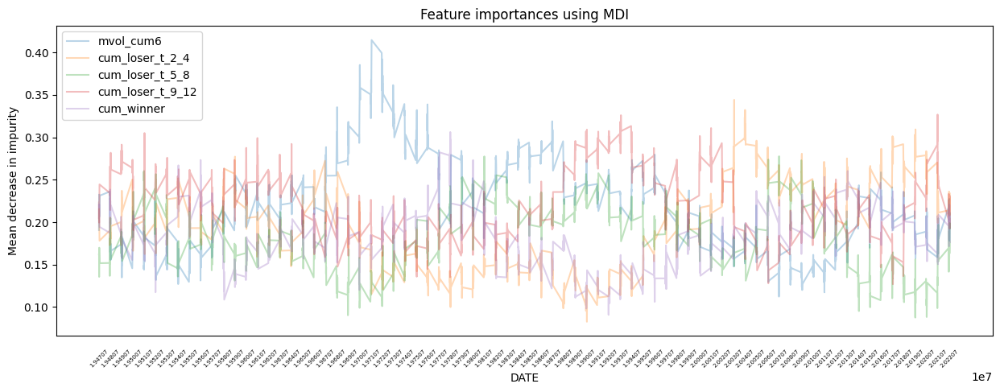

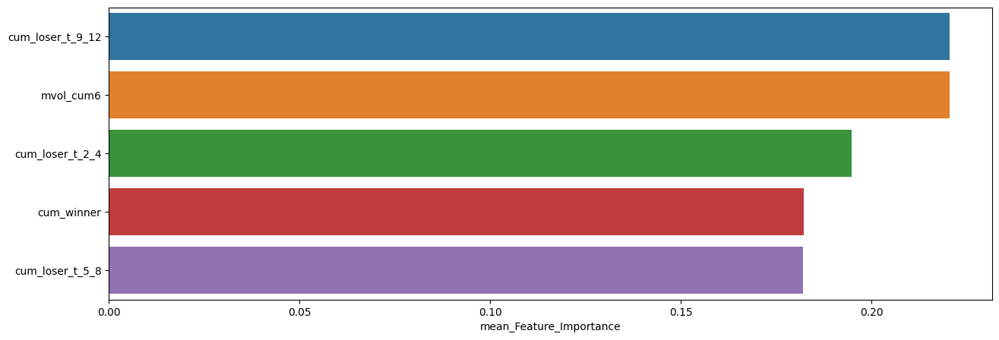

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.220596,0.326829,0.126932
mvol_cum6,0.220425,0.414598,0.112281
cum_loser_t_2_4,0.194752,0.344175,0.082661
cum_winner,0.182276,0.306224,0.090822
cum_loser_t_5_8,0.181951,0.277710,0.087605


In [28]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.61       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6741573033707865

recall : 0.7947019867549668

F1-Score : 0.729483282674772



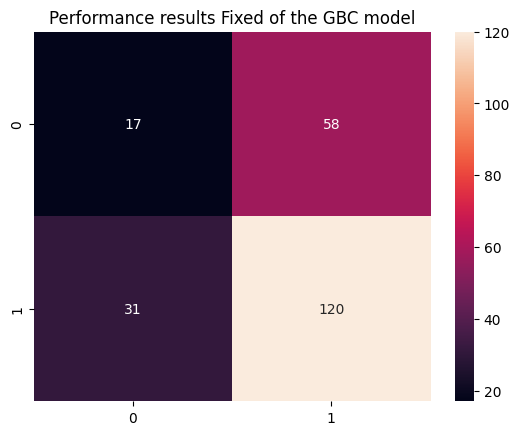


Feature Importance of the model



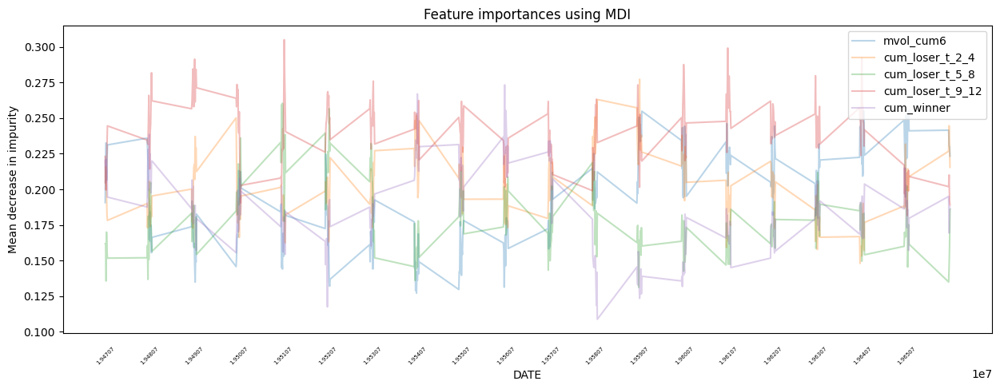

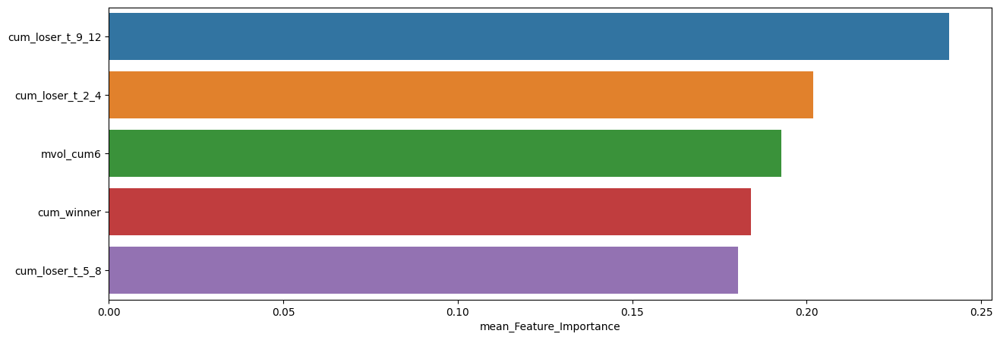

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.240956,0.304991,0.181554
cum_loser_t_2_4,0.201859,0.277249,0.147938
mvol_cum6,0.192757,0.255420,0.127066
cum_winner,0.184118,0.273263,0.108724
cum_loser_t_5_8,0.180309,0.260343,0.131080



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.23      0.29        75
         1.0       0.69      0.84      0.76       151

    accuracy                           0.64       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.60      0.64      0.60       226


accuracy : 0.6371681415929203

precision : 0.6864864864864865

recall : 0.8410596026490066

F1-Score : 0.7559523809523809



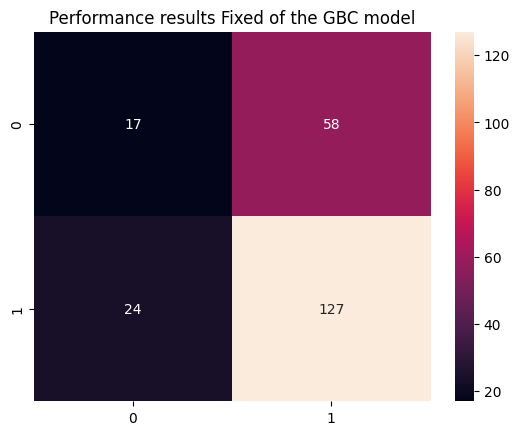


Feature Importance of the model



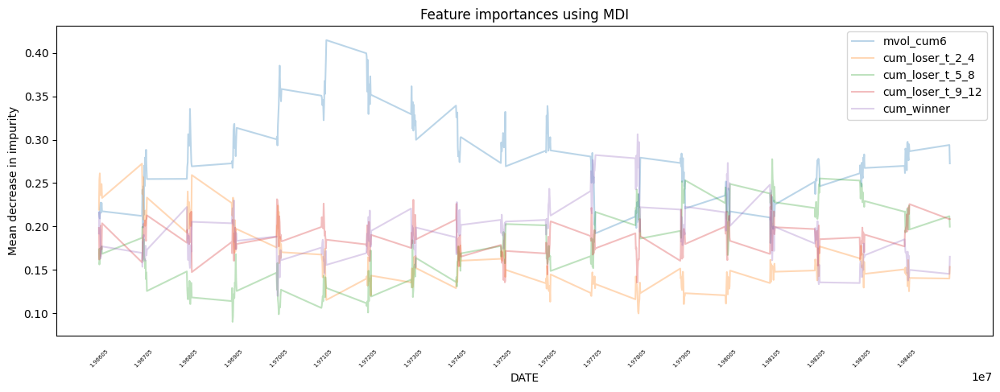

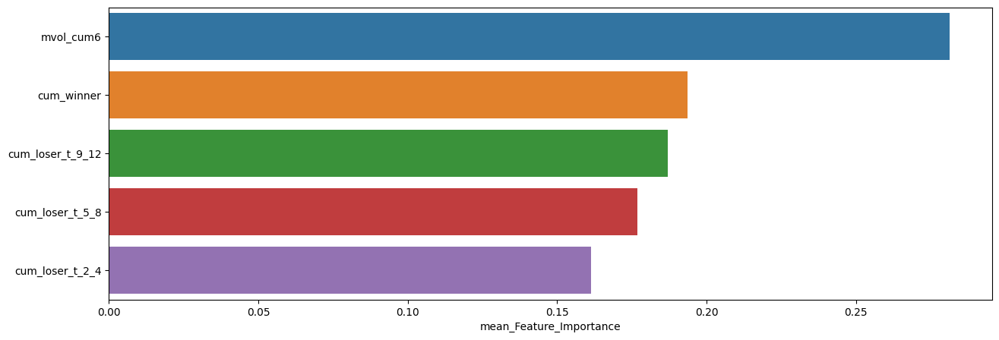

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.281406,0.414598,0.181028
cum_winner,0.193532,0.306224,0.120163
cum_loser_t_9_12,0.186923,0.236207,0.135274
cum_loser_t_5_8,0.176822,0.277492,0.090309
cum_loser_t_2_4,0.161317,0.272332,0.099970



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.20      0.24        70
         1.0       0.69      0.79      0.74       156

    accuracy                           0.61       226
   macro avg       0.50      0.50      0.49       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6106194690265486

precision : 0.6888888888888889

recall : 0.7948717948717948

F1-Score : 0.738095238095238



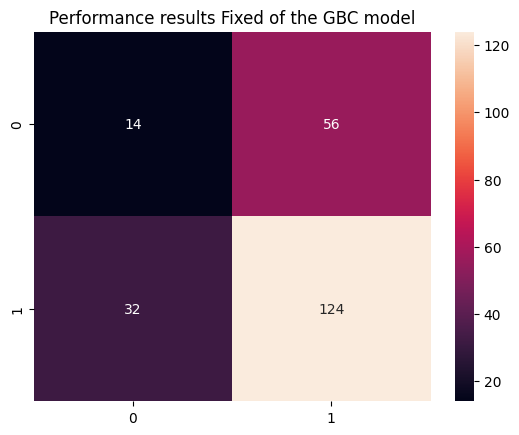


Feature Importance of the model



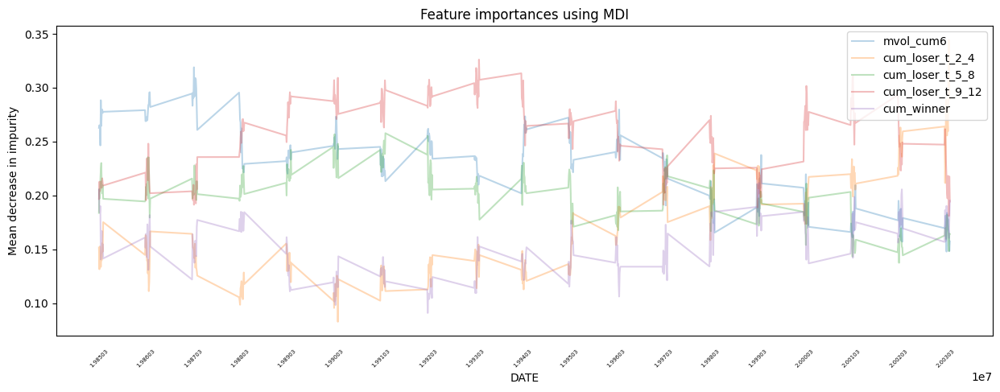

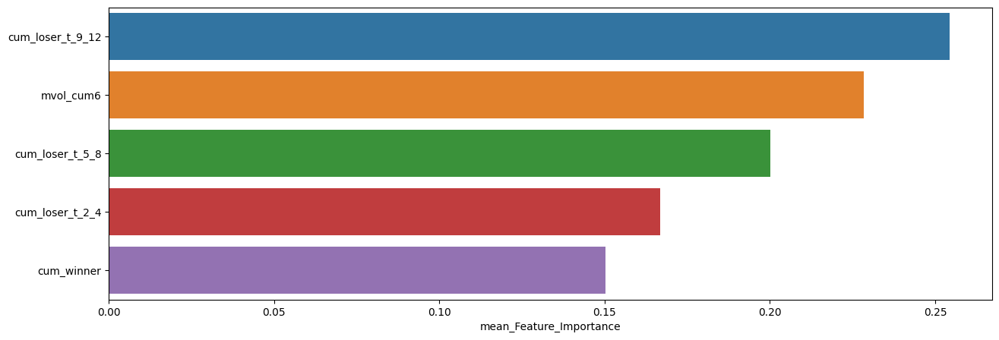

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.254488,0.326051,0.180836
mvol_cum6,0.228377,0.318862,0.147800
cum_loser_t_5_8,0.200181,0.257708,0.137374
cum_loser_t_2_4,0.166732,0.344175,0.082661
cum_winner,0.150223,0.211524,0.090822



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.21      0.25        96
         1.0       0.53      0.66      0.59       132

    accuracy                           0.47       228
   macro avg       0.42      0.43      0.42       228
weighted avg       0.44      0.47      0.45       228


accuracy : 0.4692982456140351

precision : 0.5337423312883436

recall : 0.6590909090909091

F1-Score : 0.5898305084745763



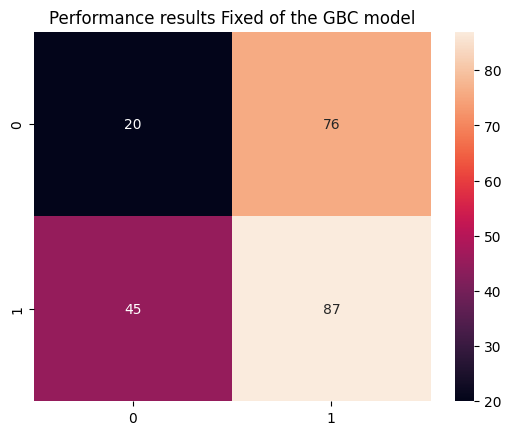


Feature Importance of the model



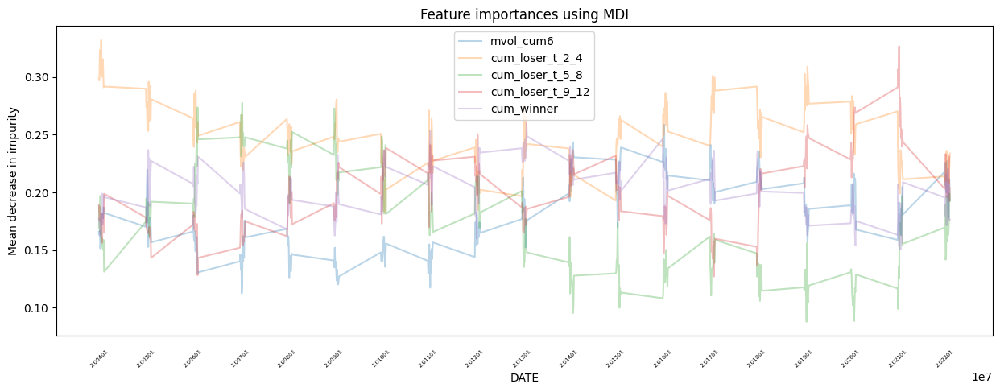

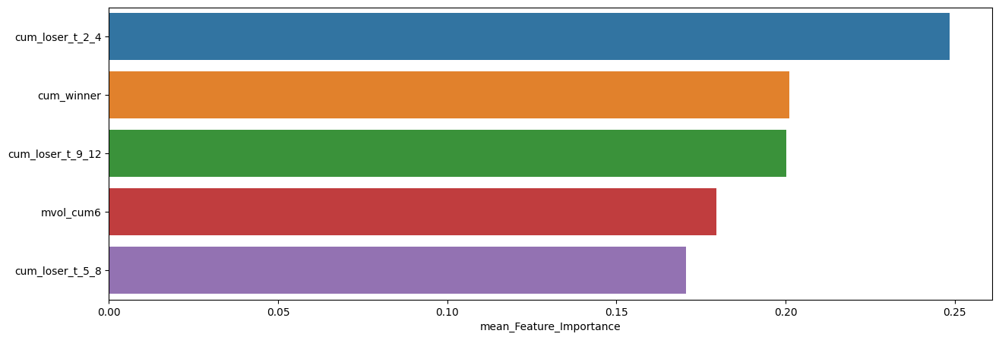

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,0.248623,0.332218,0.181976
cum_winner,0.201064,0.260294,0.150452
cum_loser_t_9_12,0.200196,0.326829,0.126932
mvol_cum6,0.179524,0.258761,0.112281
cum_loser_t_5_8,0.170592,0.277710,0.087605


In [29]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



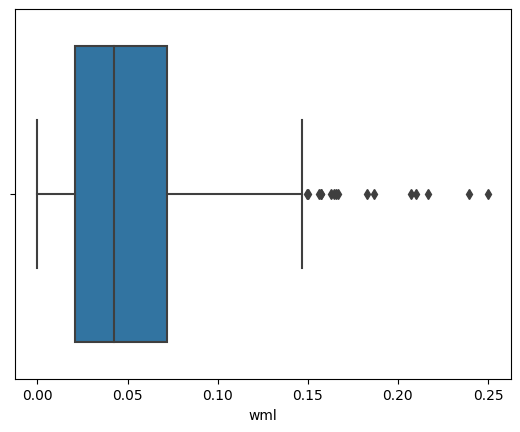

,count,mean,std,min,25%,50%,75%,max
wml,458.0,0.051868,0.042038,0.000007,0.021049,0.042303,0.071958,0.250175



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



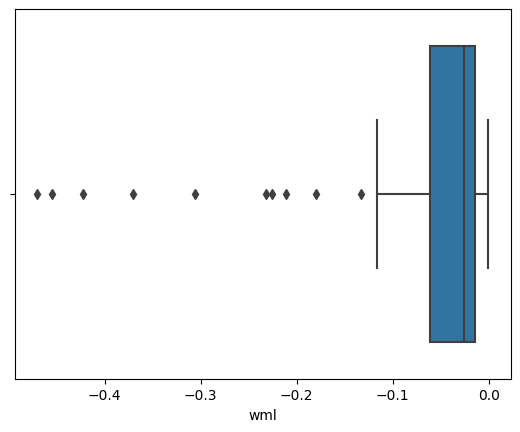

,count,mean,std,min,25%,50%,75%,max
wml,68.0,-0.070282,0.109199,-0.469903,-0.061089,-0.026193,-0.01413,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



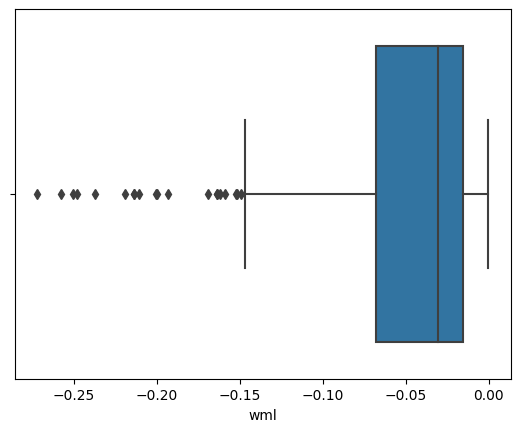

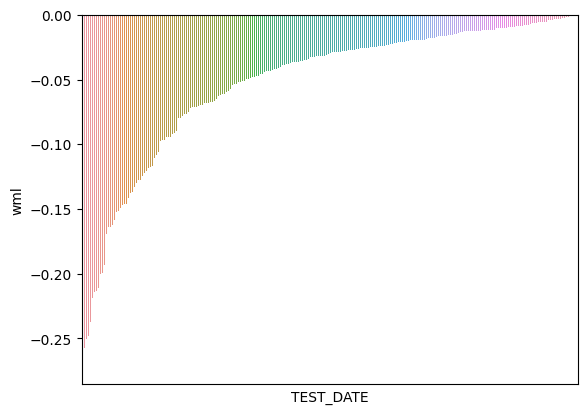

,count,mean,std,min,25%,50%,75%,max
wml,248.0,-0.05248,0.056289,-0.271971,-0.067966,-0.030187,-0.015243,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



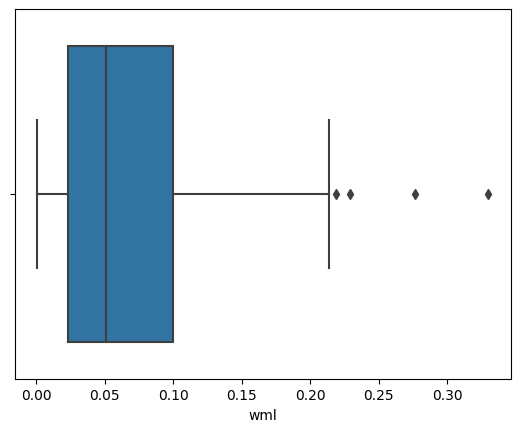

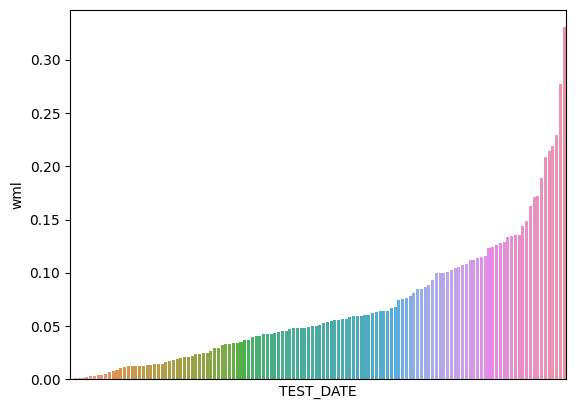

,count,mean,std,min,25%,50%,75%,max
wml,132.0,0.066983,0.059235,0.000692,0.023215,0.050649,0.099786,0.330163


In [30]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.76345

최근 누적 수익률

  2022년-12월 -> 7835.37
  2022년-11월 -> 7059.43
  2022년-10월 -> 6714.96
  2022년-09월 -> 6714.96
  2022년-08월 -> 6714.96

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 18534.10
  2등 : 2003년-02월 -> 18200.28
  3등 : 2003년-03월 -> 18200.28
  4등 : 2002년-12월 -> 17289.95
  5등 : 2003년-01월 -> 17289.95
  6등 : 2010년-11월 -> 17105.01
  7등 : 2016년-01월 -> 16742.79
  8등 : 2001년-09월 -> 16281.70
  9등 : 2011년-12월 -> 16145.68
  10등 : 2002년-07월 -> 16139.15



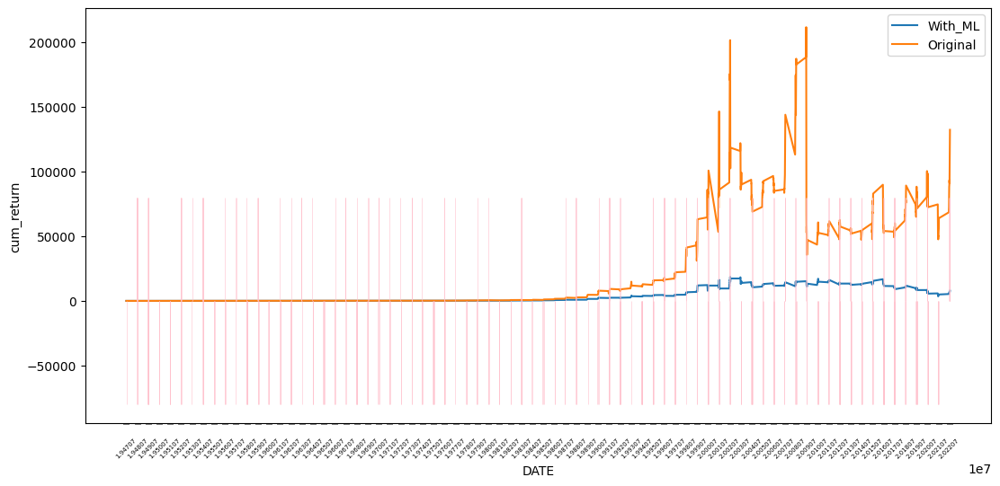

In [31]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76629

최근 누적 수익률

  2022년-12월 -> 5668.54
  2022년-11월 -> 5272.30
  2022년-10월 -> 5040.23
  2022년-09월 -> 4970.24
  2022년-08월 -> 4943.21

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 7030.94
  2등 : 2009년-02월 -> 6609.18
  3등 : 2009년-01월 -> 6513.47
  4등 : 2008년-11월 -> 6492.64
  5등 : 2008년-12월 -> 6411.63
  6등 : 2002년-07월 -> 6400.83
  7등 : 2003년-02월 -> 6277.18
  8등 : 2002년-06월 -> 6267.87
  9등 : 2002년-08월 -> 6244.04
  10등 : 2003년-03월 -> 6237.37



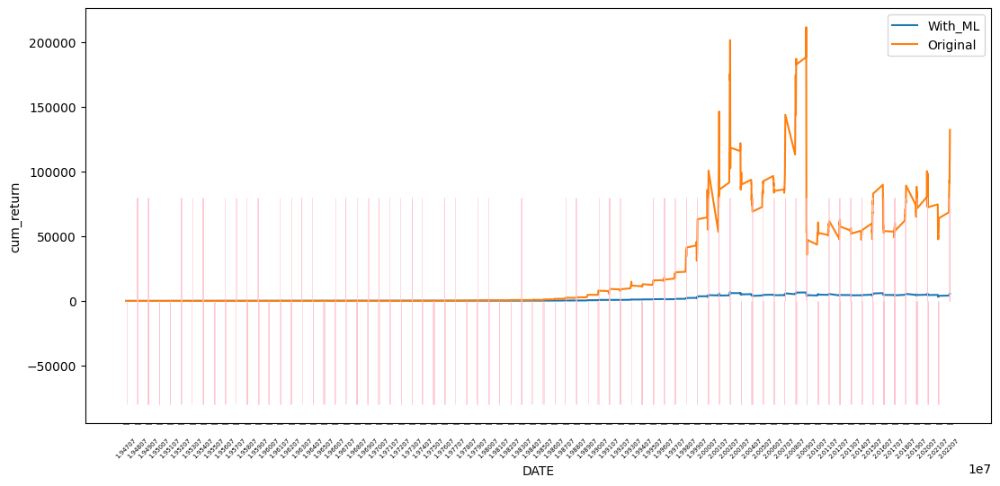

In [32]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [33]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.26      0.29       316
         1.0       0.64      0.72      0.68       590

    accuracy                           0.56       906
   macro avg       0.49      0.49      0.48       906
weighted avg       0.53      0.56      0.54       906


accuracy : 0.5573951434878587

precision : 0.6438356164383562

recall : 0.7169491525423729

F1-Score : 0.6784282277465918



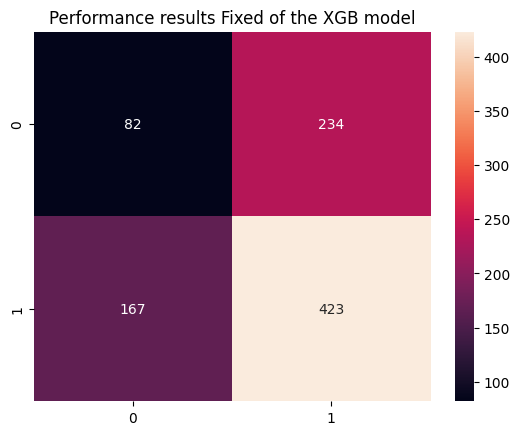


Feature Importance of the model



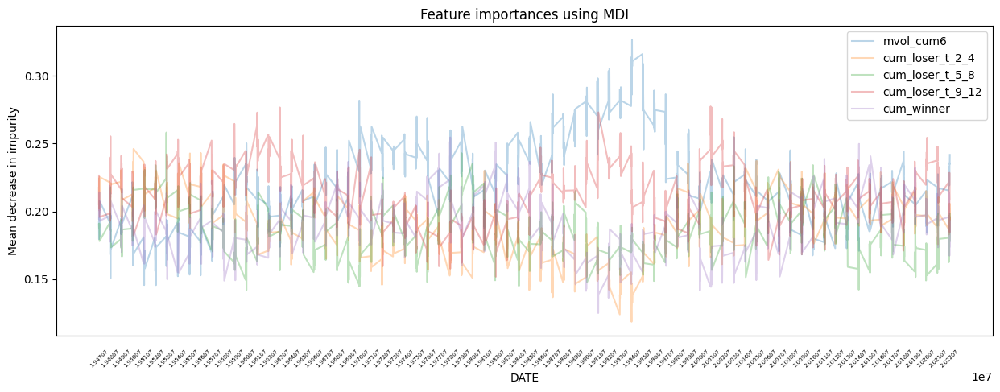

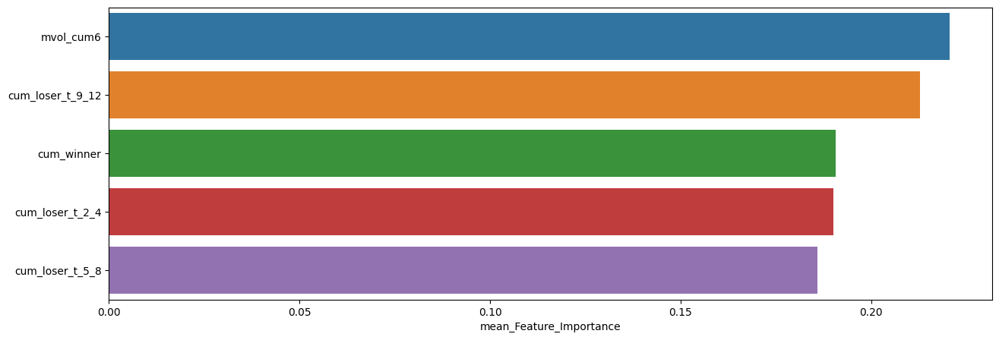

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.220695,0.326317,0.145592
cum_loser_t_9_12,0.212821,0.277395,0.151748
cum_winner,0.190601,0.254490,0.125007
cum_loser_t_2_4,0.190053,0.246058,0.118598
cum_loser_t_5_8,0.185830,0.258129,0.141928


In [34]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.28      0.31        75
         1.0       0.67      0.73      0.70       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.50       226
weighted avg       0.56      0.58      0.57       226


accuracy : 0.5796460176991151

precision : 0.6707317073170732

recall : 0.7284768211920529

F1-Score : 0.6984126984126985



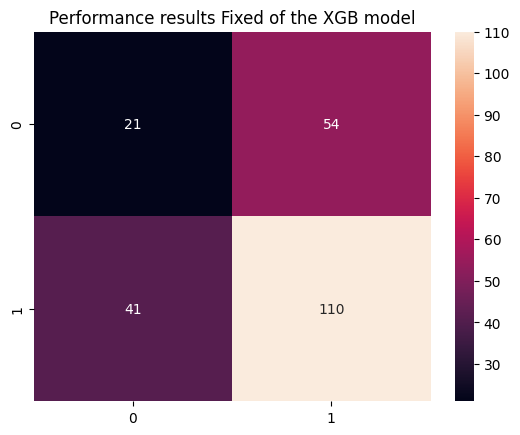


Feature Importance of the model



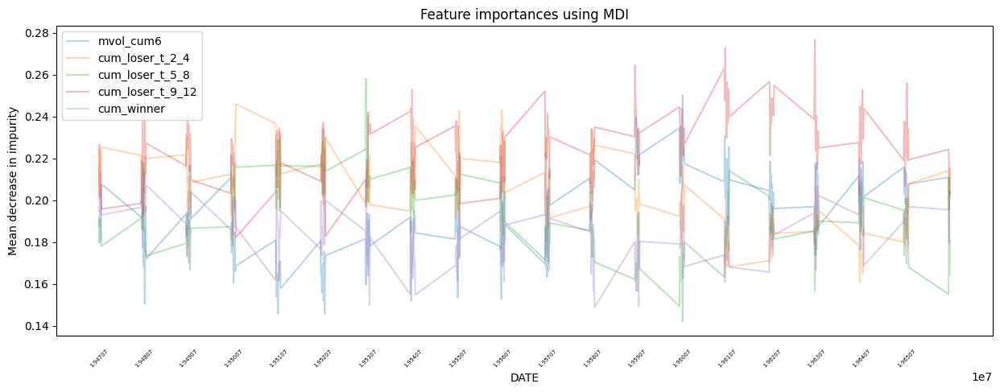

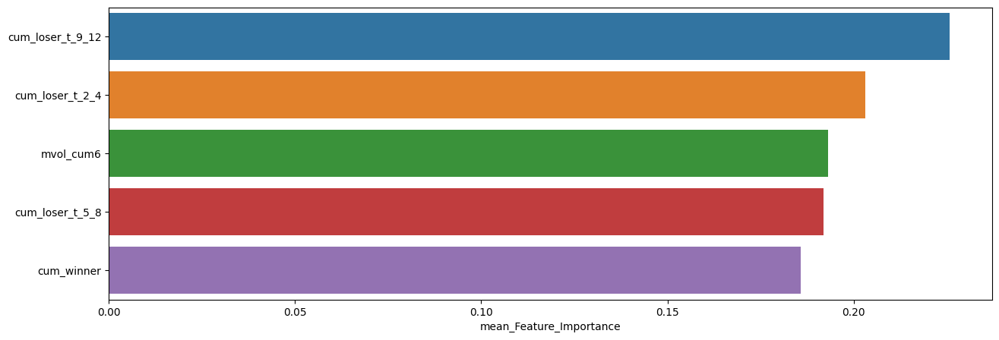

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.225890,0.276592,0.182208
cum_loser_t_2_4,0.203143,0.246058,0.160622
mvol_cum6,0.193141,0.250229,0.145592
cum_loser_t_5_8,0.191995,0.258129,0.141928
cum_winner,0.185831,0.222449,0.148922



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.23      0.26        75
         1.0       0.66      0.75      0.71       151

    accuracy                           0.58       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.55      0.58      0.56       226


accuracy : 0.5796460176991151

precision : 0.6627906976744186

recall : 0.7549668874172185

F1-Score : 0.7058823529411764



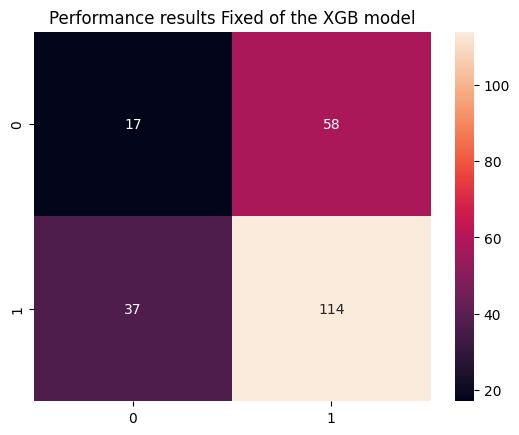


Feature Importance of the model



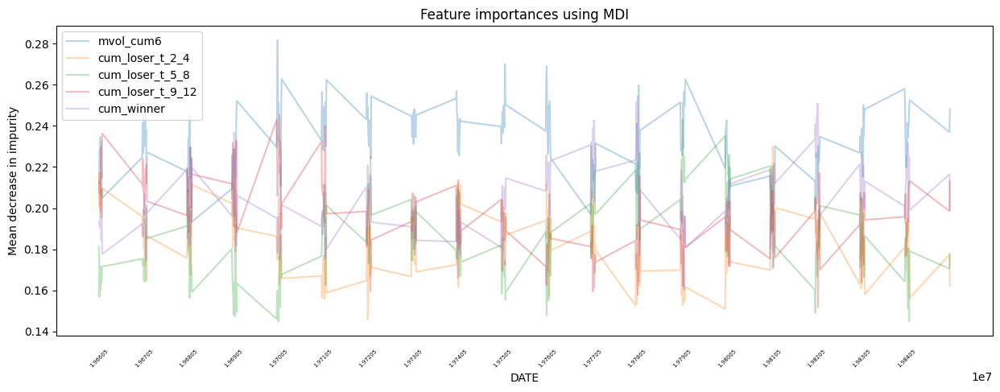

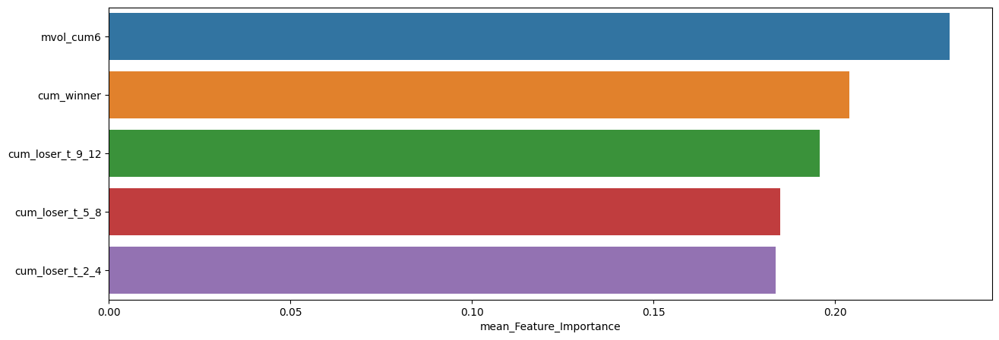

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.231708,0.281666,0.187649
cum_winner,0.203988,0.254490,0.160408
cum_loser_t_9_12,0.195726,0.245552,0.151748
cum_loser_t_5_8,0.184952,0.242923,0.144725
cum_loser_t_2_4,0.183626,0.229973,0.145782



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.31      0.34        70
         1.0       0.71      0.76      0.74       156

    accuracy                           0.62       226
   macro avg       0.54      0.54      0.54       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6238938053097345

precision : 0.7125748502994012

recall : 0.7628205128205128

F1-Score : 0.7368421052631579



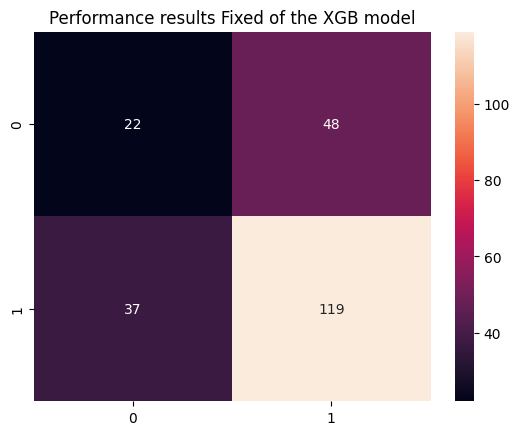


Feature Importance of the model



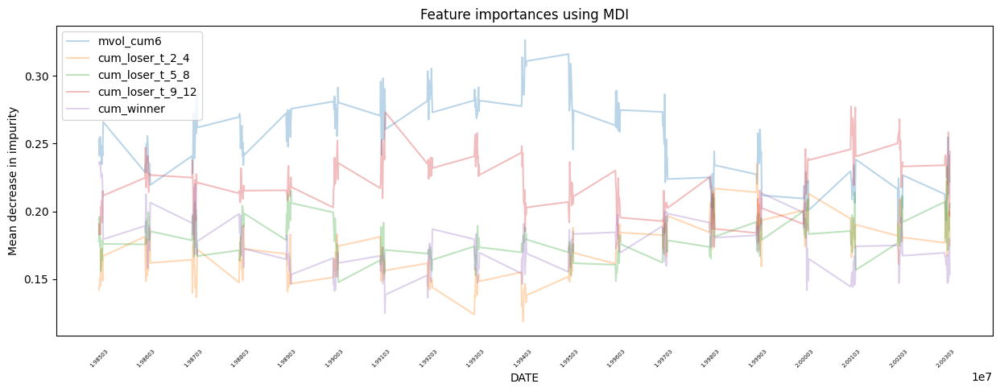

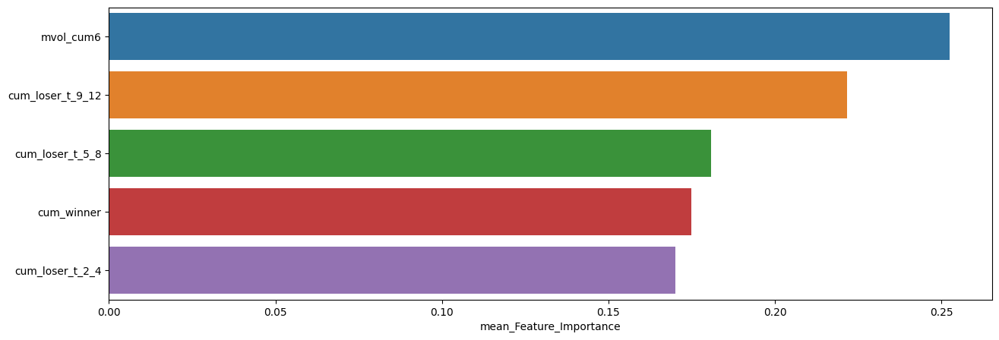

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.252558,0.326317,0.190088
cum_loser_t_9_12,0.221670,0.277395,0.177417
cum_loser_t_5_8,0.180783,0.233338,0.147758
cum_winner,0.174824,0.236674,0.125007
cum_loser_t_2_4,0.170165,0.235164,0.118598



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.23      0.26        96
         1.0       0.52      0.61      0.56       132

    accuracy                           0.45       228
   macro avg       0.41      0.42      0.41       228
weighted avg       0.43      0.45      0.43       228


accuracy : 0.4473684210526316

precision : 0.5194805194805194

recall : 0.6060606060606061

F1-Score : 0.5594405594405594



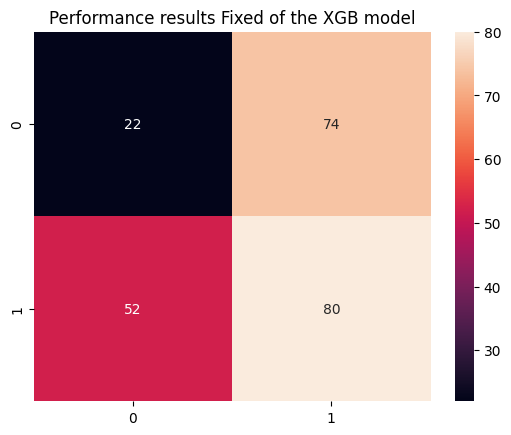


Feature Importance of the model



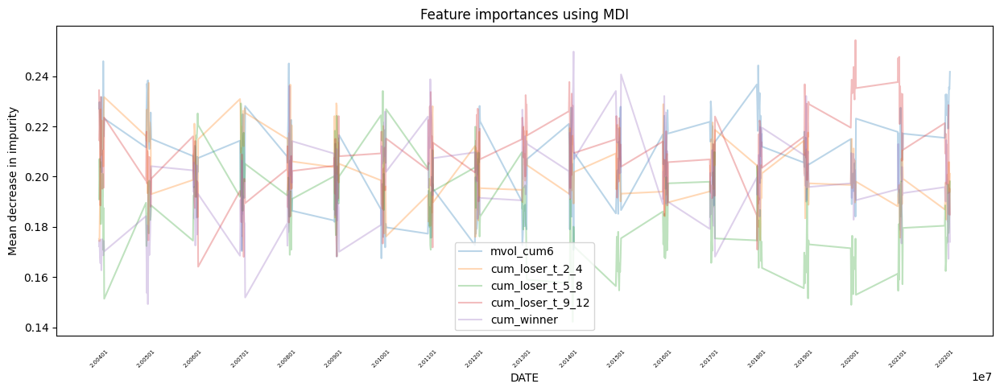

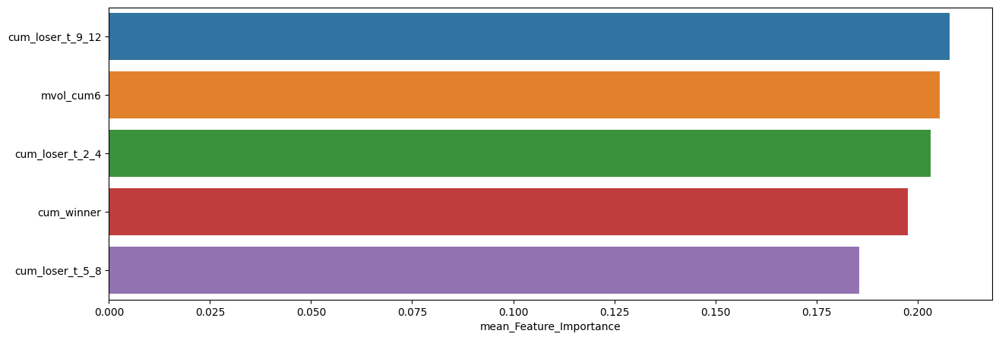

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.208042,0.254327,0.164174
mvol_cum6,0.205506,0.245941,0.167510
cum_loser_t_2_4,0.203160,0.237299,0.174327
cum_winner,0.197698,0.249761,0.149282
cum_loser_t_5_8,0.185594,0.234098,0.142234


In [35]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



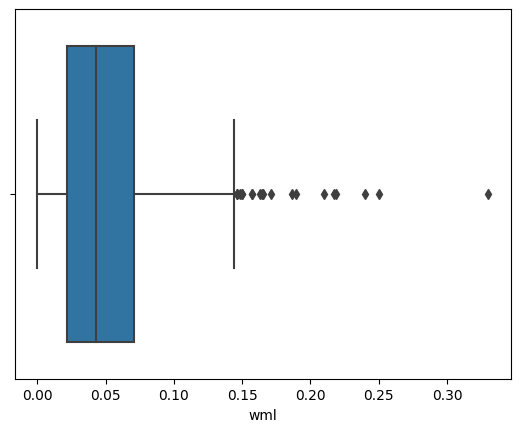

,count,mean,std,min,25%,50%,75%,max
wml,423.0,0.052715,0.044423,0.000128,0.021556,0.042778,0.071167,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



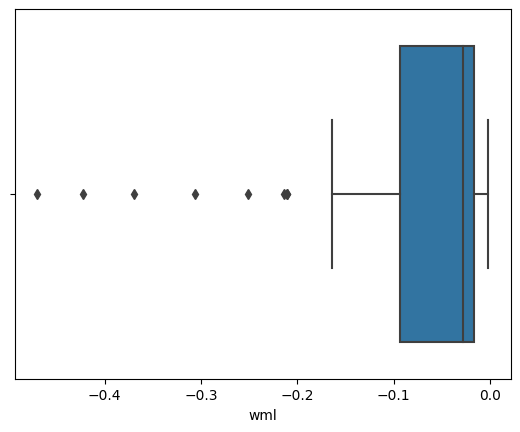

,count,mean,std,min,25%,50%,75%,max
wml,82.0,-0.068801,0.093602,-0.469903,-0.093473,-0.028415,-0.016093,-0.001641



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



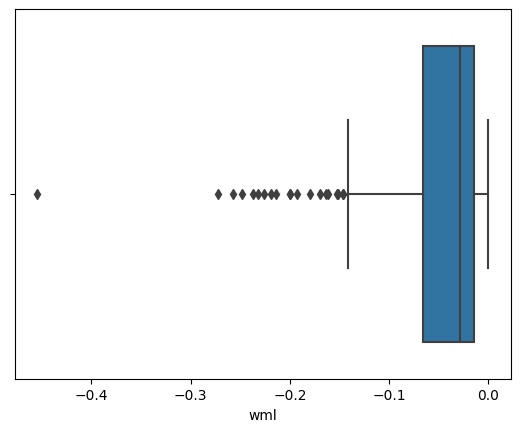

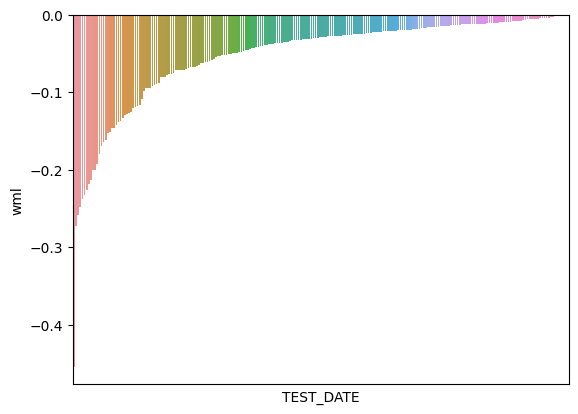

,count,mean,std,min,25%,50%,75%,max
wml,234.0,-0.051934,0.061158,-0.454349,-0.066051,-0.02887,-0.014062,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



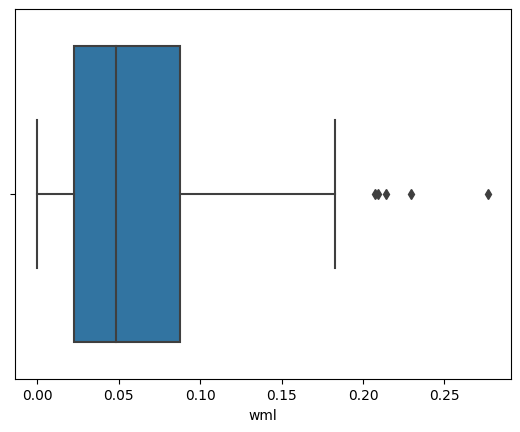

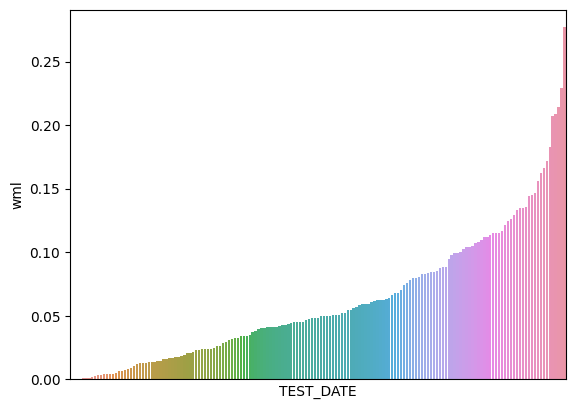

,count,mean,std,min,25%,50%,75%,max
wml,167.0,0.06167,0.051967,0.000007,0.022198,0.048334,0.087719,0.276912


In [36]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.71406

최근 누적 수익률

  2022년-12월 -> 4173.35
  2022년-11월 -> 3760.01
  2022년-10월 -> 3576.52
  2022년-09월 -> 3576.52
  2022년-08월 -> 3576.52

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-06월 -> 10093.74
  2등 : 2002년-07월 -> 10093.74
  3등 : 2002년-08월 -> 9801.29
  4등 : 2002년-09월 -> 9801.29
  5등 : 2008년-06월 -> 9311.62
  6등 : 2009년-03월 -> 9214.72
  7등 : 2009년-02월 -> 9214.72
  8등 : 2003년-11월 -> 8850.50
  9등 : 2002년-05월 -> 8679.30
  10등 : 2002년-04월 -> 8679.30



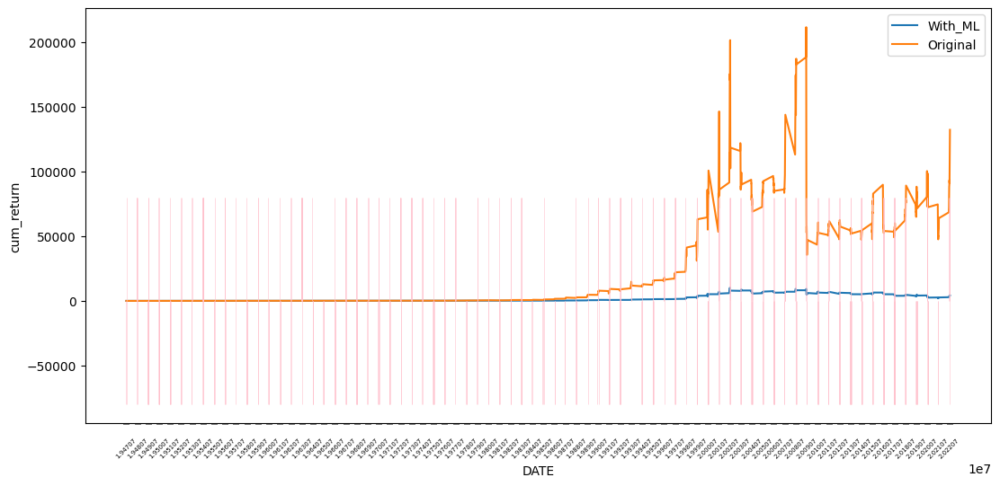

In [37]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.69987

최근 누적 수익률

  2022년-12월 -> 4506.50
  2022년-11월 -> 4076.45
  2022년-10월 -> 3881.34
  2022년-09월 -> 3742.56
  2022년-08월 -> 3716.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 12256.20
  2등 : 2002년-07월 -> 12070.81
  3등 : 2002년-06월 -> 12044.55
  4등 : 2002년-08월 -> 11735.84
  5등 : 2009년-02월 -> 10674.15
  6등 : 2008년-06월 -> 10424.00
  7등 : 2002년-05월 -> 10360.85
  8등 : 2002년-10월 -> 10257.50
  9등 : 2002년-04월 -> 10252.64
  10등 : 2008년-11월 -> 10045.77



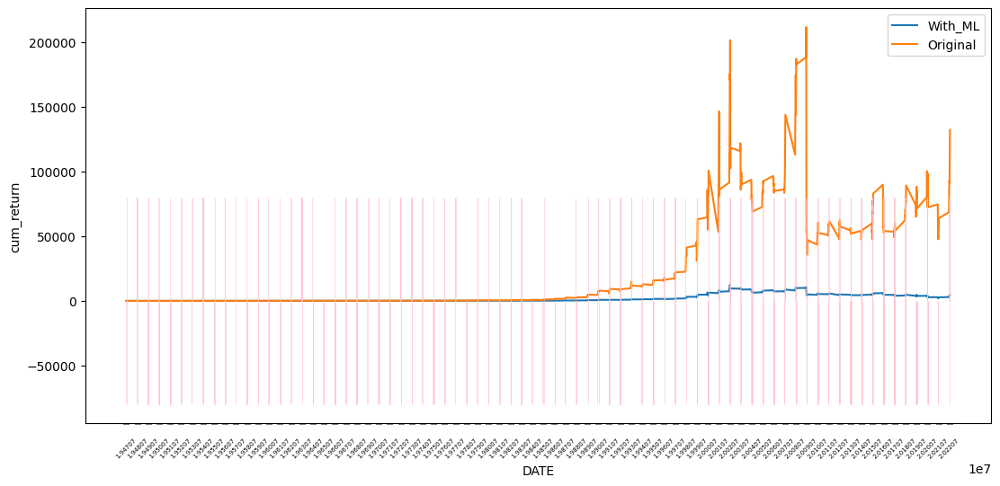

In [38]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [39]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.26      0.30       316
         1.0       0.65      0.75      0.70       590

    accuracy                           0.58       906
   macro avg       0.50      0.50      0.50       906
weighted avg       0.55      0.58      0.56       906


accuracy : 0.5761589403973509

precision : 0.6528189910979229

recall : 0.7457627118644068

F1-Score : 0.6962025316455696



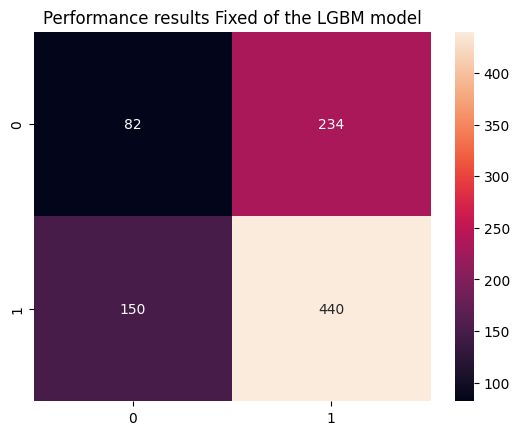


Feature Importance of the model



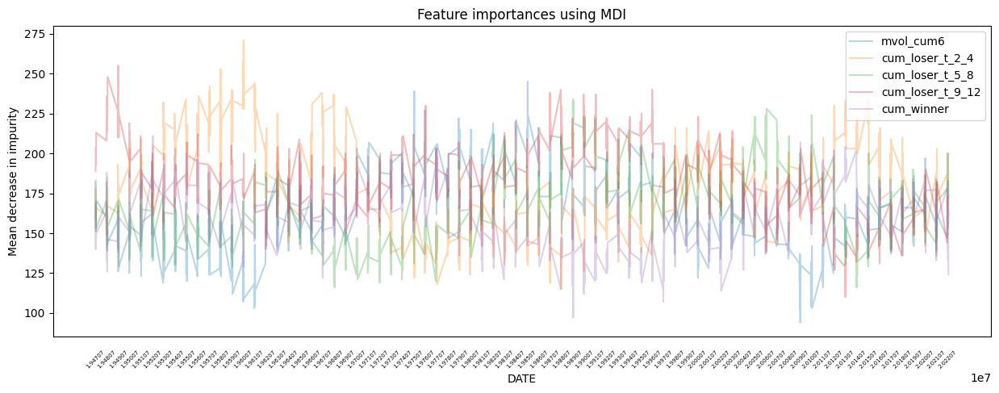

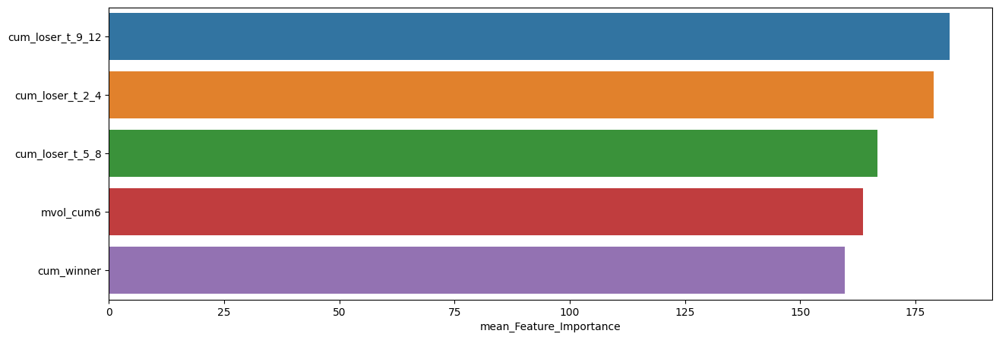

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,182.517660,255,110
cum_loser_t_2_4,178.921634,271,115
cum_loser_t_5_8,166.799117,234,116
mvol_cum6,163.575055,245,94
cum_winner,159.654525,211,97


In [40]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.28      0.33        75
         1.0       0.69      0.79      0.74       151

    accuracy                           0.62       226
   macro avg       0.55      0.54      0.53       226
weighted avg       0.59      0.62      0.60       226


accuracy : 0.6238938053097345

precision : 0.6896551724137931

recall : 0.7947019867549668

F1-Score : 0.7384615384615384



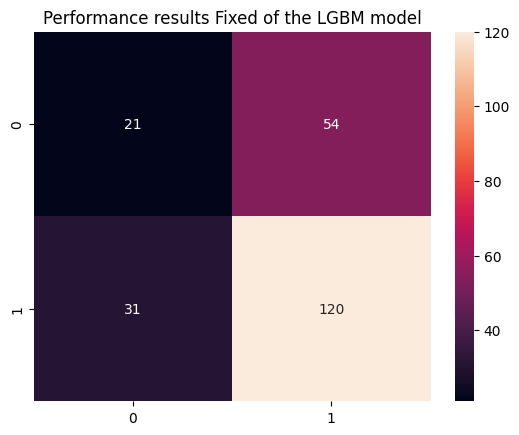


Feature Importance of the model



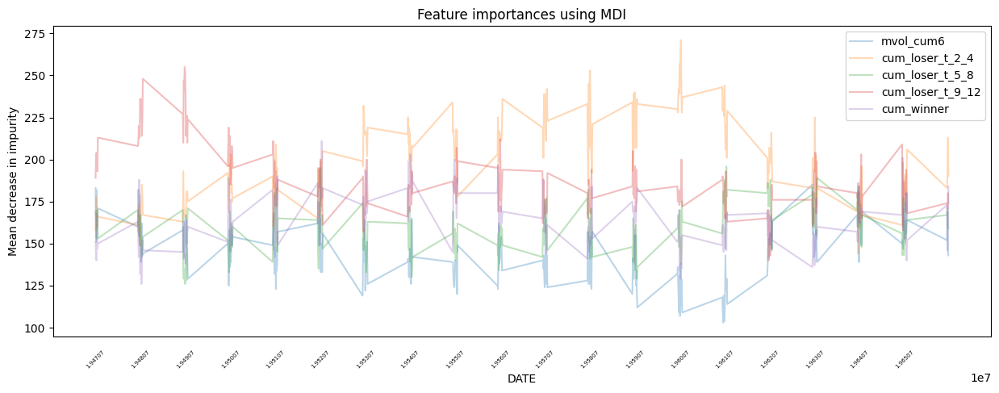

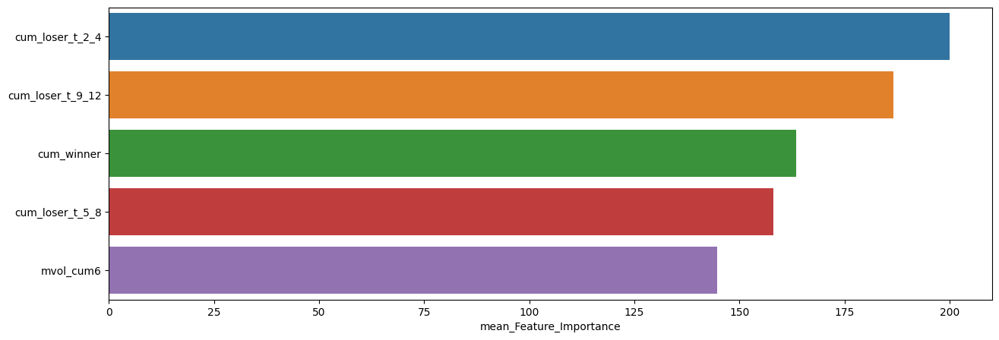

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,200.070796,271,144
cum_loser_t_9_12,186.699115,255,140
cum_winner,163.451327,211,126
cum_loser_t_5_8,158.053097,196,126
mvol_cum6,144.610619,185,103



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.23      0.28        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.61       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6741573033707865

recall : 0.7947019867549668

F1-Score : 0.729483282674772



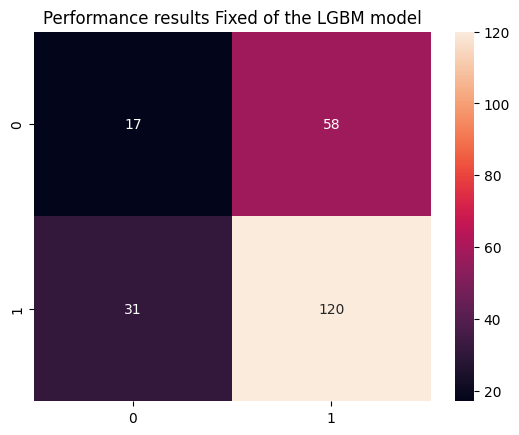


Feature Importance of the model



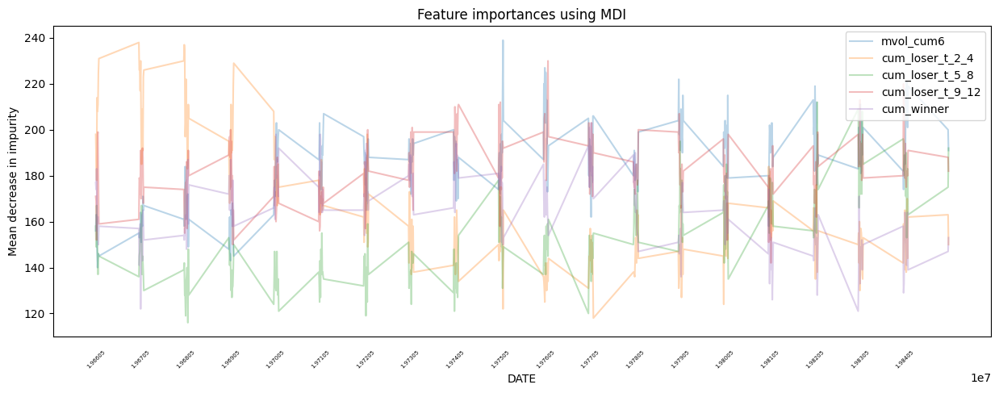

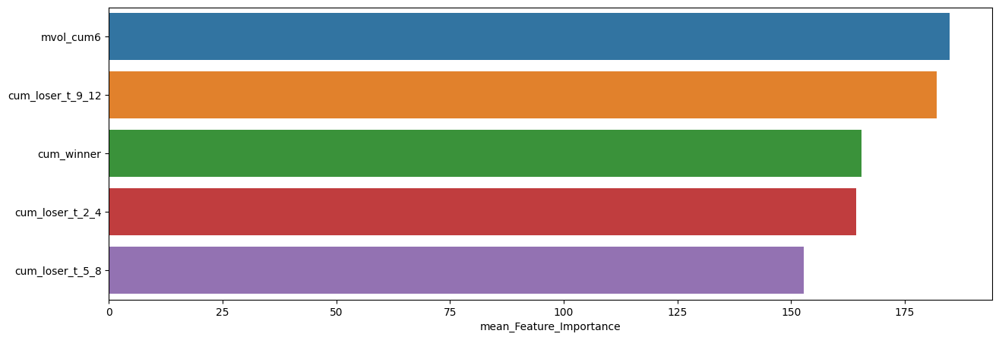

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,184.938053,239,140
cum_loser_t_9_12,182.053097,230,142
cum_winner,165.433628,203,121
cum_loser_t_2_4,164.300885,238,118
cum_loser_t_5_8,152.853982,212,116



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.27      0.31        70
         1.0       0.71      0.79      0.75       156

    accuracy                           0.63       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.60      0.63      0.61       226


accuracy : 0.6327433628318584

precision : 0.7085714285714285

recall : 0.7948717948717948

F1-Score : 0.7492447129909365



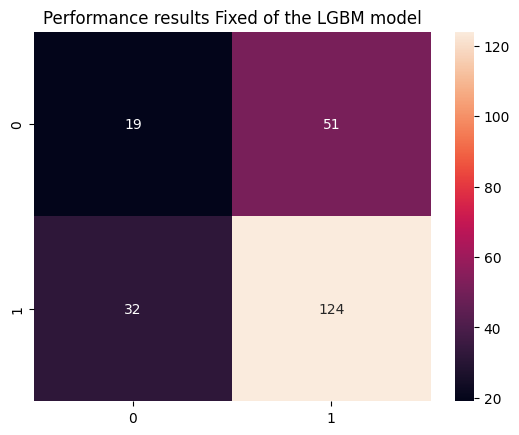


Feature Importance of the model



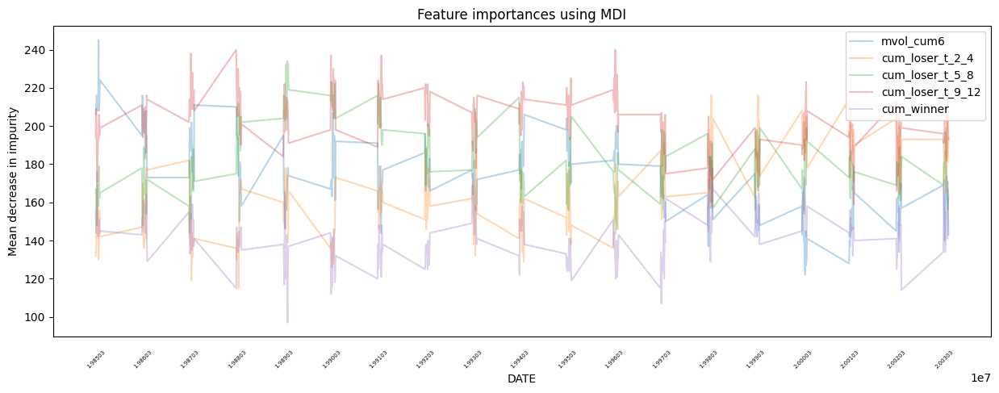

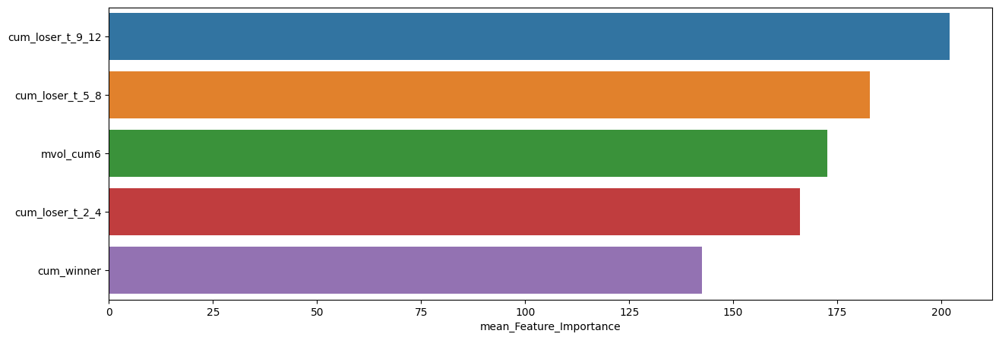

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,202.092920,240,159
cum_loser_t_5_8,182.871681,234,144
mvol_cum6,172.681416,245,122
cum_loser_t_2_4,166.106195,216,115
cum_winner,142.460177,179,97



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.26      0.28        96
         1.0       0.52      0.58      0.54       132

    accuracy                           0.44       228
   macro avg       0.41      0.42      0.41       228
weighted avg       0.43      0.44      0.43       228


accuracy : 0.44298245614035087

precision : 0.5170068027210885

recall : 0.5757575757575758

F1-Score : 0.5448028673835126



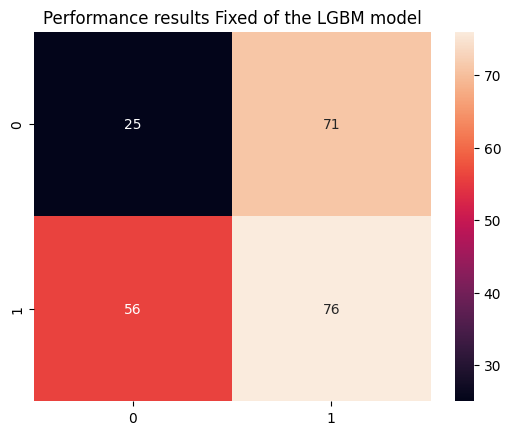


Feature Importance of the model



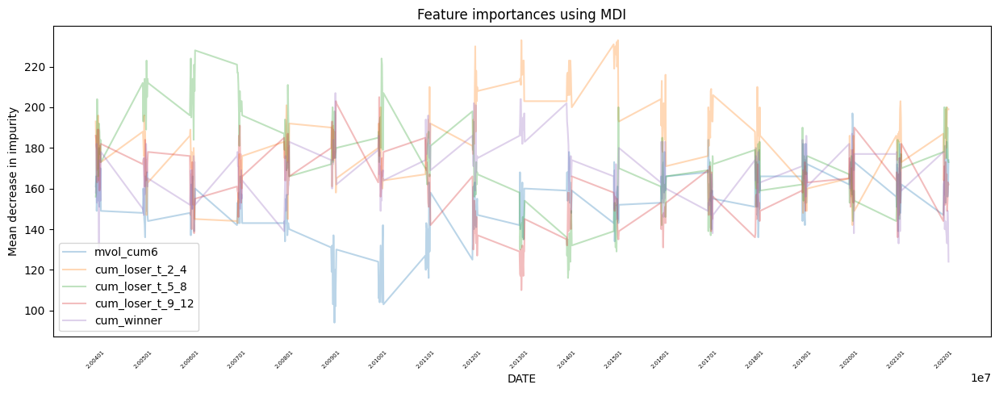

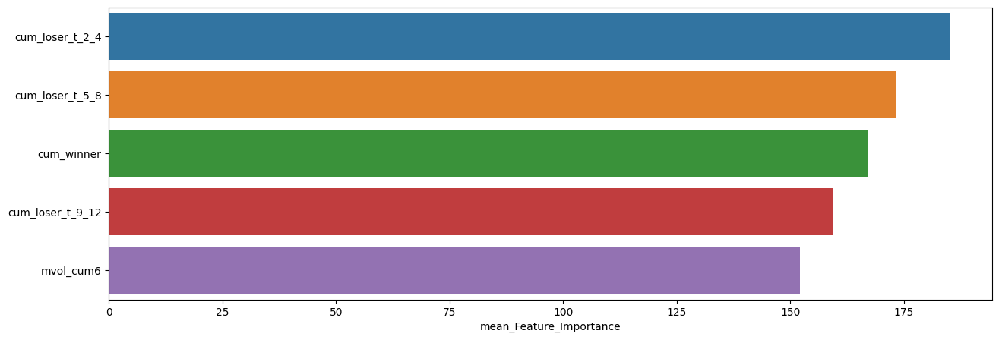

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_2_4,185.153509,233,142
cum_loser_t_5_8,173.359649,228,116
cum_winner,167.206140,207,124
cum_loser_t_9_12,159.429825,205,110
mvol_cum6,152.171053,197,94


In [41]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



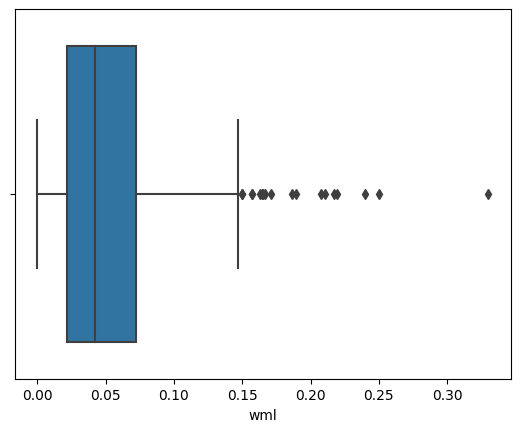

,count,mean,std,min,25%,50%,75%,max
wml,440.0,0.052843,0.04515,0.000007,0.021945,0.042079,0.072198,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



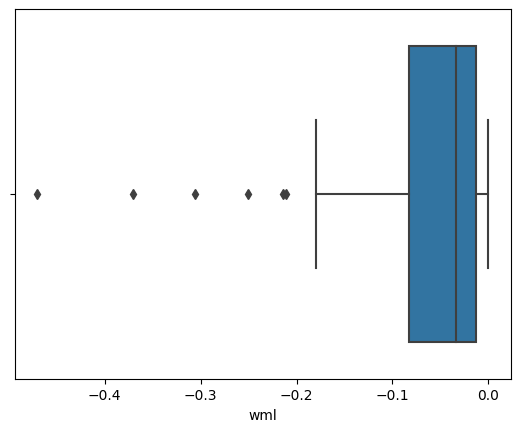

,count,mean,std,min,25%,50%,75%,max
wml,82.0,-0.064539,0.084109,-0.469903,-0.082798,-0.033635,-0.013277,-0.000183



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



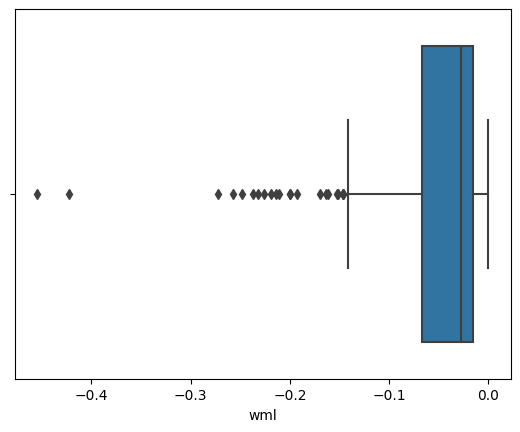

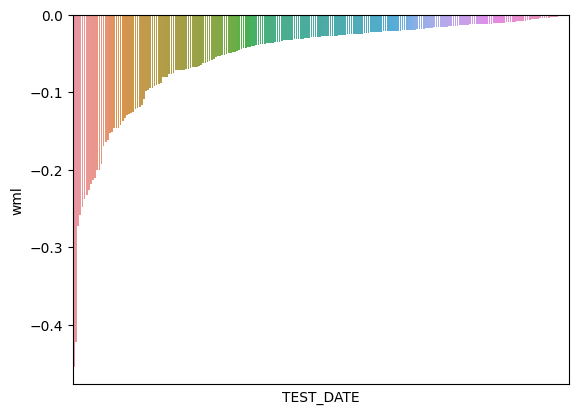

,count,mean,std,min,25%,50%,75%,max
wml,234.0,-0.053428,0.066097,-0.454349,-0.067189,-0.02793,-0.015294,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



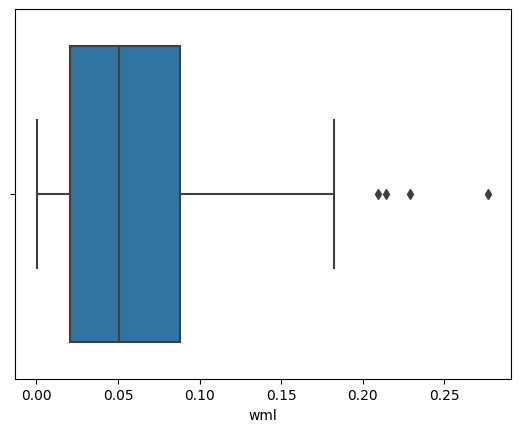

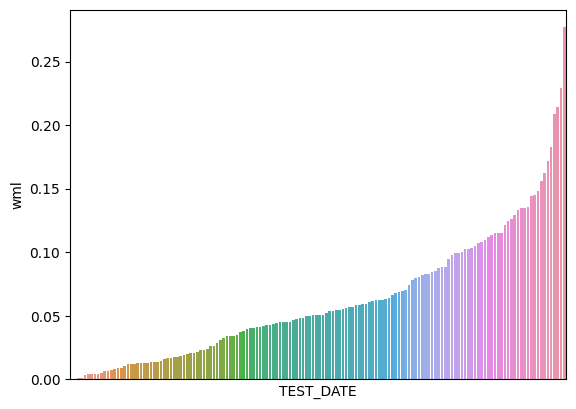

,count,mean,std,min,25%,50%,75%,max
wml,150.0,0.062309,0.050879,0.000577,0.020852,0.050558,0.087921,0.276912


In [42]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.61276

최근 누적 수익률

  2022년-12월 -> 6353.55
  2022년-11월 -> 5724.34
  2022년-10월 -> 5445.00
  2022년-09월 -> 5445.00
  2022년-08월 -> 5445.00

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-07월 -> 33063.99
  2등 : 2002년-06월 -> 33063.99
  3등 : 2002년-08월 -> 32106.07
  4등 : 2002년-09월 -> 32106.07
  5등 : 2008년-06월 -> 30478.60
  6등 : 2009년-02월 -> 30161.47
  7등 : 2002년-05월 -> 28431.03
  8등 : 2002년-04월 -> 28431.03
  9등 : 2008년-11월 -> 27507.78
  10등 : 2009년-01월 -> 26856.67



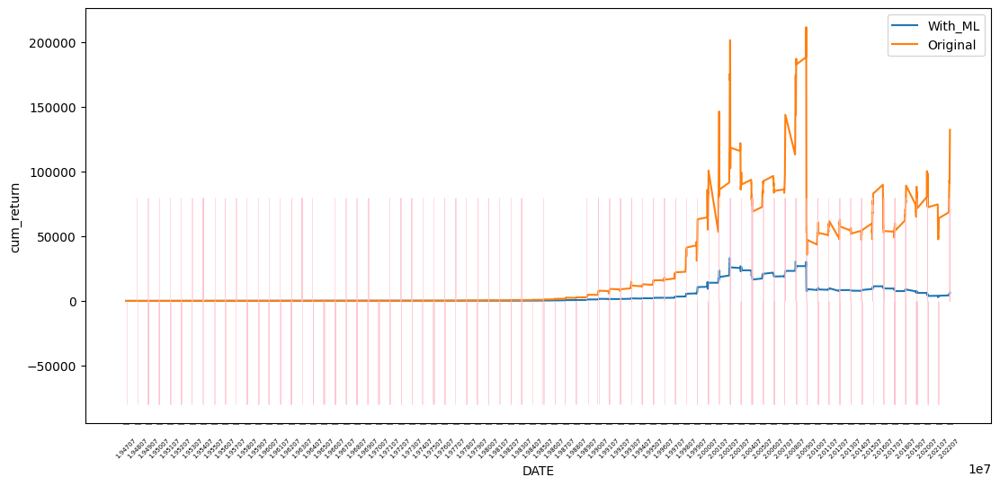

In [43]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.71639

최근 누적 수익률

  2022년-12월 -> 4581.21
  2022년-11월 -> 4199.01
  2022년-10월 -> 4037.67
  2022년-09월 -> 3854.50
  2022년-08월 -> 3788.20

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 9034.90
  2등 : 2002년-07월 -> 8914.97
  3등 : 2002년-06월 -> 8828.62
  4등 : 2002년-08월 -> 8713.66
  5등 : 2009년-02월 -> 8700.92
  6등 : 2008년-06월 -> 8324.95
  7등 : 2008년-11월 -> 8015.74
  8등 : 2009년-01월 -> 7971.71
  9등 : 2008년-12월 -> 7883.75
  10등 : 2002년-10월 -> 7668.68



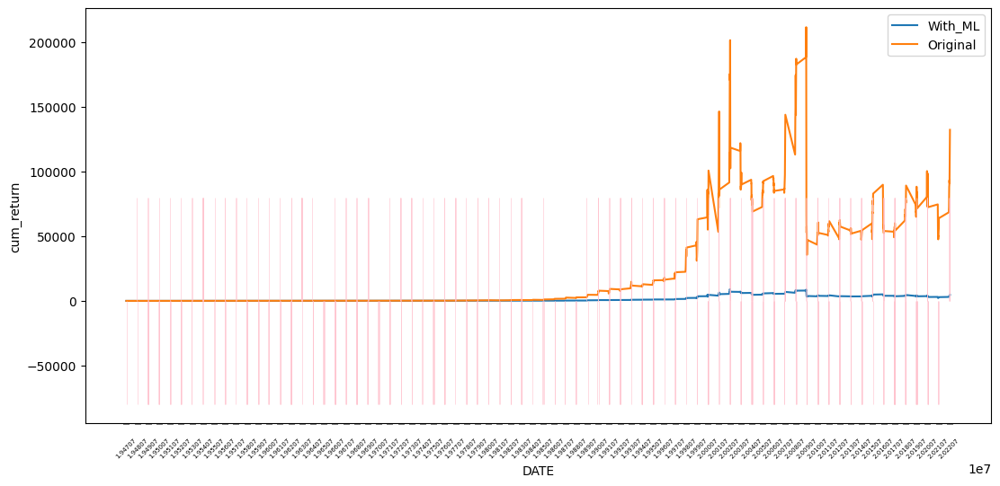

In [44]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [45]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.19      0.25       316
         1.0       0.65      0.82      0.73       590

    accuracy                           0.60       906
   macro avg       0.51      0.51      0.49       906
weighted avg       0.55      0.60      0.56       906


accuracy : 0.6015452538631346

precision : 0.6545209176788124

recall : 0.8220338983050848

F1-Score : 0.7287753568745305



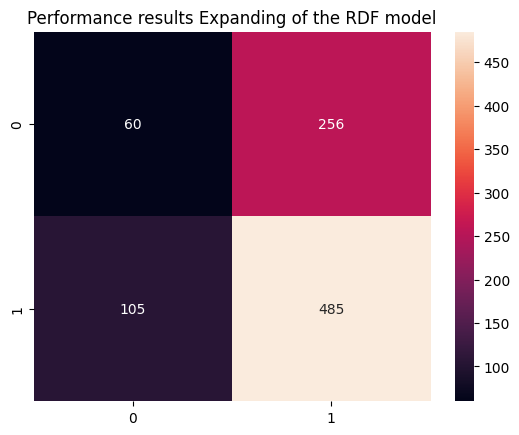


Feature Importance of the model



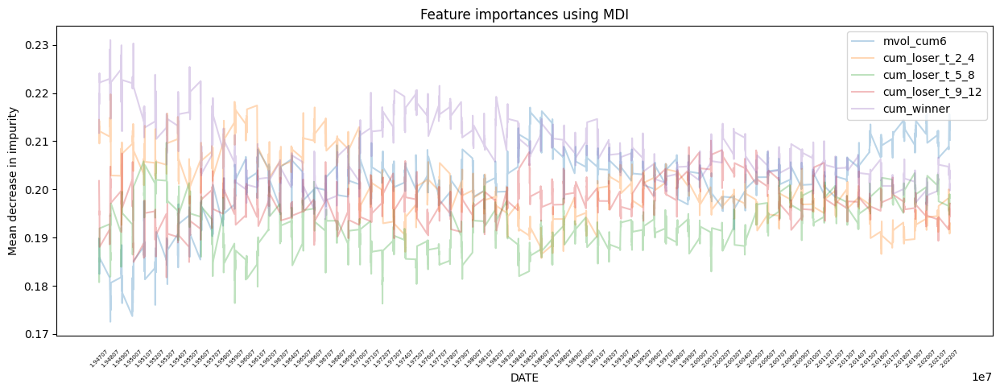

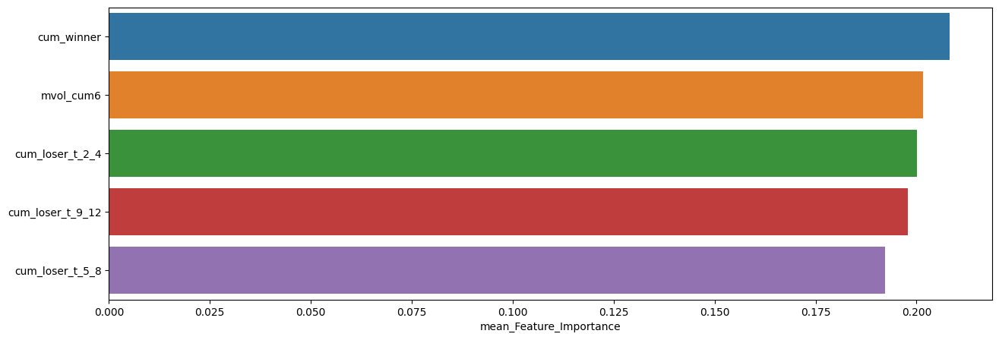

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.208288,0.230993,0.193796
mvol_cum6,0.201554,0.216988,0.172519
cum_loser_t_2_4,0.200191,0.219738,0.185732
cum_loser_t_9_12,0.197759,0.210122,0.181723
cum_loser_t_5_8,0.192208,0.209706,0.176283


In [46]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.24      0.29        75
         1.0       0.68      0.79      0.73       151

    accuracy                           0.61       226
   macro avg       0.52      0.52      0.51       226
weighted avg       0.57      0.61      0.59       226


accuracy : 0.6106194690265486

precision : 0.6779661016949152

recall : 0.7947019867549668

F1-Score : 0.7317073170731707



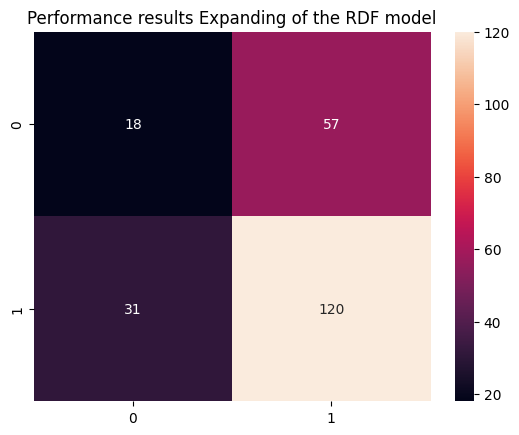


Feature Importance of the model



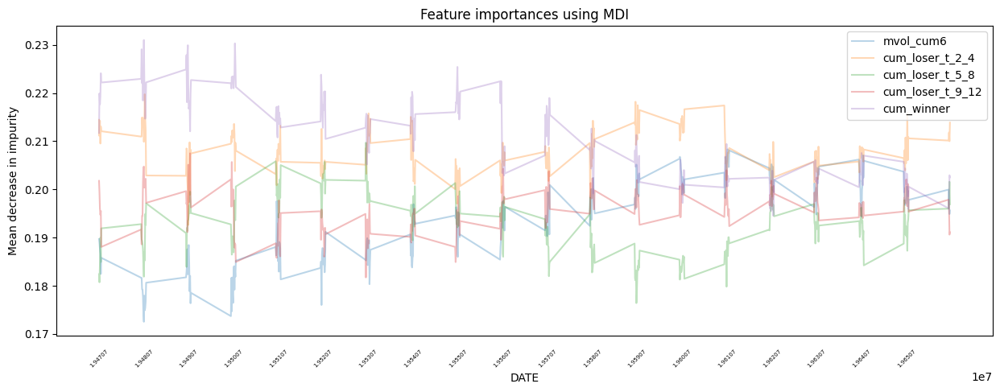

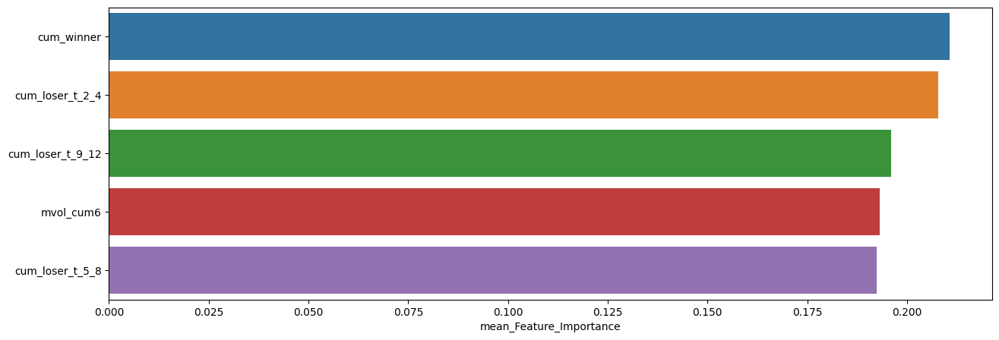

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.210743,0.230993,0.194533
cum_loser_t_2_4,0.207821,0.219738,0.192625
cum_loser_t_9_12,0.195904,0.207482,0.181723
mvol_cum6,0.193135,0.208307,0.172519
cum_loser_t_5_8,0.192398,0.209706,0.176399



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.20      0.25        75
         1.0       0.67      0.81      0.73       151

    accuracy                           0.61       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.61      0.57       226


accuracy : 0.6061946902654868

precision : 0.6703296703296703

recall : 0.8079470198675497

F1-Score : 0.7327327327327328



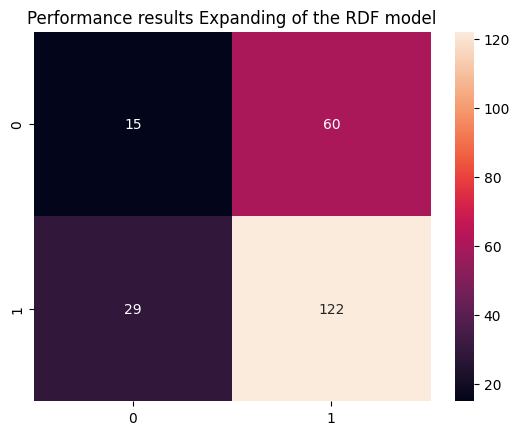


Feature Importance of the model



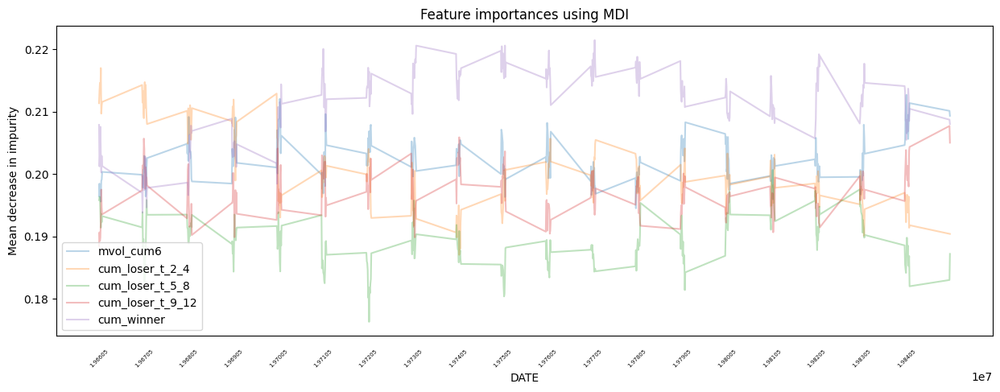

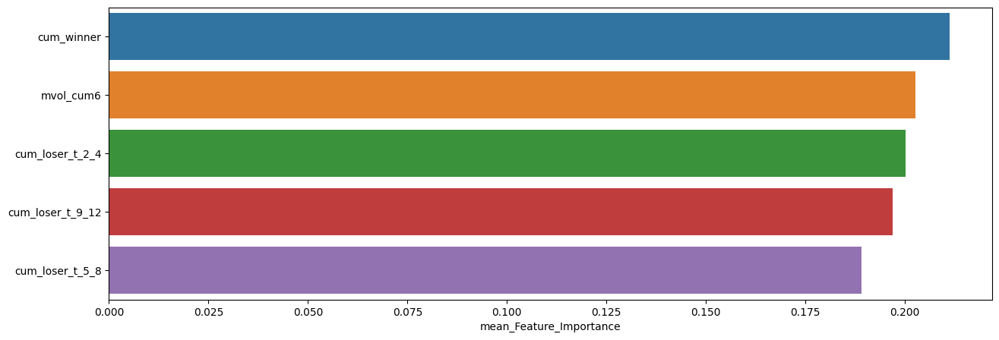

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.211299,0.221500,0.193796
mvol_cum6,0.202592,0.212711,0.194507
cum_loser_t_2_4,0.200120,0.217013,0.187045
cum_loser_t_9_12,0.196968,0.207718,0.188459
cum_loser_t_5_8,0.189020,0.200658,0.176283



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.20      0.28        70
         1.0       0.71      0.89      0.79       156

    accuracy                           0.68       226
   macro avg       0.58      0.55      0.53       226
weighted avg       0.63      0.68      0.63       226


accuracy : 0.6769911504424779

precision : 0.7128205128205128

recall : 0.8910256410256411

F1-Score : 0.7920227920227921



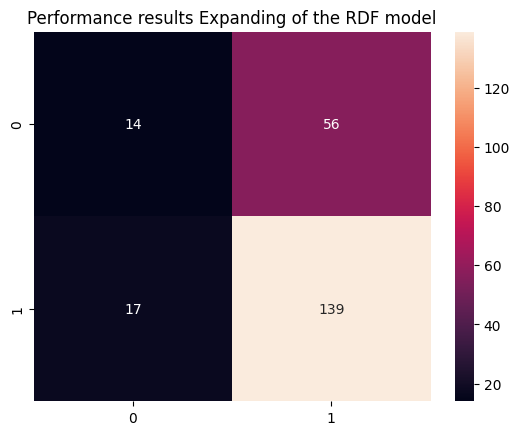


Feature Importance of the model



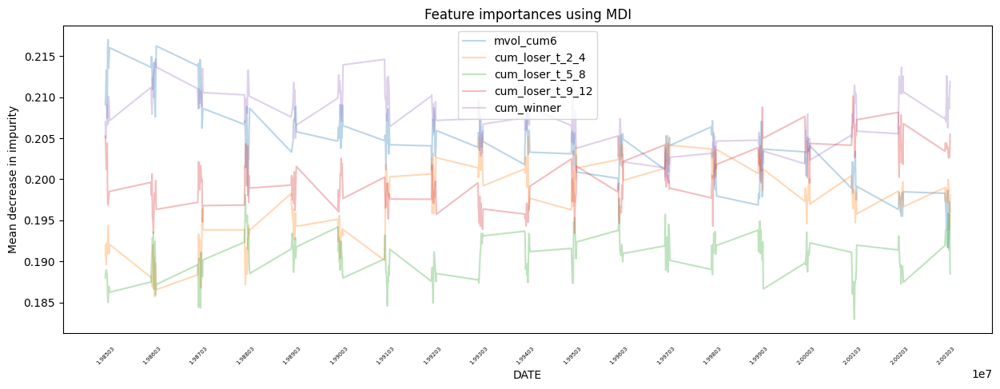

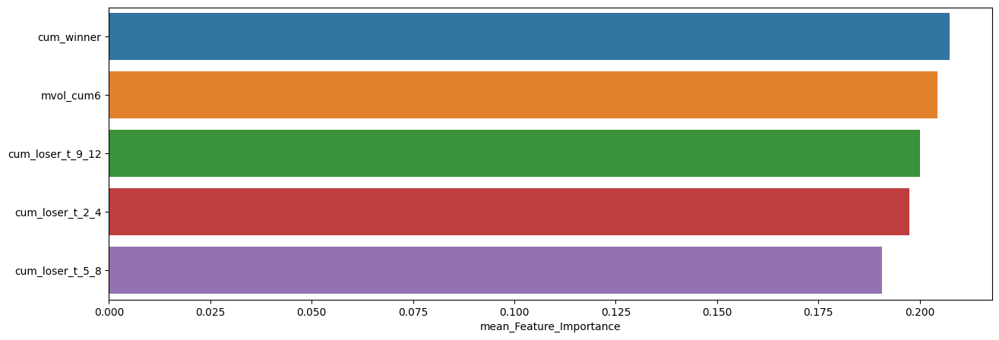

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.207449,0.214620,0.199575
mvol_cum6,0.204304,0.216988,0.191684
cum_loser_t_9_12,0.200118,0.210122,0.193453
cum_loser_t_2_4,0.197518,0.205305,0.185732
cum_loser_t_5_8,0.190610,0.198115,0.182956



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.14      0.19        96
         1.0       0.56      0.79      0.65       132

    accuracy                           0.51       228
   macro avg       0.44      0.46      0.42       228
weighted avg       0.46      0.51      0.46       228


accuracy : 0.5131578947368421

precision : 0.5561497326203209

recall : 0.7878787878787878

F1-Score : 0.6520376175548589



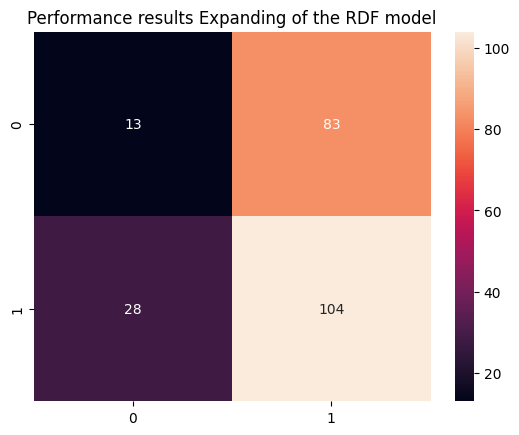


Feature Importance of the model



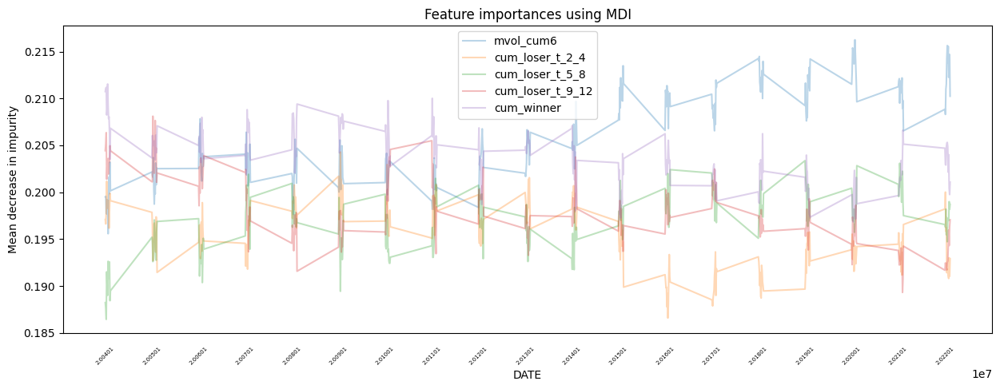

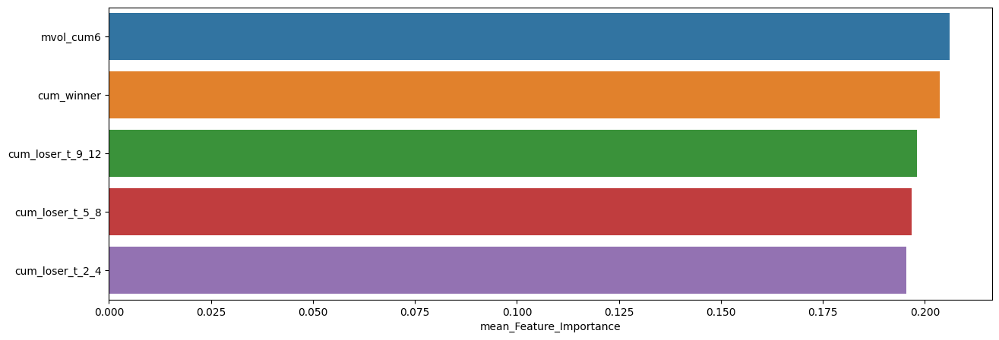

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.206146,0.216255,0.195582
cum_winner,0.203702,0.211538,0.196834
cum_loser_t_9_12,0.198042,0.208106,0.189319
cum_loser_t_5_8,0.196762,0.203369,0.186445
cum_loser_t_2_4,0.195348,0.204284,0.186588


In [47]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



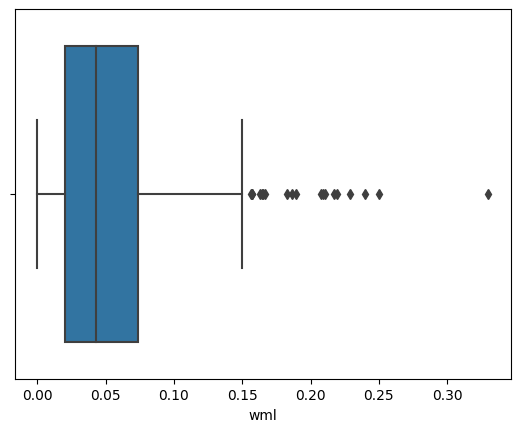

,count,mean,std,min,25%,50%,75%,max
wml,485.0,0.053957,0.046127,0.000007,0.020549,0.042855,0.073414,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



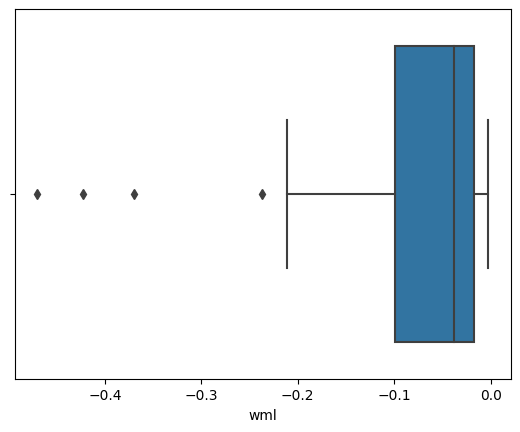

,count,mean,std,min,25%,50%,75%,max
wml,60.0,-0.073076,0.096076,-0.469903,-0.098904,-0.038384,-0.017561,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



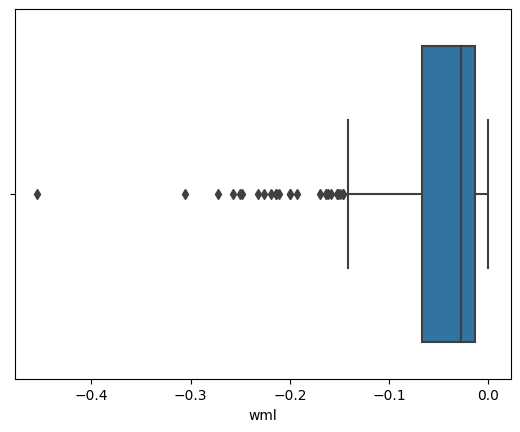

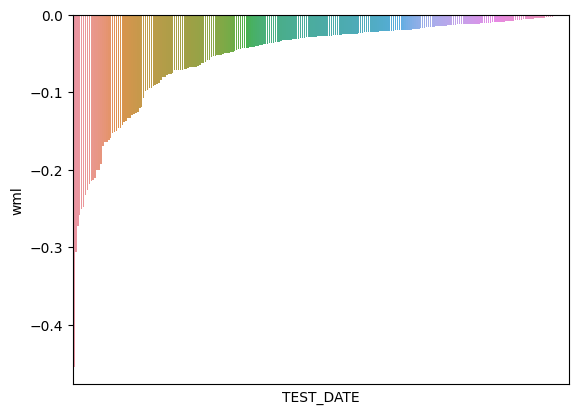

,count,mean,std,min,25%,50%,75%,max
wml,256.0,-0.052382,0.063648,-0.454349,-0.066701,-0.027518,-0.013844,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



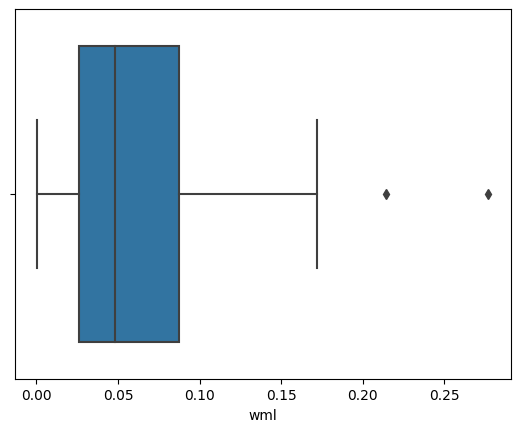

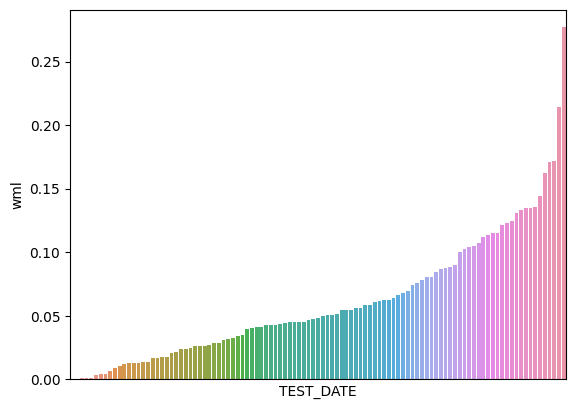

,count,mean,std,min,25%,50%,75%,max
wml,105.0,0.06122,0.049645,0.000577,0.026238,0.047955,0.087127,0.276912


In [48]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.65517

최근 누적 수익률

  2022년-12월 -> 40639.69
  2022년-11월 -> 36615.55
  2022년-10월 -> 34829.07
  2022년-09월 -> 30840.59
  2022년-08월 -> 30840.59

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2007년-12월 -> 66204.65
  2등 : 2008년-06월 -> 65912.83
  3등 : 2008년-11월 -> 64023.25
  4등 : 2009년-02월 -> 62507.86
  5등 : 2009년-01월 -> 62507.86
  6등 : 2008년-12월 -> 62507.86
  7등 : 2009년-03월 -> 62507.86
  8등 : 2002년-09월 -> 62386.28
  9등 : 2007년-09월 -> 61465.74
  10등 : 2007년-10월 -> 61465.74



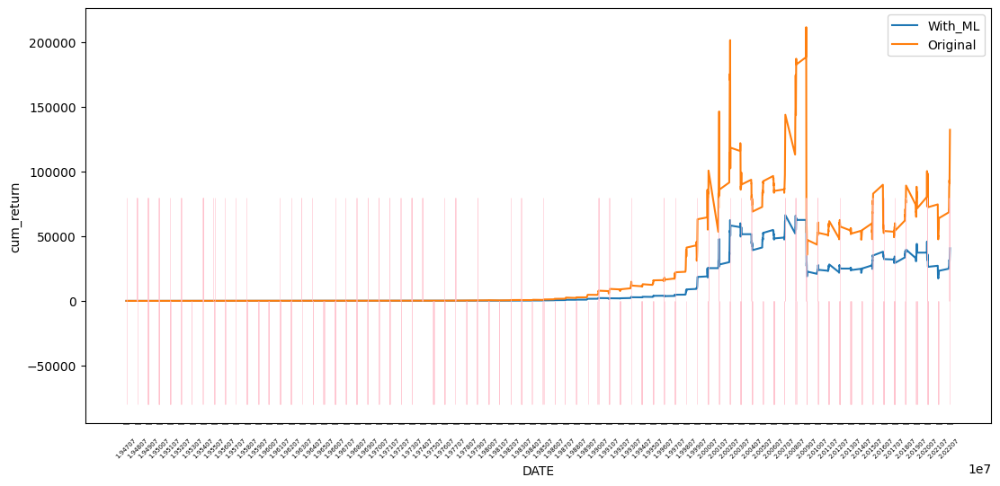

In [49]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.73013

최근 누적 수익률

  2022년-12월 -> 7211.69
  2022년-11월 -> 6669.23
  2022년-10월 -> 6400.01
  2022년-09월 -> 5875.63
  2022년-08월 -> 5638.92

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 7282.66
  2등 : 2022년-12월 -> 7211.69
  3등 : 2008년-11월 -> 6890.37
  4등 : 2009년-01월 -> 6884.45
  5등 : 2008년-12월 -> 6802.29
  6등 : 2008년-06월 -> 6801.34
  7등 : 2022년-11월 -> 6669.23
  8등 : 2008년-10월 -> 6536.73
  9등 : 2002년-09월 -> 6489.84
  10등 : 2022년-10월 -> 6400.01



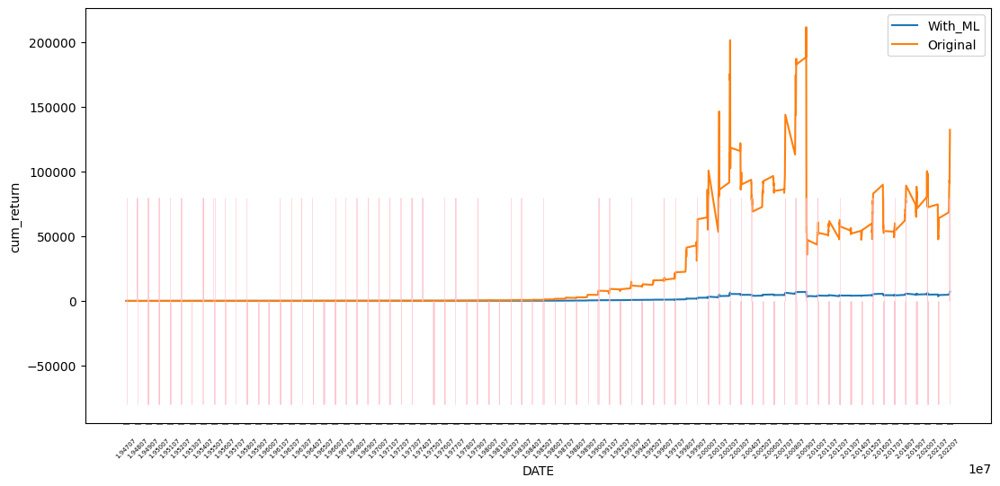

In [50]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [51]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.14      0.20       316
         1.0       0.65      0.87      0.75       590

    accuracy                           0.62       906
   macro avg       0.51      0.51      0.48       906
weighted avg       0.56      0.62      0.56       906


accuracy : 0.6169977924944813

precision : 0.6543837357052097

recall : 0.8728813559322034

F1-Score : 0.74800290486565



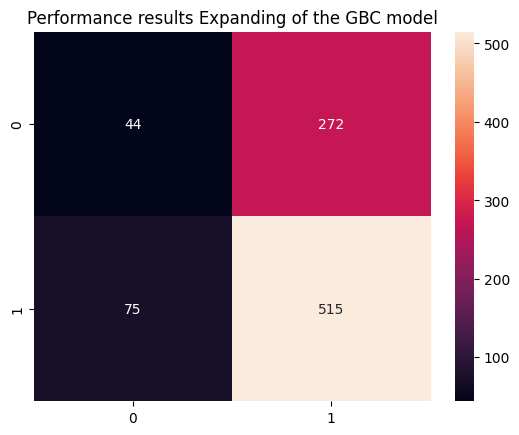


Feature Importance of the model



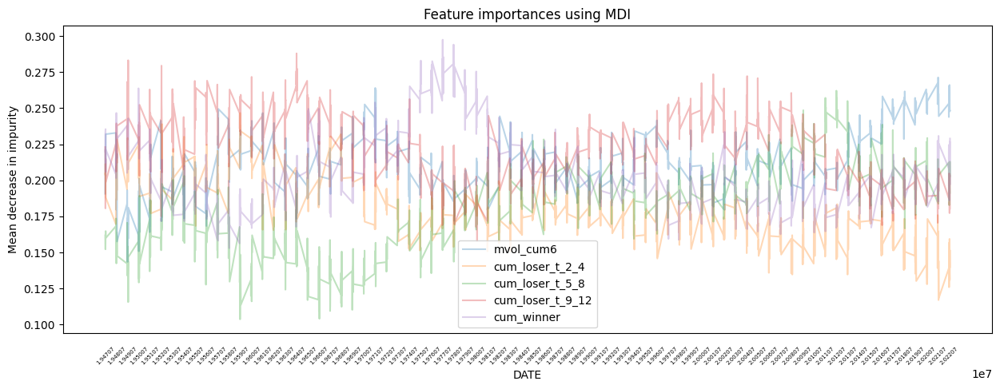

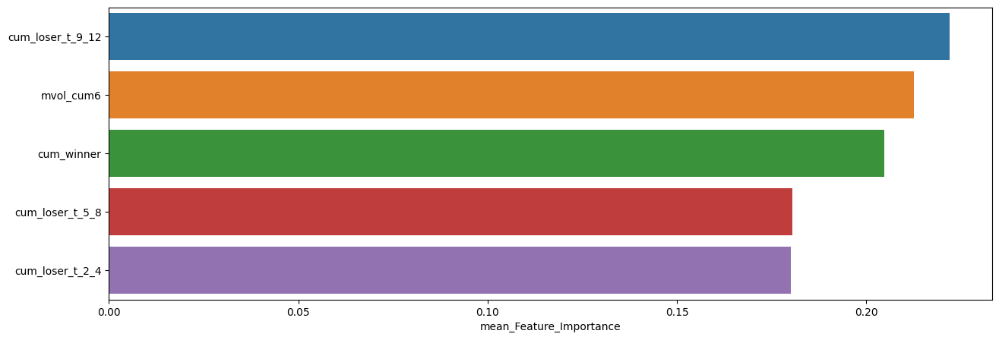

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.222105,0.287908,0.157772
mvol_cum6,0.212571,0.271252,0.143385
cum_winner,0.204830,0.297391,0.152949
cum_loser_t_5_8,0.180405,0.262071,0.103642
cum_loser_t_2_4,0.180088,0.246677,0.116986


In [52]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.24      0.31        75
         1.0       0.69      0.83      0.75       151

    accuracy                           0.64       226
   macro avg       0.55      0.54      0.53       226
weighted avg       0.60      0.64      0.61       226


accuracy : 0.6371681415929203

precision : 0.6885245901639344

recall : 0.8344370860927153

F1-Score : 0.7544910179640718



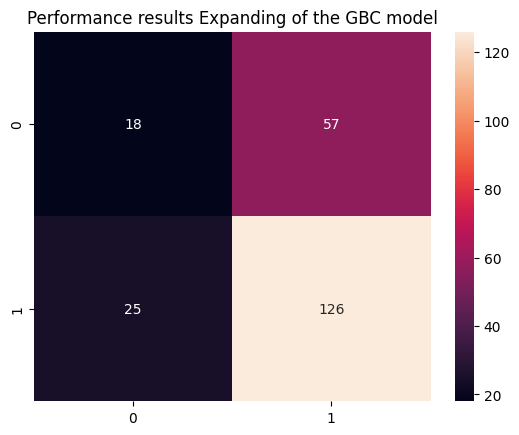


Feature Importance of the model



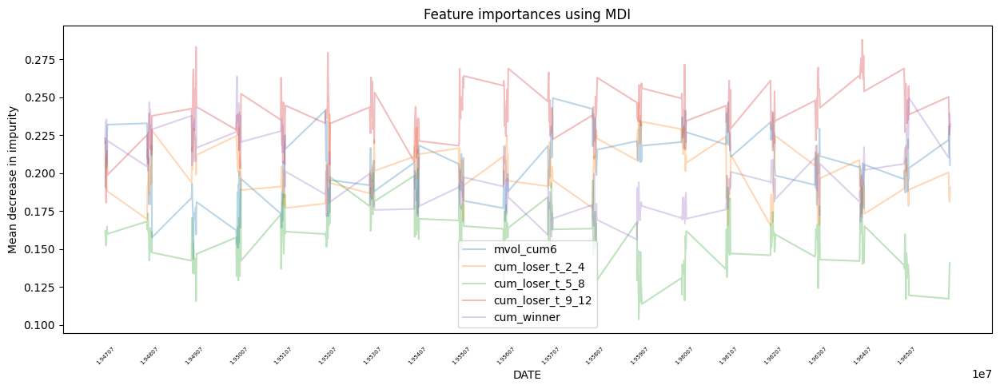

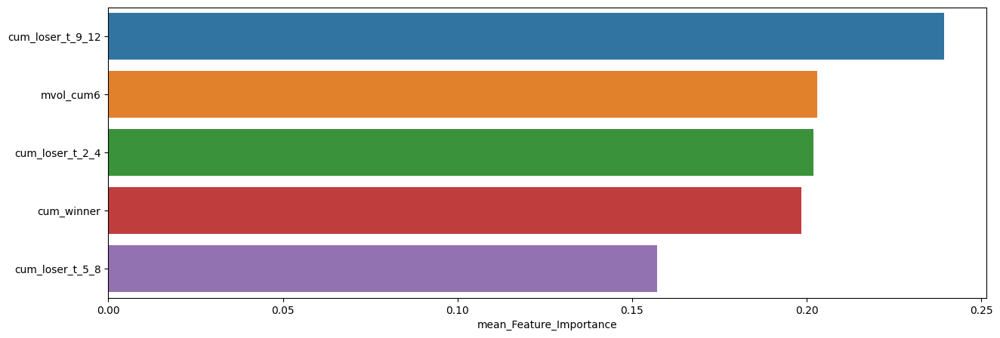

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.239442,0.287908,0.180490
mvol_cum6,0.202957,0.249435,0.143385
cum_loser_t_2_4,0.202024,0.246677,0.165447
cum_winner,0.198428,0.263707,0.152949
cum_loser_t_5_8,0.157148,0.203008,0.103642



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.17      0.24        75
         1.0       0.68      0.85      0.75       151

    accuracy                           0.63       226
   macro avg       0.52      0.51      0.50       226
weighted avg       0.57      0.63      0.58       226


accuracy : 0.6283185840707964

precision : 0.675392670157068

recall : 0.8543046357615894

F1-Score : 0.7543859649122806



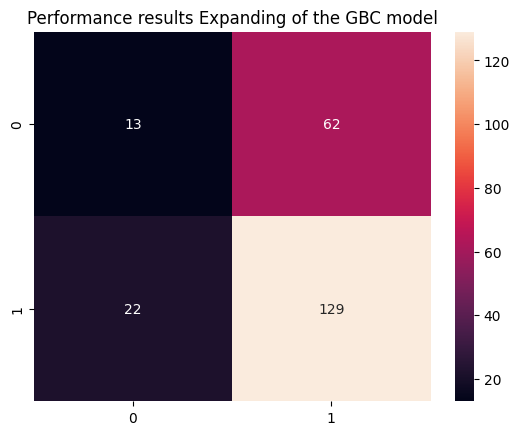


Feature Importance of the model



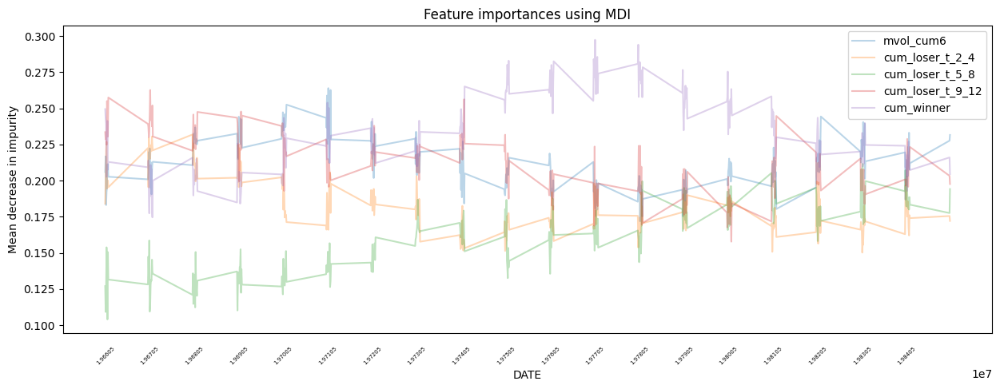

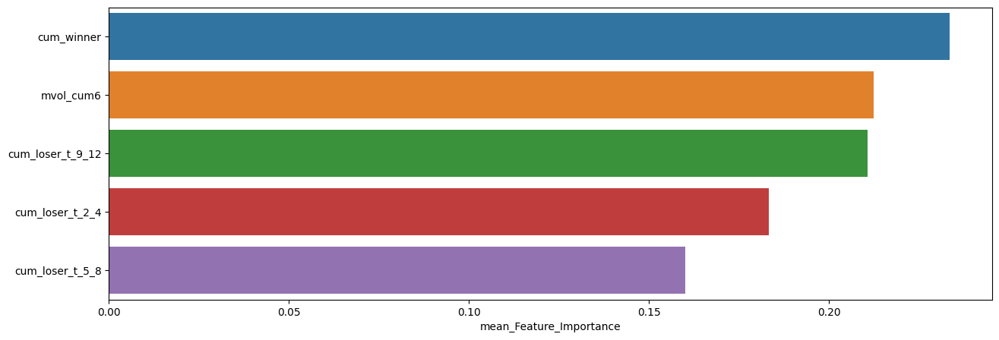

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.233597,0.297391,0.174571
mvol_cum6,0.212408,0.263962,0.171850
cum_loser_t_9_12,0.210709,0.262626,0.157772
cum_loser_t_2_4,0.183231,0.231871,0.150217
cum_loser_t_5_8,0.160055,0.211583,0.104013



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.07      0.12        70
         1.0       0.70      0.96      0.81       156

    accuracy                           0.68       226
   macro avg       0.56      0.51      0.46       226
weighted avg       0.61      0.68      0.59       226


accuracy : 0.6814159292035398

precision : 0.6962616822429907

recall : 0.9551282051282052

F1-Score : 0.8054054054054054



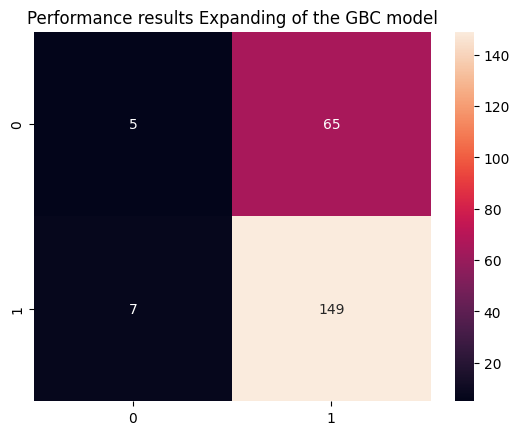


Feature Importance of the model



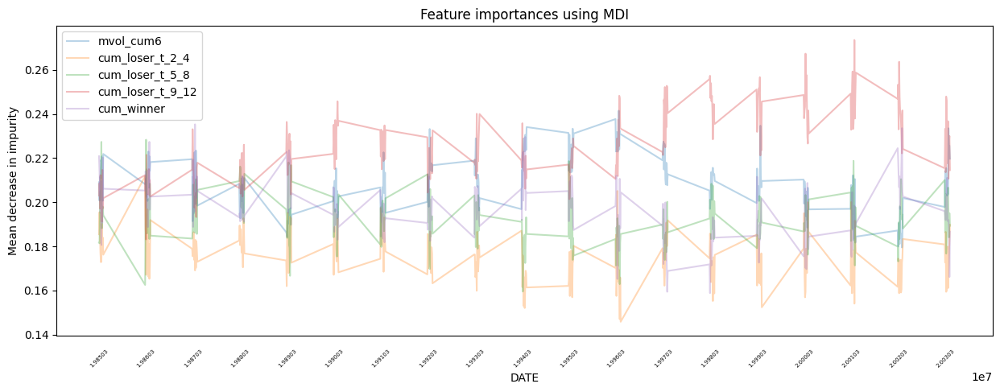

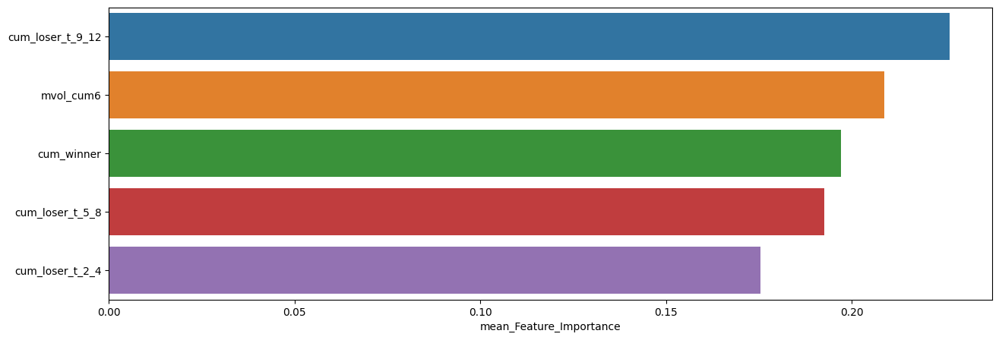

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.226391,0.273522,0.183103
mvol_cum6,0.208642,0.241486,0.179464
cum_winner,0.196984,0.235288,0.158790
cum_loser_t_5_8,0.192507,0.228315,0.159467
cum_loser_t_2_4,0.175476,0.211812,0.145775



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.28      0.08      0.13        96
         1.0       0.56      0.84      0.67       132

    accuracy                           0.52       228
   macro avg       0.42      0.46      0.40       228
weighted avg       0.44      0.52      0.44       228


accuracy : 0.5219298245614035

precision : 0.5577889447236181

recall : 0.8409090909090909

F1-Score : 0.6706948640483383



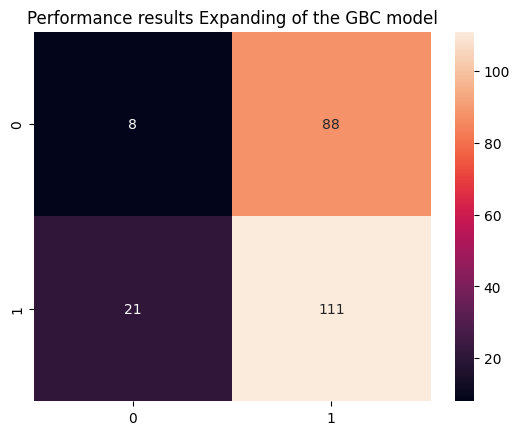


Feature Importance of the model



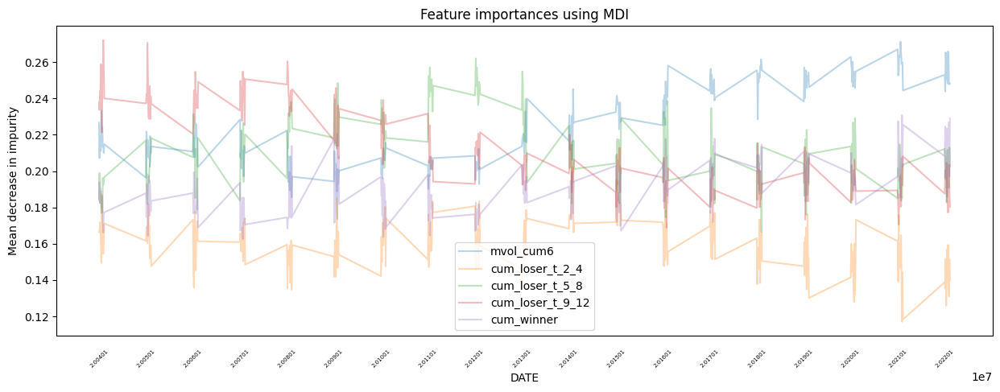

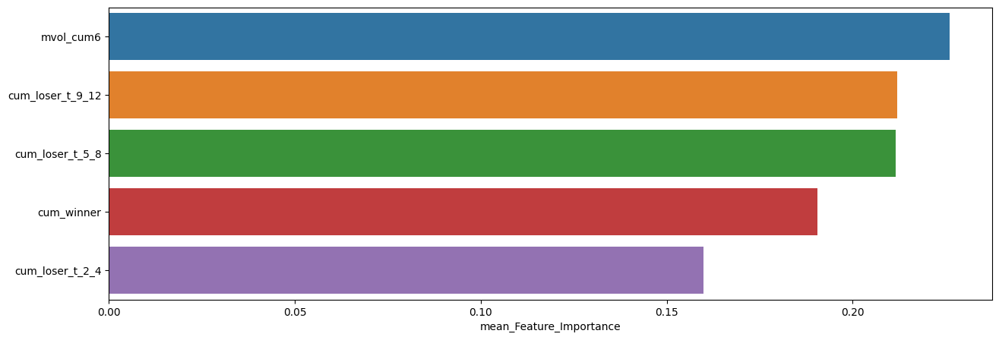

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.226158,0.271252,0.173672
cum_loser_t_9_12,0.211969,0.272164,0.168844
cum_loser_t_5_8,0.211634,0.262071,0.166627
cum_winner,0.190440,0.230761,0.162595
cum_loser_t_2_4,0.159799,0.202200,0.116986


In [53]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



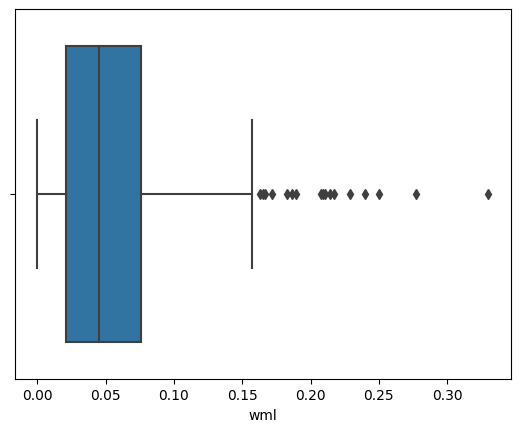

,count,mean,std,min,25%,50%,75%,max
wml,515.0,0.054907,0.046643,0.000007,0.021107,0.045275,0.076092,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



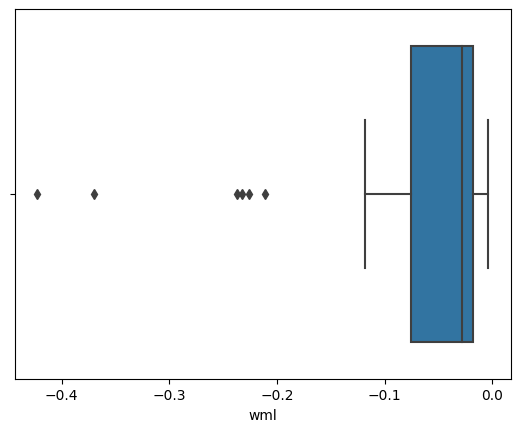

,count,mean,std,min,25%,50%,75%,max
wml,44.0,-0.071781,0.094909,-0.4224,-0.07517,-0.028053,-0.018026,-0.003575



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



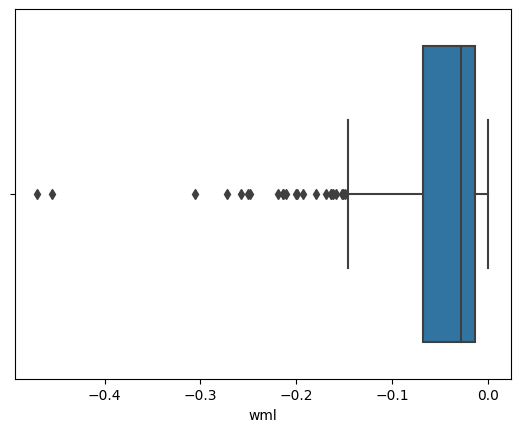

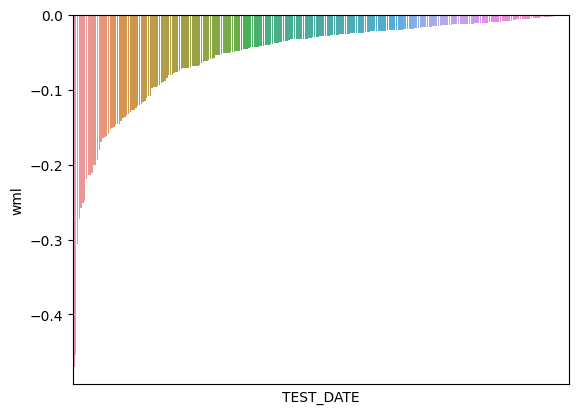

,count,mean,std,min,25%,50%,75%,max
wml,272.0,-0.053809,0.066513,-0.469903,-0.067694,-0.028699,-0.013899,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



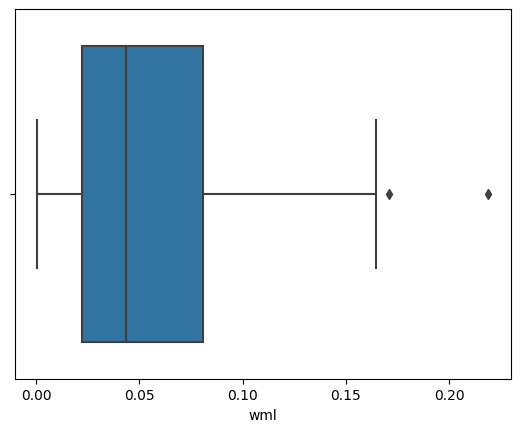

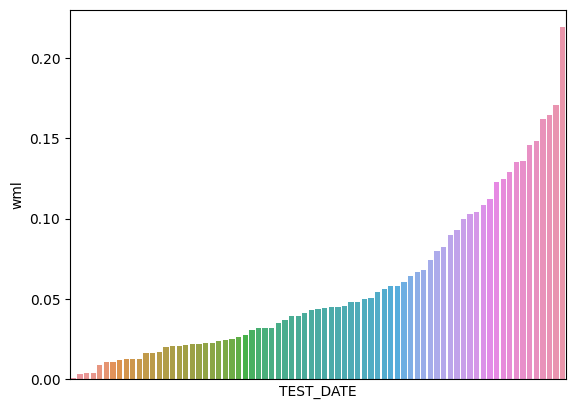

,count,mean,std,min,25%,50%,75%,max
wml,75.0,0.057606,0.048205,0.000692,0.022125,0.043713,0.080899,0.219012


In [54]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.69833

최근 누적 수익률

  2022년-12월 -> 74088.12
  2022년-11월 -> 66752.00
  2022년-10월 -> 63495.20
  2022년-09월 -> 63495.20
  2022년-08월 -> 63495.20

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-11월 -> 127600.36
  2등 : 2009년-02월 -> 124580.16
  3등 : 2009년-01월 -> 124580.16
  4등 : 2008년-12월 -> 124580.16
  5등 : 2009년-03월 -> 124580.16
  6등 : 2008년-06월 -> 118975.17
  7등 : 2008년-04월 -> 118975.17
  8등 : 2008년-05월 -> 118975.17
  9등 : 2007년-12월 -> 118754.10
  10등 : 2008년-03월 -> 116961.17



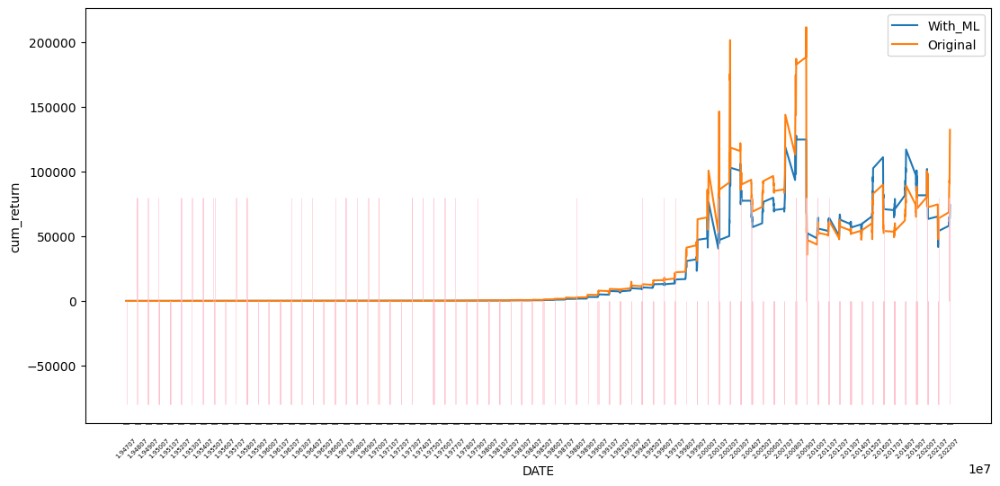

In [55]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.75370

최근 누적 수익률

  2022년-12월 -> 6729.39
  2022년-11월 -> 6322.14
  2022년-10월 -> 6121.30
  2022년-09월 -> 5805.07
  2022년-08월 -> 5568.48

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 8749.02
  2등 : 2008년-11월 -> 8403.60
  3등 : 2009년-01월 -> 8371.43
  4등 : 2008년-12월 -> 8280.67
  5등 : 2008년-06월 -> 8049.07
  6등 : 2008년-10월 -> 7963.60
  7등 : 2002년-09월 -> 7772.79
  8등 : 2008년-09월 -> 7673.41
  9등 : 2008년-05월 -> 7473.79
  10등 : 2007년-12월 -> 7466.11



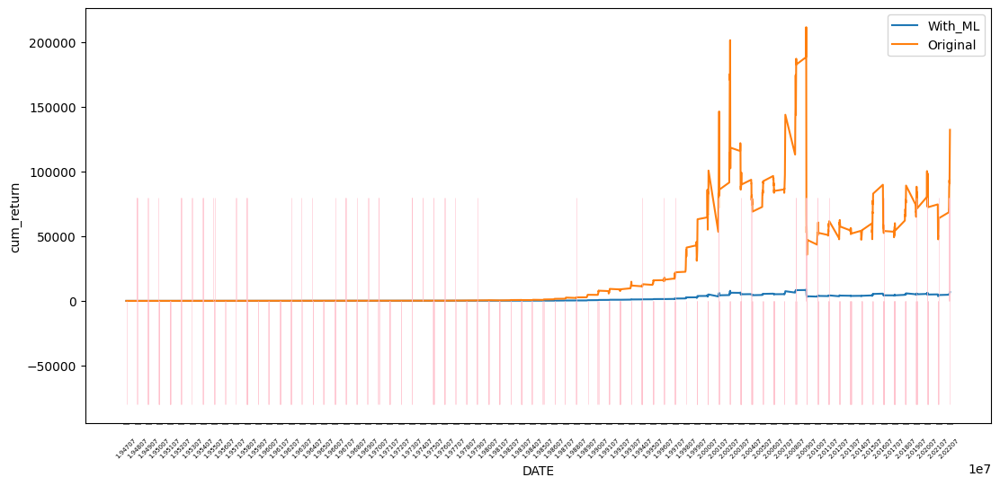

In [56]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [57]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.26      0.31       316
         1.0       0.66      0.76      0.70       590

    accuracy                           0.58       906
   macro avg       0.51      0.51      0.50       906
weighted avg       0.56      0.58      0.56       906


accuracy : 0.5838852097130243

precision : 0.6568483063328424

recall : 0.7559322033898305

F1-Score : 0.7029156816390858



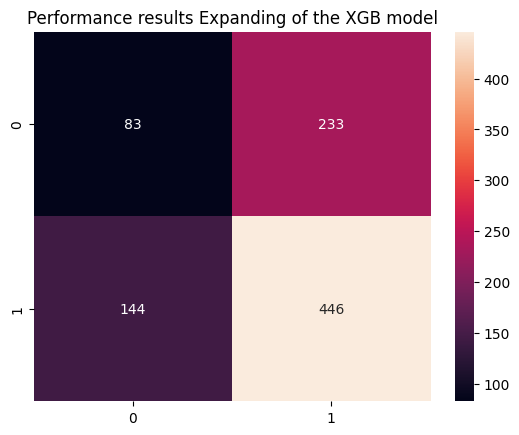


Feature Importance of the model



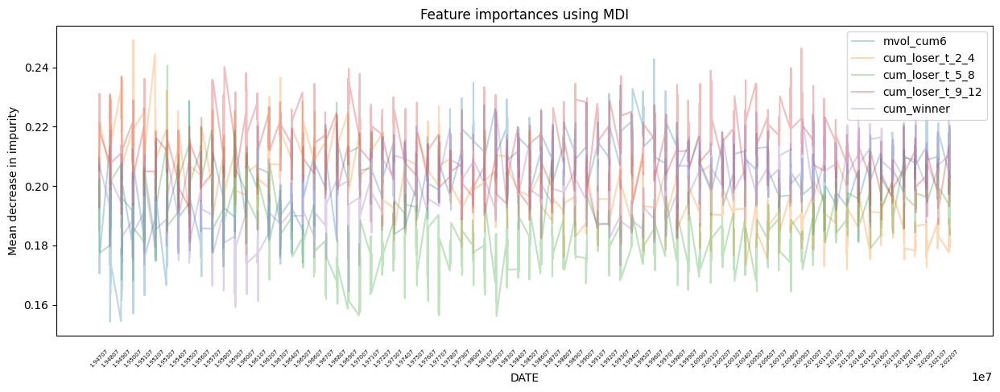

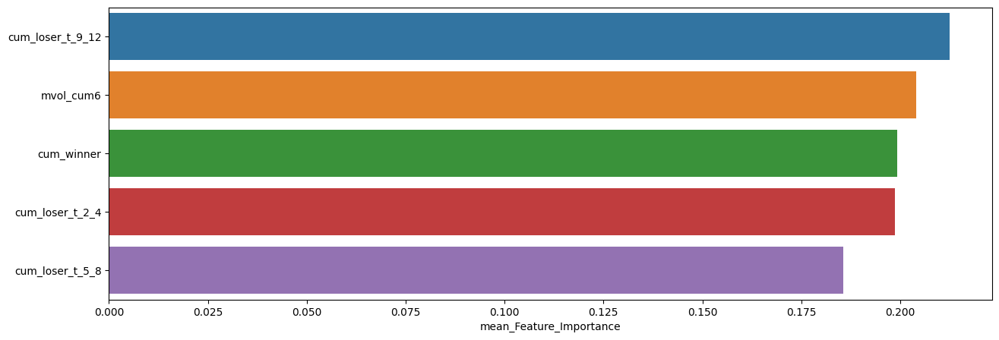

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.212580,0.246429,0.181126
mvol_cum6,0.204074,0.242743,0.154268
cum_winner,0.199152,0.227909,0.159229
cum_loser_t_2_4,0.198680,0.249203,0.171951
cum_loser_t_5_8,0.185513,0.240578,0.156153


In [58]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.28      0.30        75
         1.0       0.66      0.70      0.68       151

    accuracy                           0.56       226
   macro avg       0.49      0.49      0.49       226
weighted avg       0.55      0.56      0.55       226


accuracy : 0.5619469026548672

precision : 0.6625

recall : 0.7019867549668874

F1-Score : 0.6816720257234726



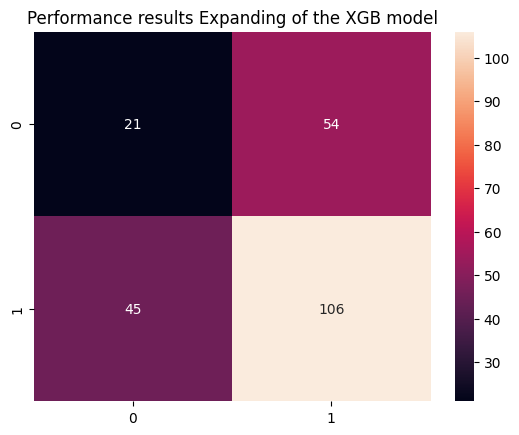


Feature Importance of the model



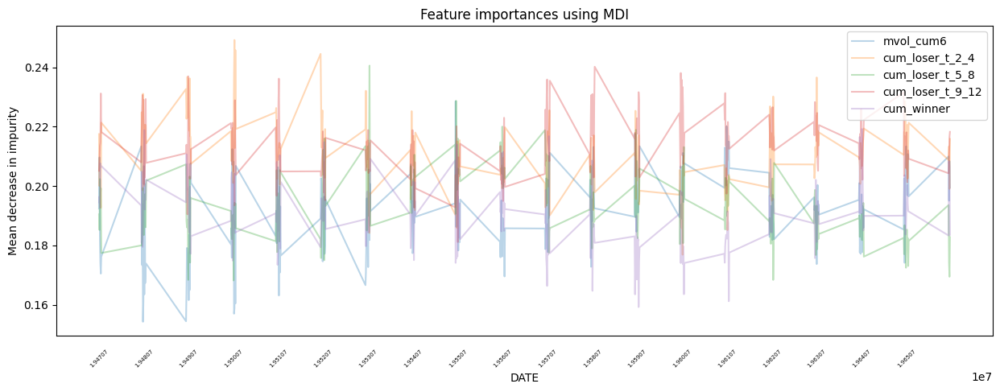

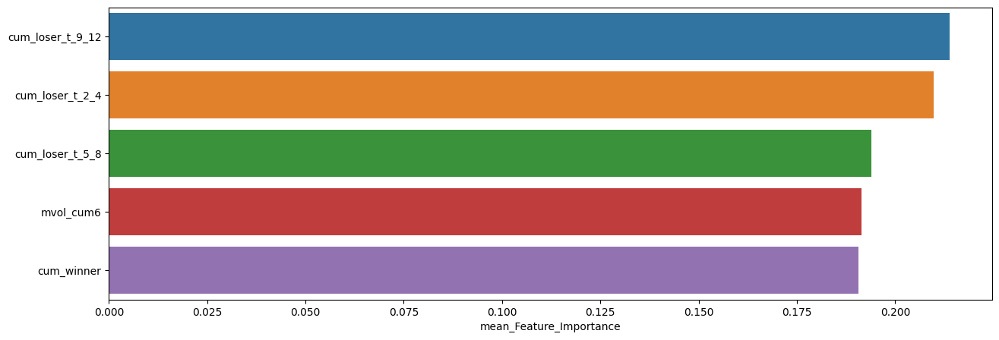

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.213935,0.240209,0.181126
cum_loser_t_2_4,0.209869,0.249203,0.176862
cum_loser_t_5_8,0.194017,0.240578,0.168180
mvol_cum6,0.191454,0.228583,0.154268
cum_winner,0.190725,0.219255,0.159229



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.27      0.32        75
         1.0       0.69      0.81      0.74       151

    accuracy                           0.63       226
   macro avg       0.55      0.54      0.53       226
weighted avg       0.60      0.63      0.60       226


accuracy : 0.6283185840707964

precision : 0.6892655367231638

recall : 0.8079470198675497

F1-Score : 0.7439024390243902



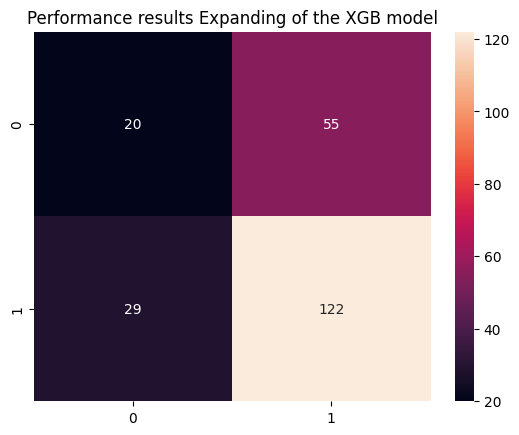


Feature Importance of the model



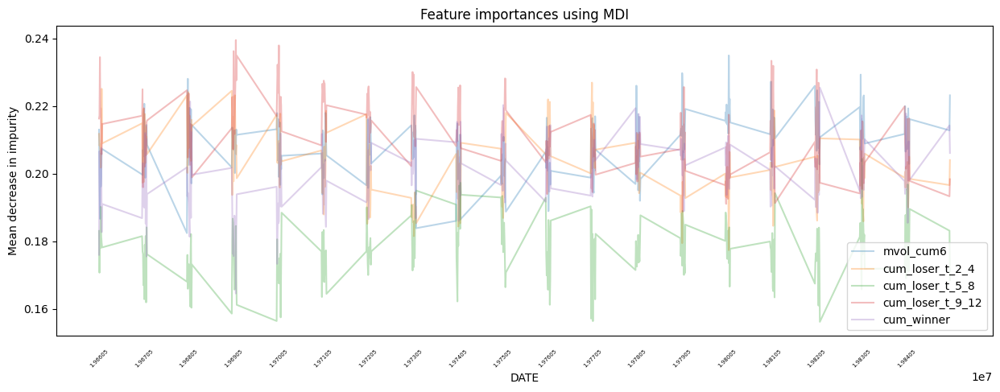

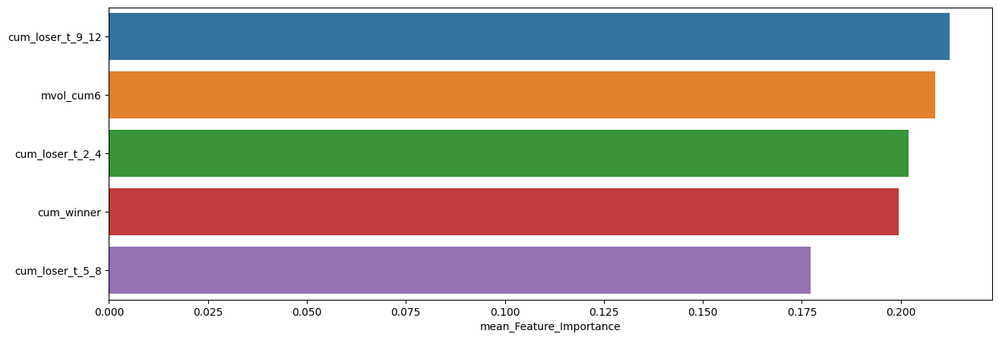

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.212429,0.239466,0.188756
mvol_cum6,0.208726,0.234933,0.182392
cum_loser_t_2_4,0.202066,0.226899,0.177340
cum_winner,0.199572,0.225452,0.164529
cum_loser_t_5_8,0.177208,0.204366,0.156153



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.27      0.32        70
         1.0       0.71      0.81      0.76       156

    accuracy                           0.65       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.62      0.65      0.62       226


accuracy : 0.6460176991150443

precision : 0.7134831460674157

recall : 0.8141025641025641

F1-Score : 0.7604790419161676



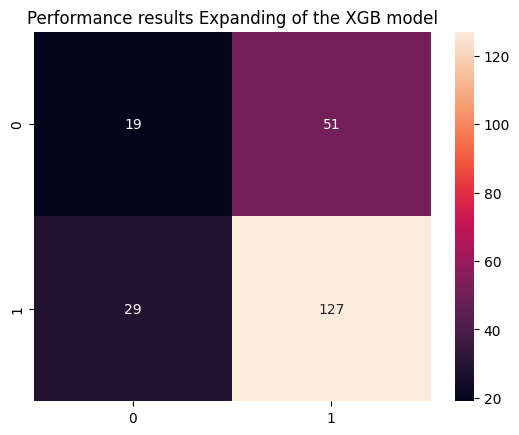


Feature Importance of the model



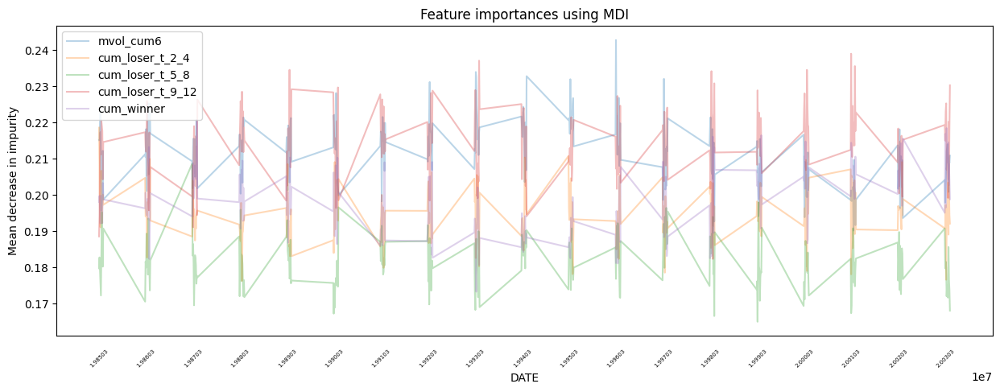

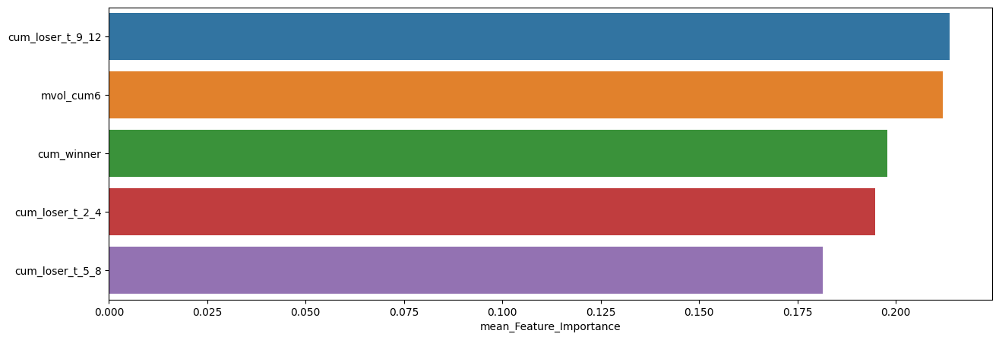

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.213791,0.238962,0.182322
mvol_cum6,0.212011,0.242743,0.190145
cum_winner,0.197922,0.220643,0.173265
cum_loser_t_2_4,0.194788,0.218567,0.176219
cum_loser_t_5_8,0.181488,0.208630,0.164973



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.24      0.29        96
         1.0       0.55      0.69      0.61       132

    accuracy                           0.50       228
   macro avg       0.46      0.46      0.45       228
weighted avg       0.47      0.50      0.48       228


accuracy : 0.5

precision : 0.5548780487804879

recall : 0.6893939393939394

F1-Score : 0.6148648648648649



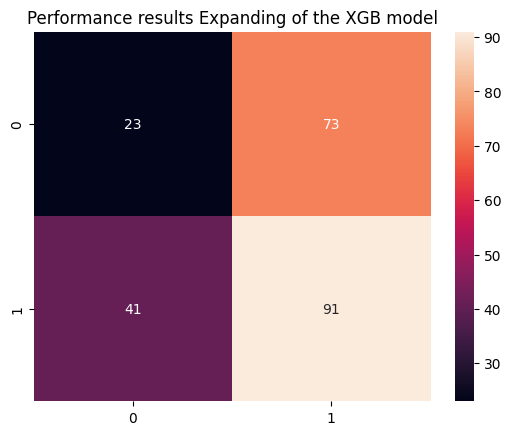


Feature Importance of the model



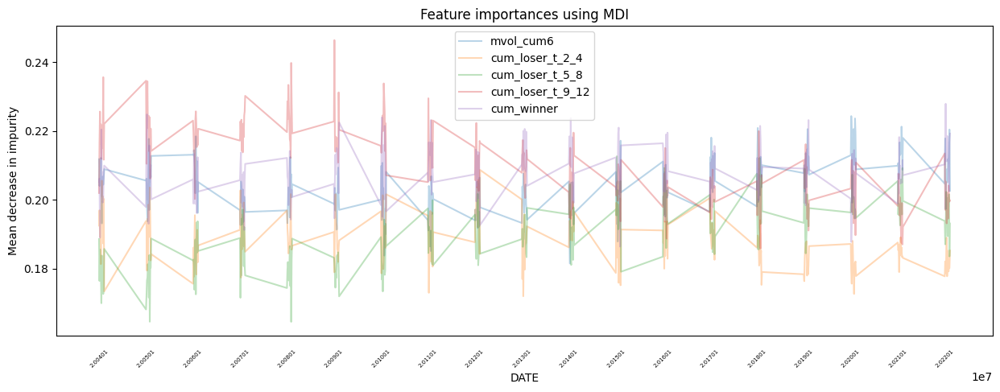

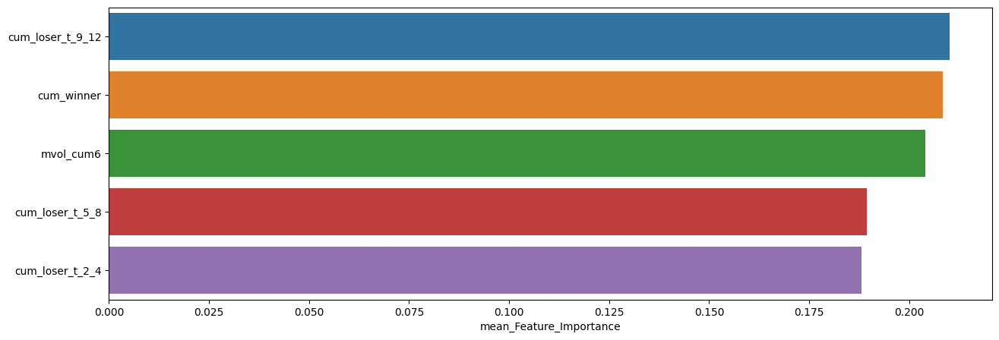

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,0.210184,0.246429,0.185861
cum_winner,0.208310,0.227909,0.186381
mvol_cum6,0.204107,0.224328,0.181481
cum_loser_t_5_8,0.189306,0.212655,0.164504
cum_loser_t_2_4,0.188093,0.208669,0.171951


In [59]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



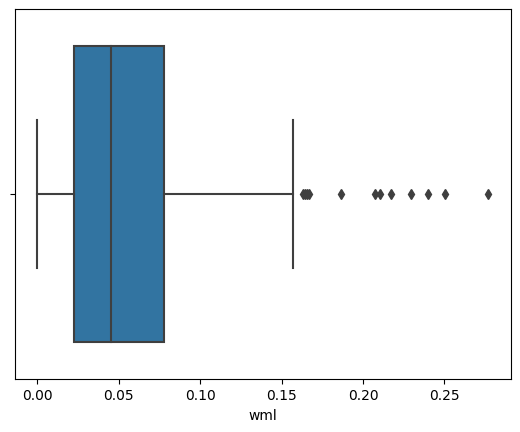

,count,mean,std,min,25%,50%,75%,max
wml,446.0,0.054631,0.044137,0.000007,0.022328,0.045416,0.077709,0.276912



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



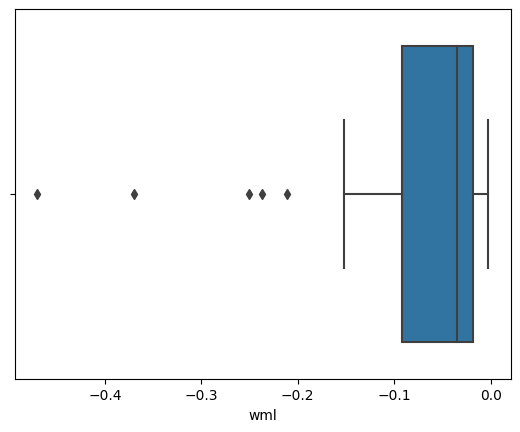

,count,mean,std,min,25%,50%,75%,max
wml,83.0,-0.064218,0.078005,-0.469903,-0.091715,-0.034597,-0.0182,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



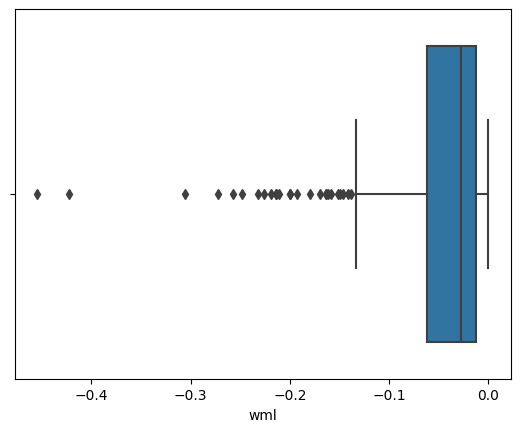

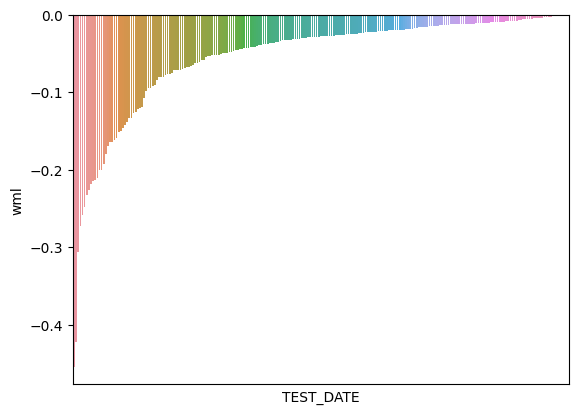

,count,mean,std,min,25%,50%,75%,max
wml,233.0,-0.053494,0.068621,-0.454349,-0.061666,-0.027746,-0.012856,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



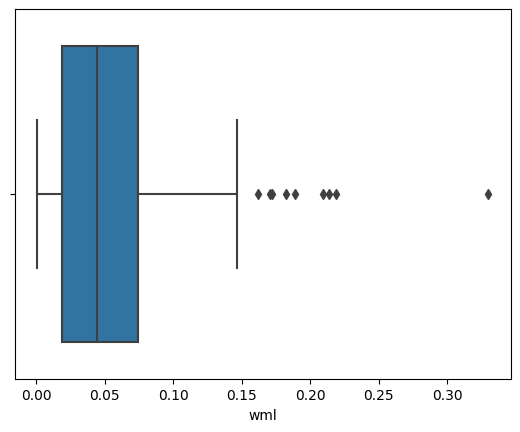

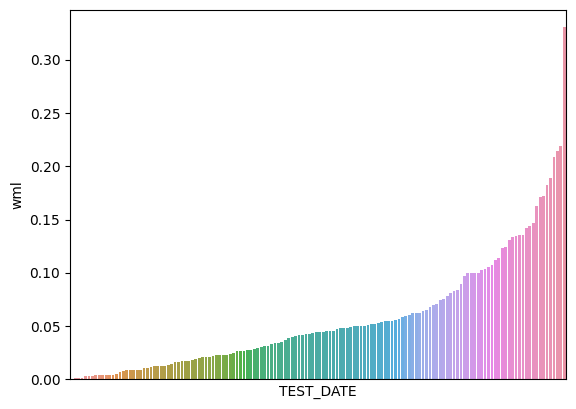

,count,mean,std,min,25%,50%,75%,max
wml,144.0,0.057166,0.054394,0.000692,0.018649,0.044367,0.074495,0.330163


In [60]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.56893

최근 누적 수익률

  2022년-12월 -> 18436.70
  2022년-11월 -> 16611.05
  2022년-10월 -> 15800.57
  2022년-09월 -> 13991.09
  2022년-08월 -> 13991.09

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2007년-12월 -> 68345.56
  2등 : 2008년-06월 -> 68044.30
  3등 : 2007년-11월 -> 63453.40
  4등 : 2008년-09월 -> 62826.56
  5등 : 2008년-11월 -> 62826.56
  6등 : 2008년-10월 -> 62826.56
  7등 : 2009년-01월 -> 61339.49
  8등 : 2009년-02월 -> 61339.49
  9등 : 2008년-12월 -> 61339.49
  10등 : 2008년-05월 -> 58426.74



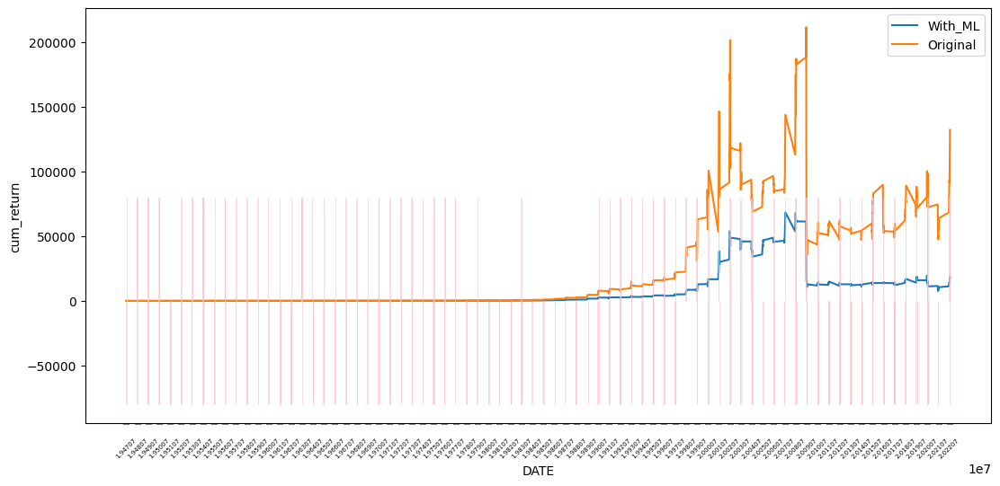

In [61]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.66353

최근 누적 수익률

  2022년-12월 -> 12871.17
  2022년-11월 -> 11732.26
  2022년-10월 -> 11195.43
  2022년-09월 -> 10477.70
  2022년-08월 -> 10266.20

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-06월 -> 24686.03
  2등 : 2009년-02월 -> 24517.70
  3등 : 2008년-11월 -> 24484.90
  4등 : 2009년-01월 -> 24224.29
  5등 : 2008년-12월 -> 24123.76
  6등 : 2008년-10월 -> 23876.17
  7등 : 2007년-12월 -> 23324.17
  8등 : 2008년-09월 -> 23317.87
  9등 : 2008년-05월 -> 22422.79
  10등 : 2008년-04월 -> 22360.23



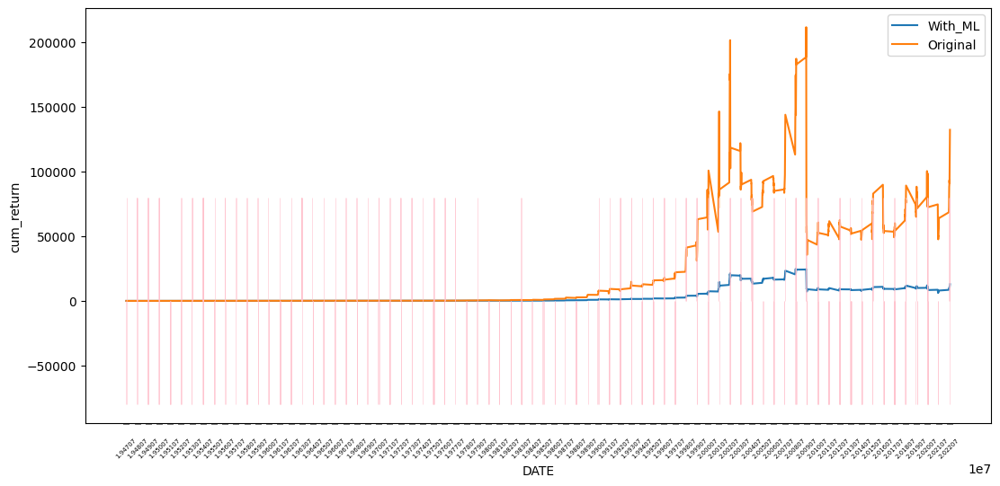

In [62]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [63]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.24      0.28       316
         1.0       0.65      0.76      0.70       590

    accuracy                           0.58       906
   macro avg       0.50      0.50      0.49       906
weighted avg       0.54      0.58      0.56       906


accuracy : 0.5783664459161147

precision : 0.6507246376811594

recall : 0.7610169491525424

F1-Score : 0.7015625



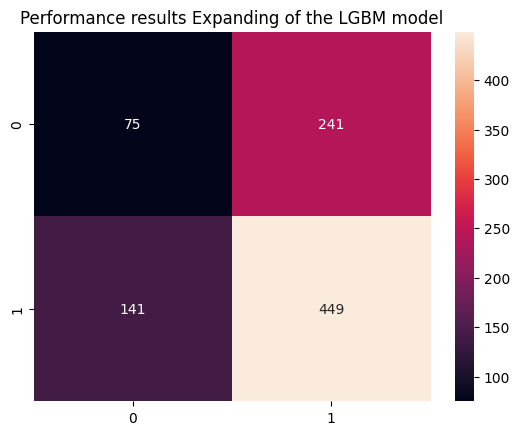


Feature Importance of the model



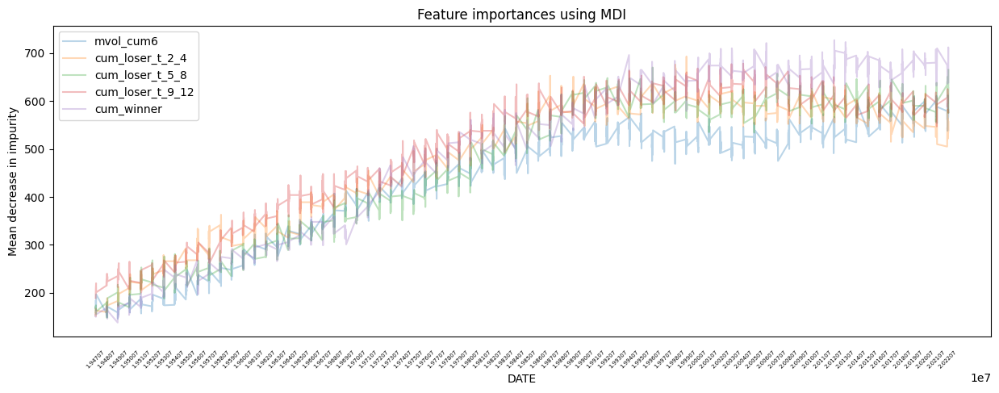

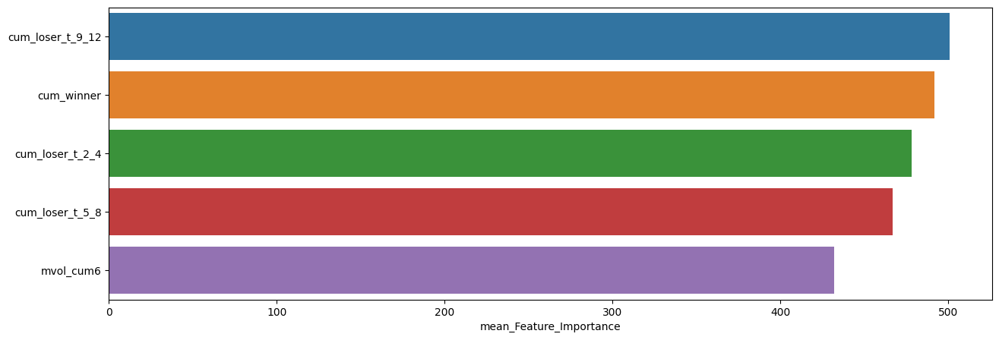

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,500.995585,678,189
cum_winner,491.934879,727,138
cum_loser_t_2_4,478.000000,693,152
cum_loser_t_5_8,466.824503,670,148
mvol_cum6,431.826711,612,146


In [64]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.24      0.27        75
         1.0       0.66      0.72      0.69       151

    accuracy                           0.56       226
   macro avg       0.48      0.48      0.48       226
weighted avg       0.54      0.56      0.55       226


accuracy : 0.5619469026548672

precision : 0.6566265060240963

recall : 0.7218543046357616

F1-Score : 0.6876971608832807



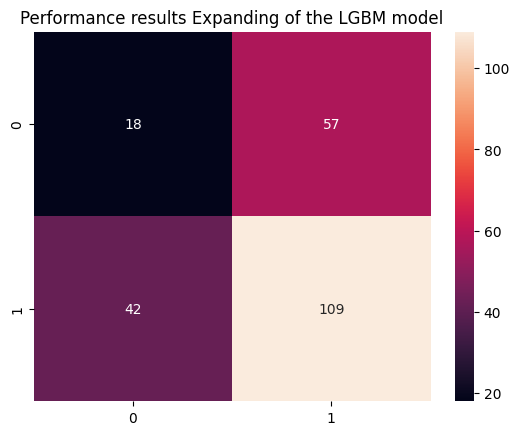


Feature Importance of the model



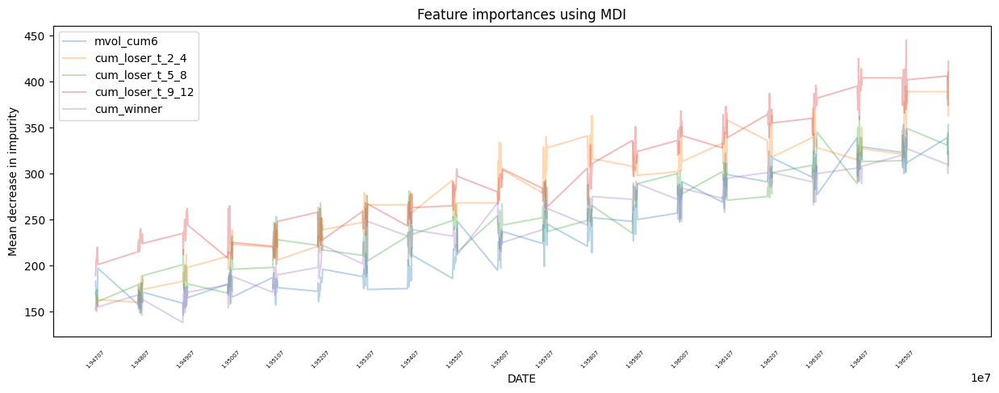

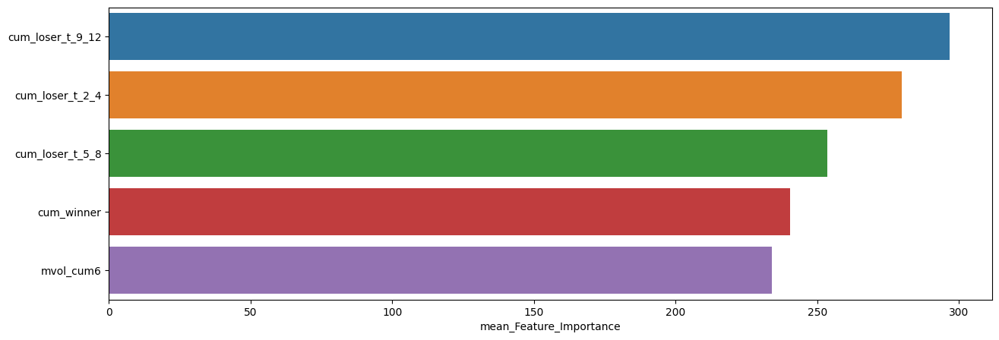

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,296.827434,445,189
cum_loser_t_2_4,279.685841,410,152
cum_loser_t_5_8,253.530973,362,148
cum_winner,240.508850,348,138
mvol_cum6,234.070796,353,146



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.27      0.31        75
         1.0       0.68      0.78      0.73       151

    accuracy                           0.61       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.61      0.59       226


accuracy : 0.6106194690265486

precision : 0.6820809248554913

recall : 0.7814569536423841

F1-Score : 0.7283950617283951



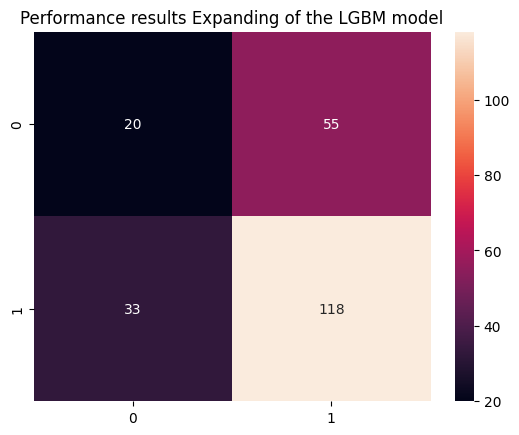


Feature Importance of the model



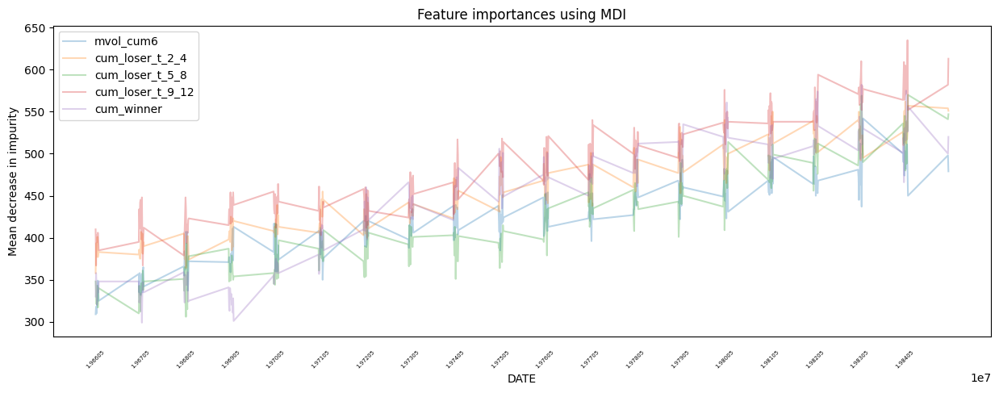

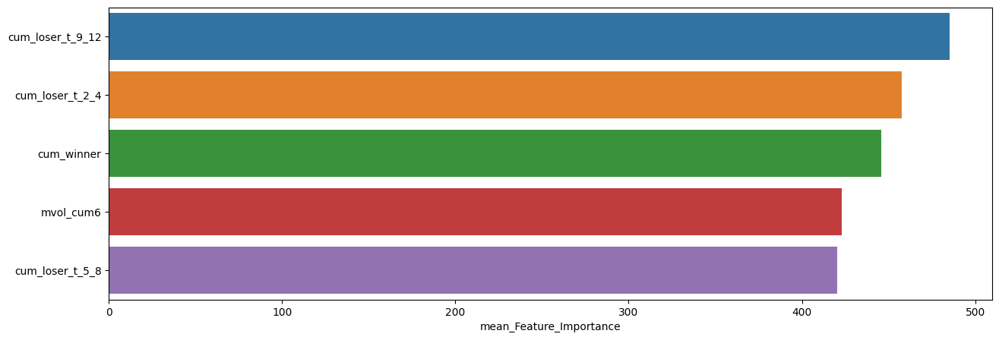

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_loser_t_9_12,485.491150,635,367
cum_loser_t_2_4,457.707965,562,358
cum_winner,445.623894,582,299
mvol_cum6,422.800885,542,309
cum_loser_t_5_8,420.221239,570,306



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.23      0.29        70
         1.0       0.71      0.83      0.76       156

    accuracy                           0.65       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.61      0.65      0.62       226


accuracy : 0.6460176991150443

precision : 0.7065217391304348

recall : 0.8333333333333334

F1-Score : 0.7647058823529412



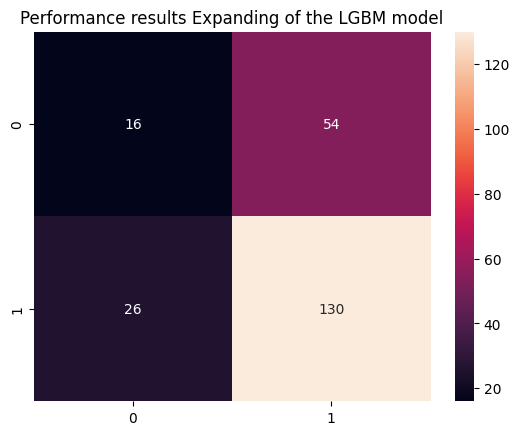


Feature Importance of the model



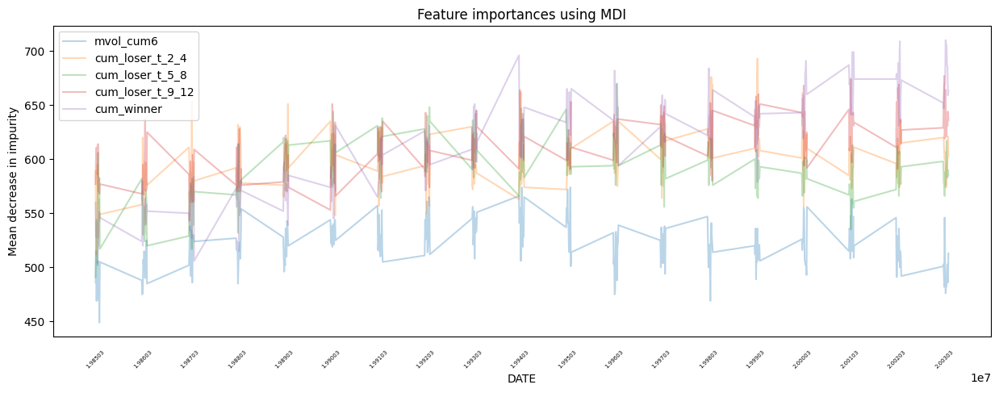

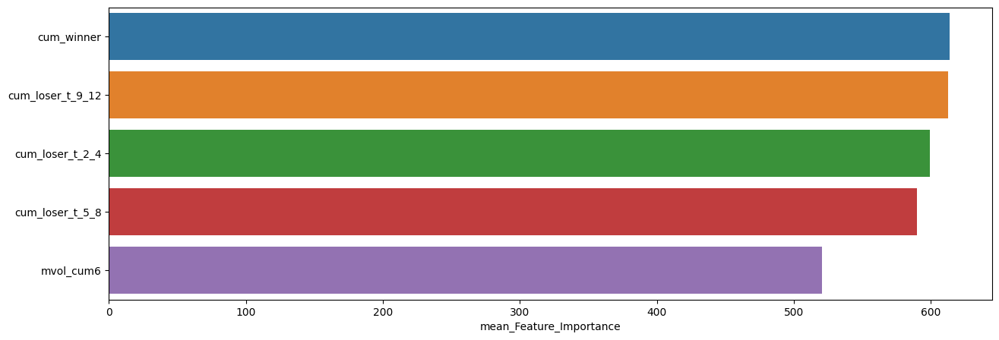

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,614.057522,710,504
cum_loser_t_9_12,612.787611,677,543
cum_loser_t_2_4,599.256637,693,512
cum_loser_t_5_8,589.668142,670,491
mvol_cum6,520.508850,574,449



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.22      0.27        96
         1.0       0.55      0.70      0.62       132

    accuracy                           0.50       228
   macro avg       0.45      0.46      0.44       228
weighted avg       0.46      0.50      0.47       228


accuracy : 0.4956140350877193

precision : 0.5508982035928144

recall : 0.696969696969697

F1-Score : 0.6153846153846154



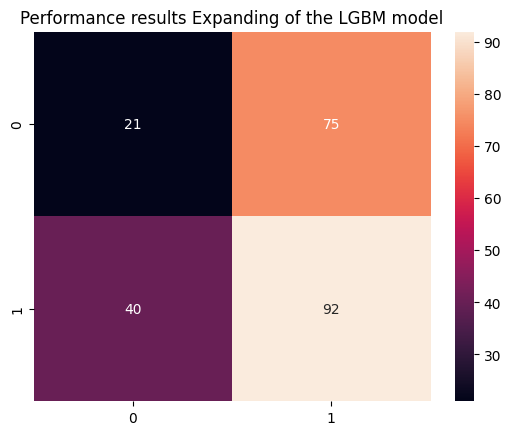


Feature Importance of the model



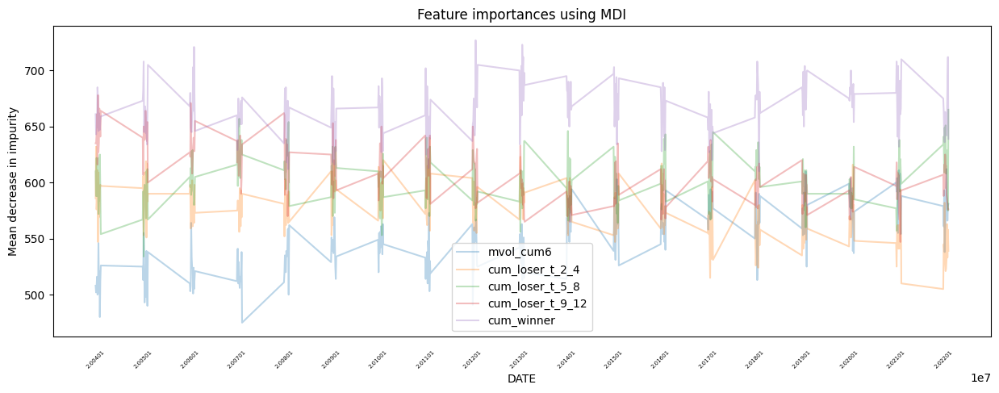

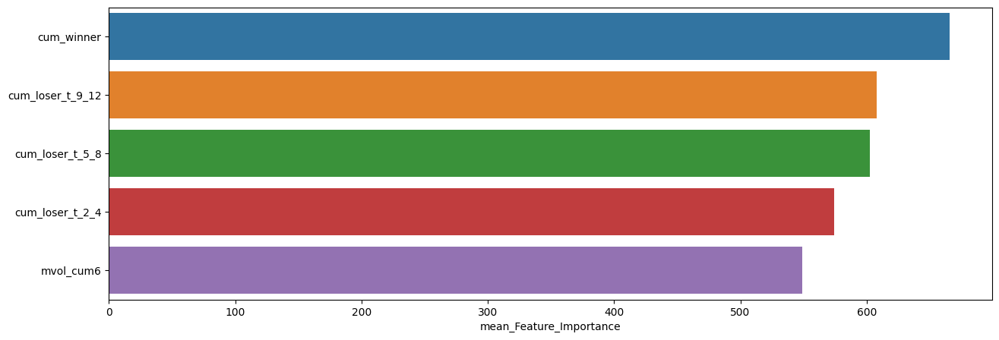

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,666.008772,727,610
cum_loser_t_9_12,607.929825,678,547
cum_loser_t_5_8,602.675439,665,534
cum_loser_t_2_4,574.495614,640,505
mvol_cum6,548.890351,612,475


In [65]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



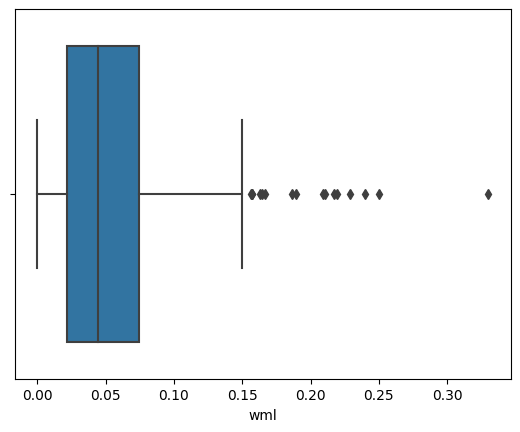

,count,mean,std,min,25%,50%,75%,max
wml,449.0,0.054158,0.045659,0.000007,0.022009,0.044264,0.074403,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



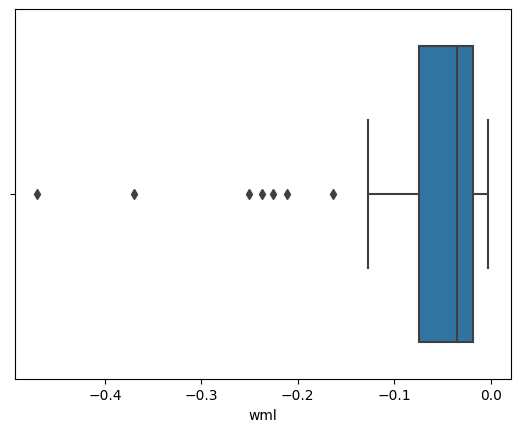

,count,mean,std,min,25%,50%,75%,max
wml,75.0,-0.064541,0.081439,-0.469903,-0.0748,-0.034597,-0.0182,-0.002454



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



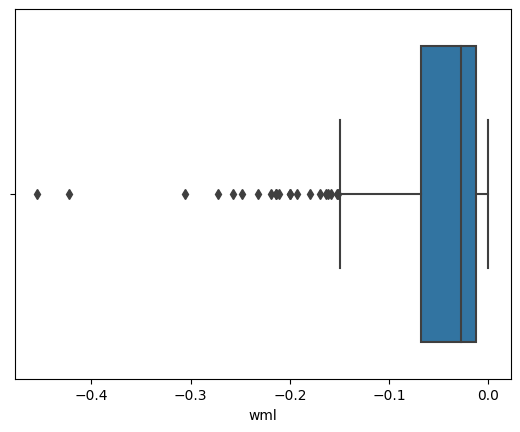

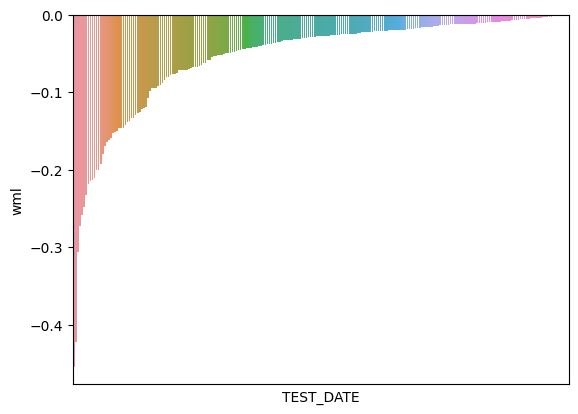

,count,mean,std,min,25%,50%,75%,max
wml,241.0,-0.05375,0.067731,-0.454349,-0.06765,-0.027259,-0.012856,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



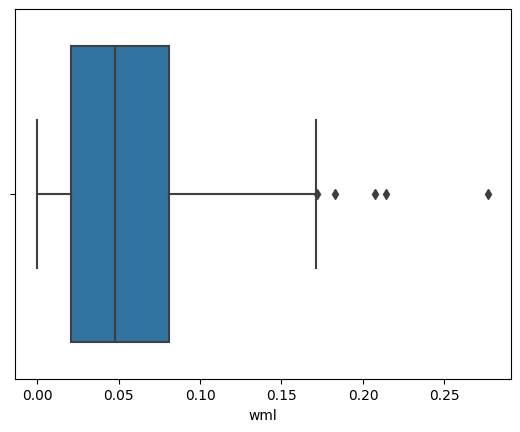

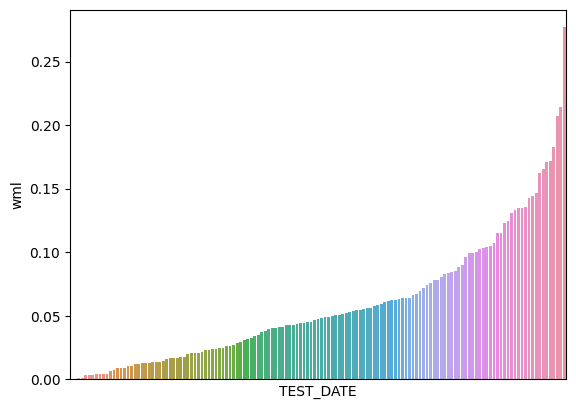

,count,mean,std,min,25%,50%,75%,max
wml,141.0,0.058727,0.050319,0.000221,0.020642,0.0479,0.080792,0.276912


In [66]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.60206

최근 누적 수익률

  2022년-12월 -> 10356.09
  2022년-11월 -> 9330.55
  2022년-10월 -> 8875.28
  2022년-09월 -> 7858.83
  2022년-08월 -> 7858.83

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-06월 -> 35292.34
  2등 : 2002년-07월 -> 35292.34
  3등 : 2002년-08월 -> 34269.86
  4등 : 2002년-09월 -> 34269.86
  5등 : 2002년-12월 -> 31969.48
  6등 : 2003년-02월 -> 31269.68
  7등 : 2003년-03월 -> 31269.68
  8등 : 2003년-01월 -> 31269.68
  9등 : 2002년-05월 -> 30347.15
  10등 : 2002년-04월 -> 30347.15



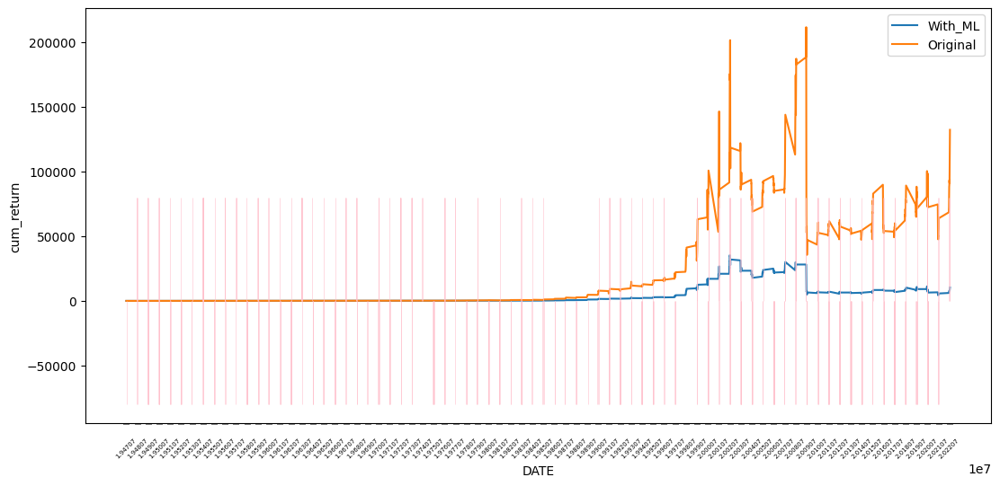

In [67]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.68008

최근 누적 수익률

  2022년-12월 -> 7666.18
  2022년-11월 -> 7075.55
  2022년-10월 -> 6781.82
  2022년-09월 -> 6240.11
  2022년-08월 -> 6089.63

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-06월 -> 13990.00
  2등 : 2009년-02월 -> 13787.42
  3등 : 2002년-09월 -> 13717.77
  4등 : 2002년-07월 -> 13443.46
  5등 : 2007년-12월 -> 13365.89
  6등 : 2002년-06월 -> 13326.01
  7등 : 2008년-11월 -> 13316.87
  8등 : 2009년-01월 -> 13304.10
  9등 : 2002년-08월 -> 13195.73
  10등 : 2008년-12월 -> 13184.90



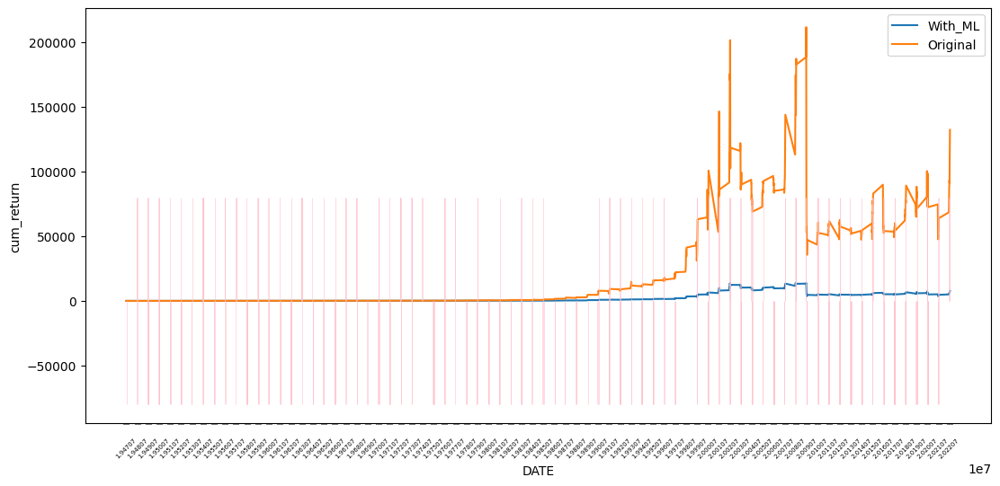

In [68]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7059736229635376
GBC의 F1-Score : 0.7067901234567902
XGB의 F1-Score : 0.6784282277465918
LGBM의 F1-Score : 0.6962025316455696



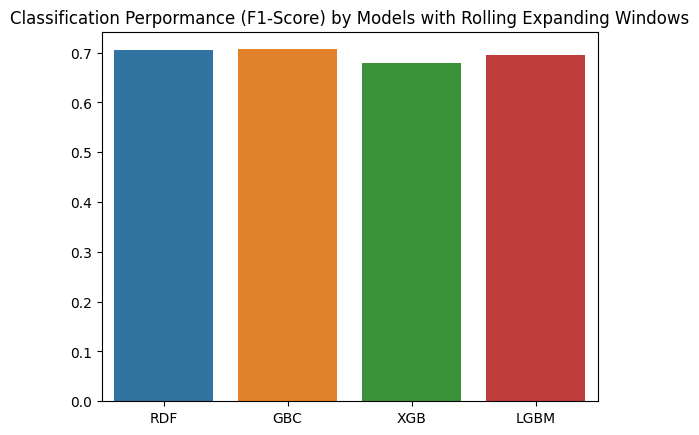

In [69]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7287753568745305
GBC의 F1-Score : 0.74800290486565
XGB의 F1-Score : 0.7029156816390858
LGBM의 F1-Score : 0.7015625



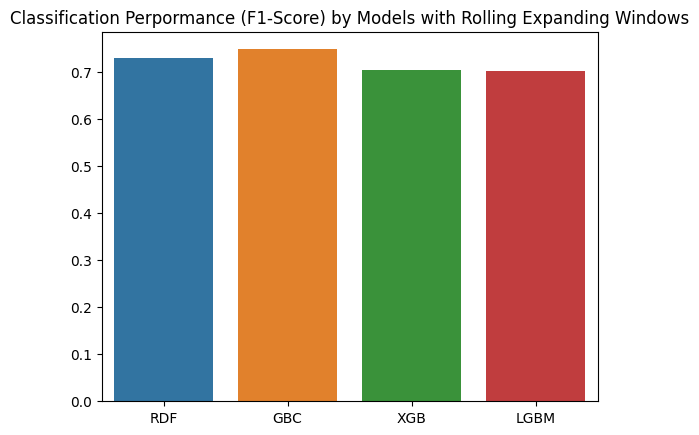

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [71]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [72]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.6712  최종 누적 수익률 : 10776.070998495328
GBC Sharpe Ratio : 0.6722  최종 누적 수익률 : 7835.365668531652
XGB Sharpe Ratio : 0.6332  최종 누적 수익률 : 4173.348432256508
LGBM Sharpe Ratio : 0.6443  최종 누적 수익률 : 6353.54639372941


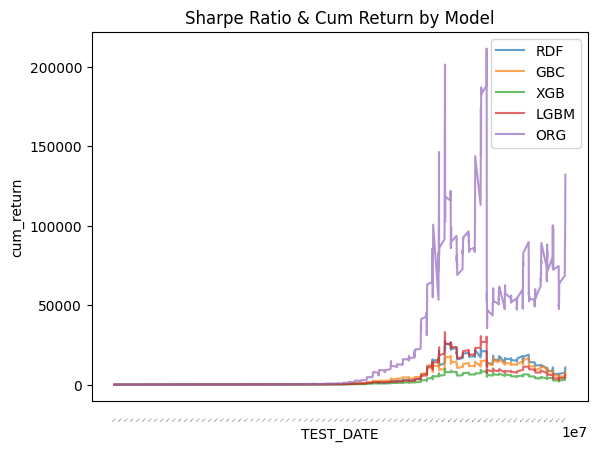

In [73]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7713  최종 누적 수익률 : 4863.638960894595
GBC Sharpe Ratio : 0.7684  최종 누적 수익률 : 5668.544974939544
XGB Sharpe Ratio : 0.6788  최종 누적 수익률 : 4506.495639286415
LGBM Sharpe Ratio : 0.7120  최종 누적 수익률 : 4581.206451875234


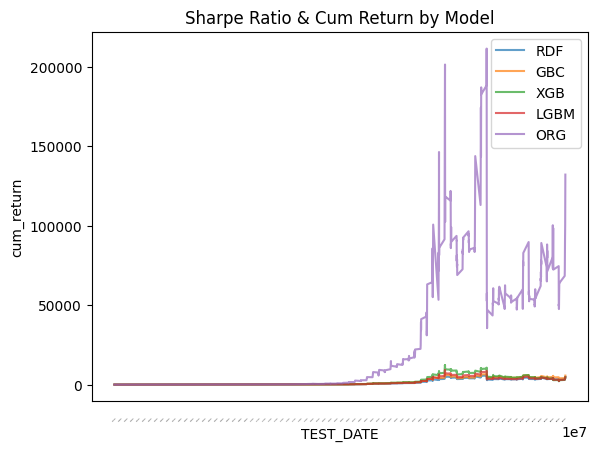

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7340  최종 누적 수익률 : 40639.69348184354
GBC Sharpe Ratio : 0.7436  최종 누적 수익률 : 74088.11804031968
XGB Sharpe Ratio : 0.7022  최종 누적 수익률 : 18436.70414801198
LGBM Sharpe Ratio : 0.6614  최종 누적 수익률 : 10356.08621715811


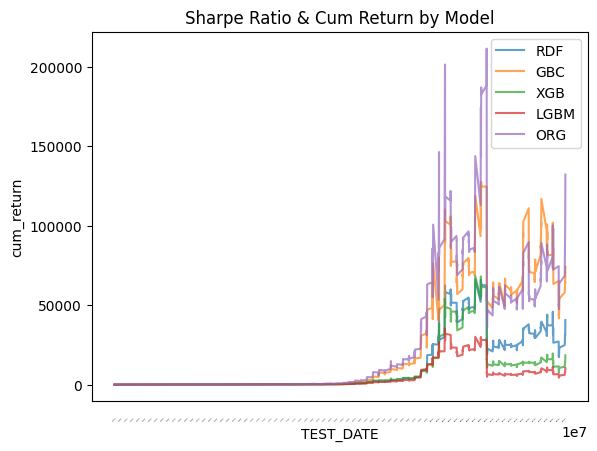

In [75]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.8076  최종 누적 수익률 : 7211.690189005899
GBC Sharpe Ratio : 0.7605  최종 누적 수익률 : 6729.389933037858
XGB Sharpe Ratio : 0.7770  최종 누적 수익률 : 12871.169551857462
LGBM Sharpe Ratio : 0.7445  최종 누적 수익률 : 7666.182706079931


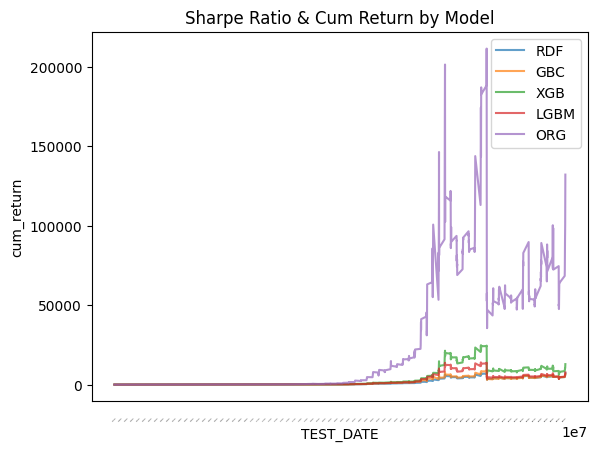

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)